In [2]:
import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [3]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

## Looking for ETVs in TIC 38383256


In [4]:
# define the plotting parameters

figsize = (8,4)

In [12]:
# import the data

# choose a TIC ID to analyze
ticid = 38383256

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')  
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../
import astropy.units as u


sr = lk.search_lightcurve('TIC {}'.format(ticid))  # get long cadence data too
sr = lke.filter_by_priority(sr, author_priority=['SPOC', 'TESS-SPOC'], exptime_priority=['short', 'long', 'fast'])
# sr = sr[sr.exptime != 1800 *u.s]  # exclude 30min cadence data for now (TESS-SPOC, sectors 18, 19, 23 )
sr = sr[np.isin(sr.author, ['SPOC', 'TESS-SPOC'])]  # exclude 1 QLP (sector 70), the depth is notciably different
sr = sr[sr.table["sequence_number"] < 70]  # the initial analysis ended with sector 43. Excluding newer data in S70 for now
sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
display(sr)
lcc_tess = sr.download_all()
lc_tess = lcc_tess.stitch()
# lc_tess = lc_tess.truncate(None, 1450)  # use data from sectors 2 - 3 for now


search_result = lc_tess

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 03,2018,TESS-SPOC,1800,38383256,0.0,N/A
1,TESS Sector 30,2020,SPOC,120,38383256,0.0,G03272
2,TESS Sector 42,2021,SPOC,120,38383256,0.0,G04191
3,TESS Sector 43,2021,SPOC,120,38383256,0.0,G04191


53831

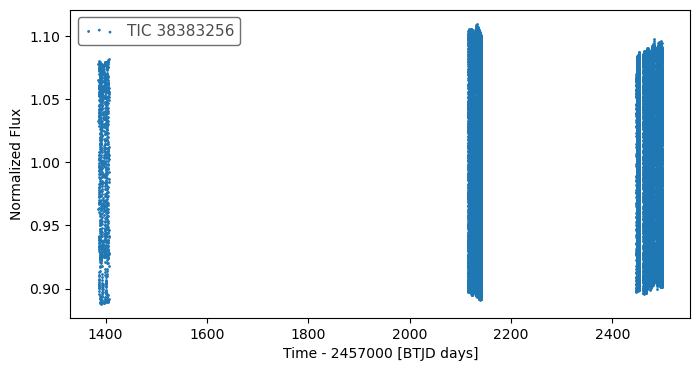

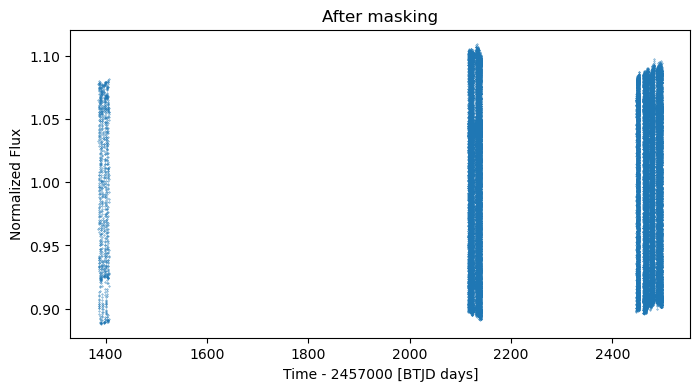

In [13]:
%matplotlib inline
# %matplotlib widget

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

mask = time < 0  #( time > 54950) & (time < 54963)  #  truncate weird spikes at the beginning of Kepler data  
# mask = flux < 0.85    # remove occassional outliers

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})

ax2 = plt.figure(figsize=figsize).gca()
ax2.scatter(data.time, data.flux, s=0.1);
ax2.set_ylabel(ax.get_ylabel())
ax2.set_xlabel(ax.get_xlabel())
ax2.set_title("After masking");

In [ ]:
do_bls = False

if do_bls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg_runner as lke_pg_runner  # at ../../

    bls_result = lke_pg_runner.run_bls(
        search_result.remove_nans(),
        pg_kwargs=dict(
            minimum_period=1, maximum_period=20,
            frequency_factor=1,            
            duration=[3.4957 / 24 * f for f in [0.975, 1, 1.025, 1.05, 1.1, 1.15,]],  # based on observed primary eclipse duration for better fit
        ),
    )
    !$NOTIFY_CMD  "BLS Done"

In [ ]:
# Visaully compare different candidate period

# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418132651611877).truncate(-0.1, 0.1).scatter(label="BLS period, frequency_factor=10");  # HWHM 0.001571020094789155
# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418147).truncate(-0.1, 0.1).scatter(label="s0001-s0009:TCE1");

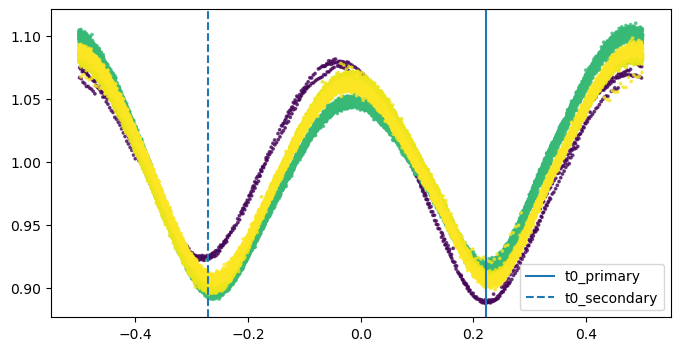

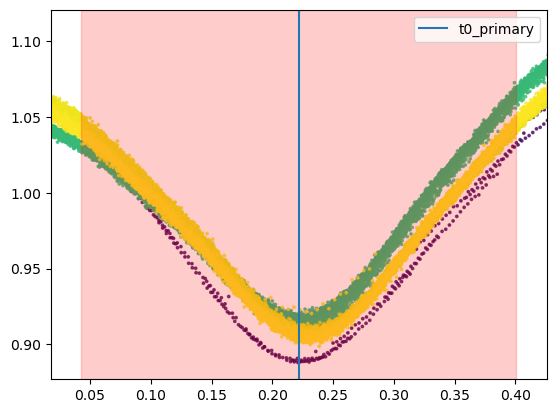

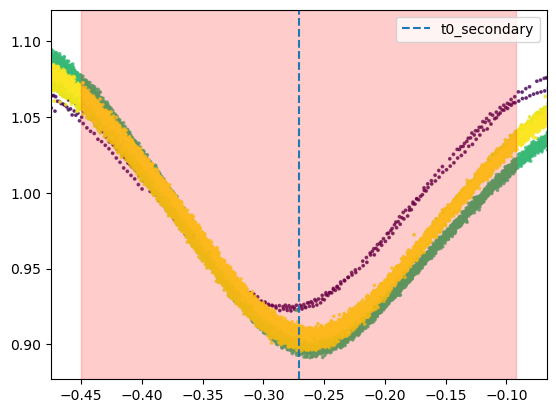

In [14]:
%matplotlib inline
# %matplotlib widget

from astropy.time import Time

# define the orbital period and the t0 

# epoch=2116.1319, duration_hr=0.5036, period=0.290867, label="s0001-s0046:TCE1",
# epoch=2116.1009, duration_hr=0.5491, period=0.290771, label="s0001-s0046:TCE2",
# VSX: 0.29076828 
# LS (nterms=2): 0.2907845871433856
# ASAS-SN V: 0.2907787
# MCMC on df_primary: 0.2907786859925851 , with relatively large error of ~4e-5
# MCMC, 2nd run:      0.2907786693840768, error in the range of ~3e-9
# FILL-IN THE eclipse epoch / period, 
period = 0.2907787  # ASAS-SN V, MCMC

t0_primary = 1386.2376  # from MCMC,   s0042-s0043:TCE1: 2447.8692 
t0_secondary = t0_primary + 0.1475


# convert epoch from BTJD to commonly mjd used here
# t0_primary = Time(t0_primary, format="btjd").to_value("mjd")
# t0_secondary = Time(t0_secondary, format="btjd").to_value("mjd")

# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
if t0_secondary is not None:
    t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

duration_hr_primary = 2.5
duration_hr_secondary = 2.5

# t0_for_plotting = 0  # keep 0 for plotting purposes
t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.45  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
t1_p, t4_p = etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.5 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.5 * duration_hr_primary / 24/ period 
plt.xlim(t1_p - 0.025, t4_p + 0.025);
plt.axvspan(t1_p, t4_p, color="red", alpha=0.2);plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
t1_s, t4_s = etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.5 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.5 * duration_hr_secondary / 24/ period 
plt.xlim(t1_s - 0.025, t4_s + 0.025);
plt.axvspan(t1_s, t4_s, color="red", alpha=0.2);plt.legend();
plt.legend();
# plt.ylim(0.975, 1.005);
plt.show()

### Compare folded plots across sectors

In [ ]:
with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(lcc_tess), figsize=(4 * len(lcc_tess), 3), sharey=True);
    if isinstance(axs, plt.Axes):
        axs = [axs]
    for i, lc in enumerate(lcc_tess):
        lc_f = lc.select_flux("flux").normalize(unit="percent").fold(period=period, epoch_time=t0_primary)
        lc_f = lc_f.truncate(-duration_hr_primary * 2 / 24, duration_hr_primary * 2 / 24)
        ax = lc_f.scatter(ax=axs[i], s=1, label=f"S.{lc_f.sector}");
        ax.legend(loc="lower right");
        if i > 0: 
            ax.set_ylabel(None)
            ax.set_xlabel(None)
    fig.suptitle(f"{lc.label}, folded around primary eclipses");
plt.tight_layout();

# ---
with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(lcc_tess), figsize=(4 * len(lcc_tess), 3), sharey=True);
    if isinstance(axs, plt.Axes):
        axs = [axs]
    for i, lc in enumerate(lcc_tess):
        lc_f = lc.select_flux("flux").normalize(unit="percent").fold(period=period, epoch_time=t0_secondary)
        lc_f = lc_f.truncate(-duration_hr_secondary * 2 / 24, duration_hr_secondary * 2 / 24)
        ax = lc_f.scatter(ax=axs[i], s=1, label=f"S.{lc_f.sector}");
        ax.legend(loc="lower right");
        if i > 0: 
            ax.set_ylabel(None)
            ax.set_xlabel(None)
    fig.suptitle(f"{lc.label}, folded around secondary eclipses");
plt.tight_layout();

### Detrend (optional)

- detrended flux is in `flux_detrended`, and won't be used in subsequent work by default

In [ ]:
# show data to visualize what's changed in each step below
data  

In [ ]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

In [ ]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

In [ ]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1, label="flux_detrended")
plt.legend()
plt.show()

plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.xlim(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.6 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.6 * duration_hr_primary / 24/ period);
plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.xlim(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.6 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.6 * duration_hr_secondary / 24/ period);
plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

<span style="background-color: rgba(255, 0, 0, 0.6);"> NOTE: </span> The zoom windows below for the eclipses are made **smaller**, an attempt to reduce the complications of EW variability outside the minima (and some assymetery)

### Now that the data is ready we can start 

Primary:   1386.2376 0.2217336242298127
window_width_p (phase): 0.4298801803570894
Secondary: 1386.0943213 -0.2710077629484177
window_width_s (phase): 0.4298801803570894


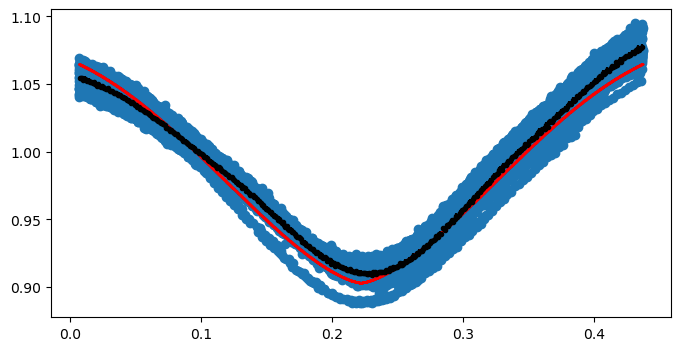

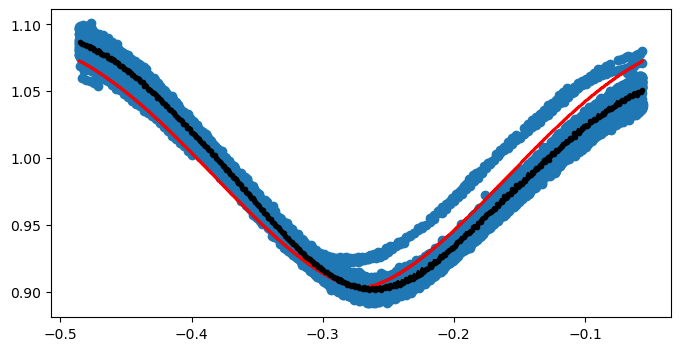

In [69]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
# midpoint_p -= 0.004  # the offset is added back to t0_primary (& secondary above
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width_p = 1.2 * duration_hr_primary / 24 / period   # it seems to be difficult to bit model the flat bottom and the curves outside, focus on the overall shape for now
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
# window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p / 2) & (data['phase'] < midpoint_p + window_width_p / 2) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)

    # the coshgauss model seems problematic, try to use a larger width to give it more shape to fit
    window_width_s = 1.2 * duration_hr_secondary / 24 / period  
    # window_width_s = 0.22
    print("window_width_s (phase):", window_width_s)
    
    data_secondary = data[(data['phase'] > midpoint_s - window_width_s / 2) & (data['phase'] < midpoint_s + window_width_s / 2) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# t0 in normalixed phase
start_vals = [1.0862, -0.183, midpoint_p, 0.1253, 0.7397]
start_vals_s = [1.098, -0.195, midpoint_s, 0.126, 0.793]


# -- -- -- -- -- -- -- -- -- 
etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
if t0_secondary is not None:
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)    

In [ ]:
if False: 
    # Export the data around primary eclipses, for period analysis outside of notebook
    data_primary[["time", "flux", "err"]].to_csv(f"tmp/data_primary_{ticid}.csv", index=False)

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 1500/1500 [14:42<00:00,  1.70it/s]


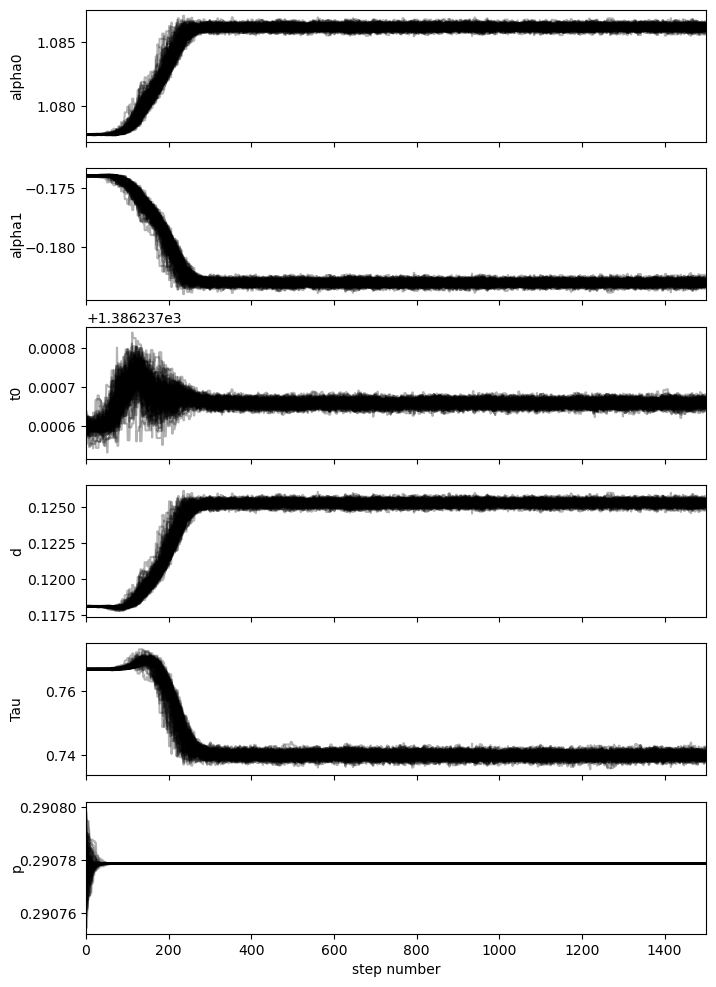

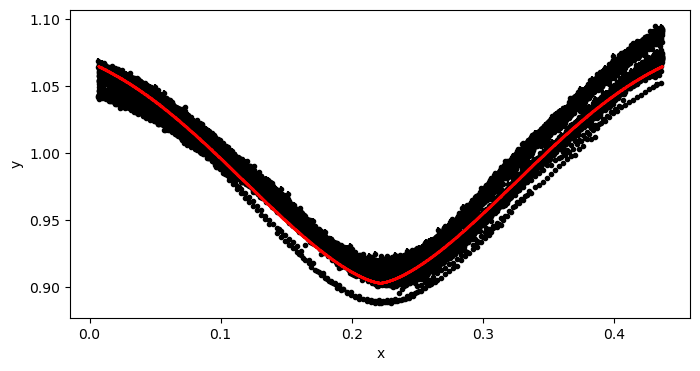

mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.0861860195525717, -0.18297761459383005, 1386.2376578040473, 0.1252664007180419, 0.7397465155511462, 0.2907786693840768
std_p: 2.8977958264034384e-09


In [57]:
# use MCMC to refine the period

use_mcmc_to_fit_period = True


if use_mcmc_to_fit_period:
    import etv_functions_with_period as etvp

    etv_functions.enable_info_log_for_jupyter()
        
    # MCMC result
    # mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.07780924941879, -0.1740988488555058, 1386.2376662005368, 0.11808812254600415, 0.7665454891118708, 0.2907786859925851
    # std_p: 4.065037052074161e-05
    # 2nd run (nruns=1500, discard=1000), usual first run's result as the starting points
    # mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.0861860195525717, -0.18297761459383005, 1386.2376578040473, 0.1252664007180419, 0.7397465155511462, 0.2907786693840768
    # std_p: 2.8977958264034384e-09    
    mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p, fit_params_p_stats = etvp.run_mcmc_initial_fit_p(
        data_primary[:],
        [1.0778, -0.174, t0_primary, 0.1181, 0.767, 0.2907787],
        nruns=1500, discard=1000, 
        # nruns=1000, discard=600, 
        # nruns=20, discard=1, 
        pool=4,
        plot_chains=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p]]))
    print("std_p:", fit_params_p_stats["std_p"])
    !$NOTIFY_CMD "Fitting period done."

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 1000/1000 [02:22<00:00,  7.00it/s]


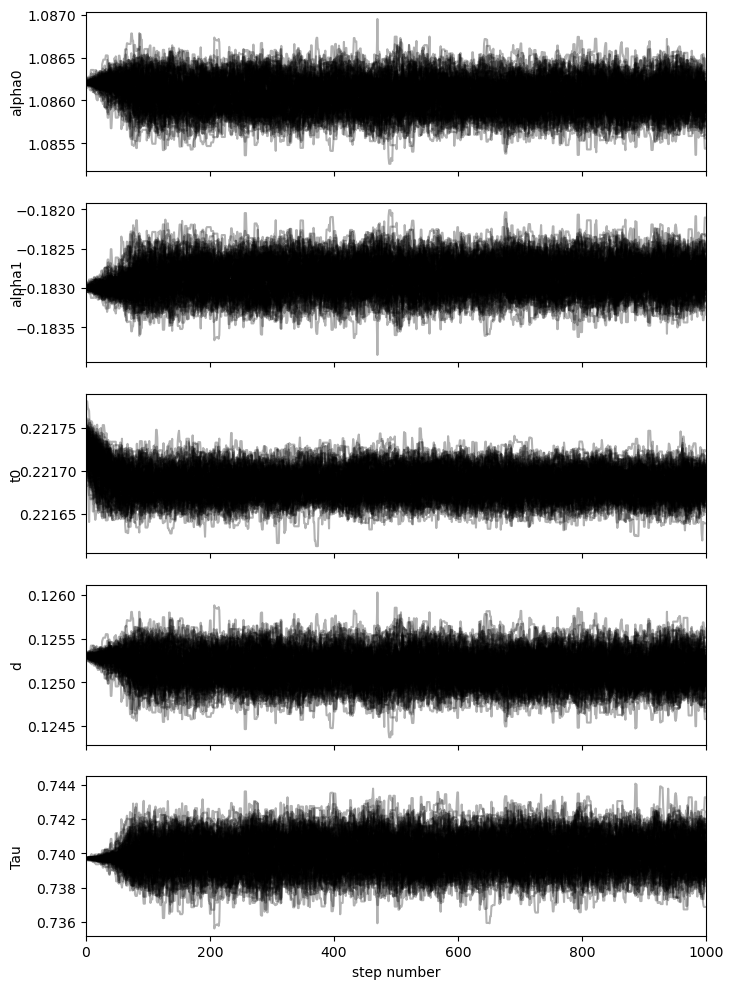

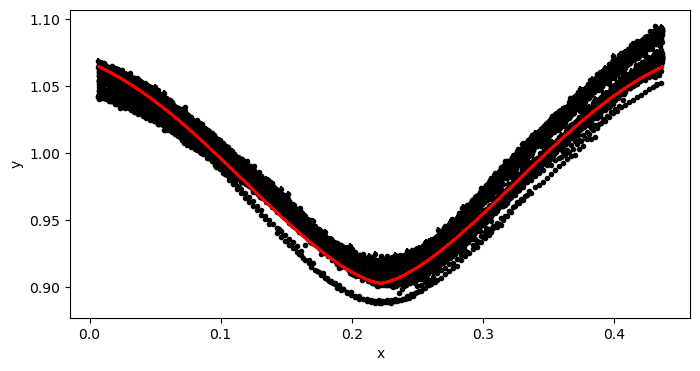

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 1000/1000 [02:20<00:00,  7.14it/s]


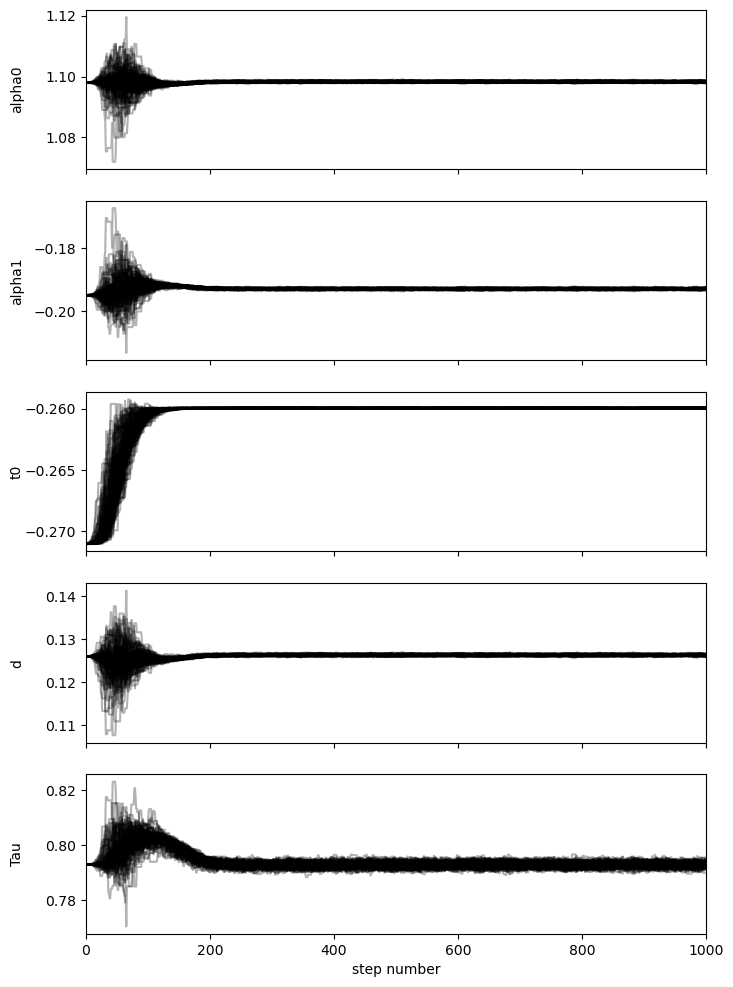

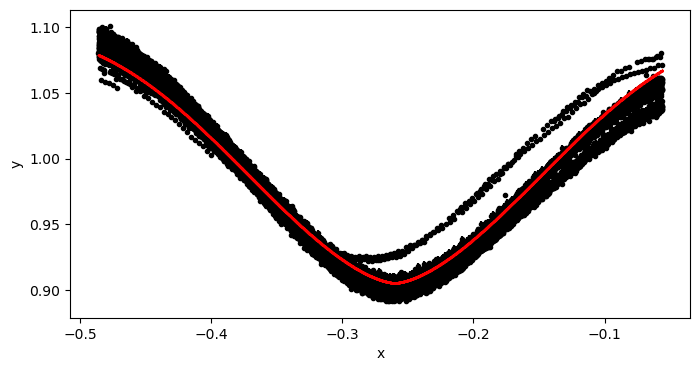

In [70]:
# run the initial model fit using MCMC for the primary and secondary eclipses 
run_init_fit = True

if run_init_fit:
    etv_functions.enable_info_log_for_jupyter()
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns = 1000, pool=-2, plot_chains = True, plot = True)
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns = 1000, pool=-2, plot_chains = True, plot = True)
    !$NOTIFY_CMD "Initial fit done"

In [ ]:
if not run_init_fit:  # case init fit has been previously saved and to be reussed
    print("Use pre-defined inital model params:")
    # initial fit params from TESS data
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0860468609118734, -0.18284371724120857, 0.22168431580507153, 0.12514614211690211, 0.7400164595444167
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0983218462122912, -0.1930138026884863, -0.25995837018406465, 0.12630208898697917, 0.7929011775071911

    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])    

In [71]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0860468609118734, -0.18284371724120857, 0.22168431580507153, 0.12514614211690211, 0.7400164595444167
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0983218462122912, -0.1930138026884863, -0.25995837018406465, 0.12630208898697917, 0.7929011775071911


3825

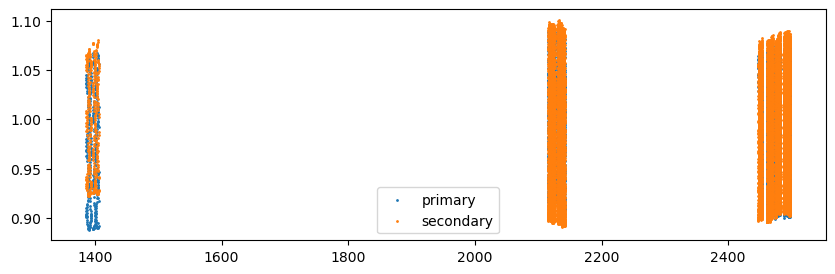

In [72]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
if t0_secondary is not None:
    plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

1386.2376 0.2907787 1386.2376


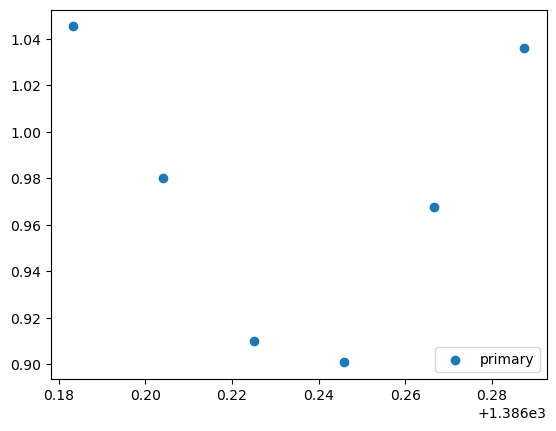

1386.2376 0.2907787 1386.5283786999998


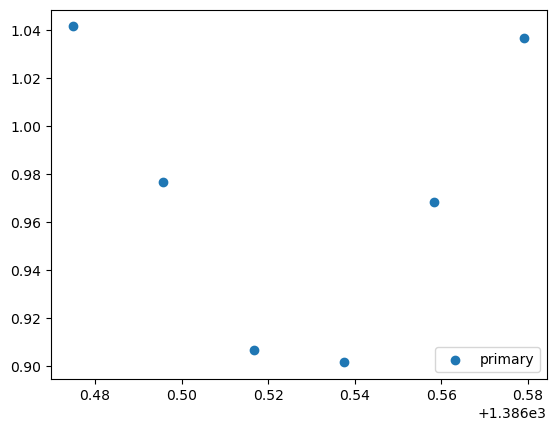

1386.2376 0.2907787 1386.8191574


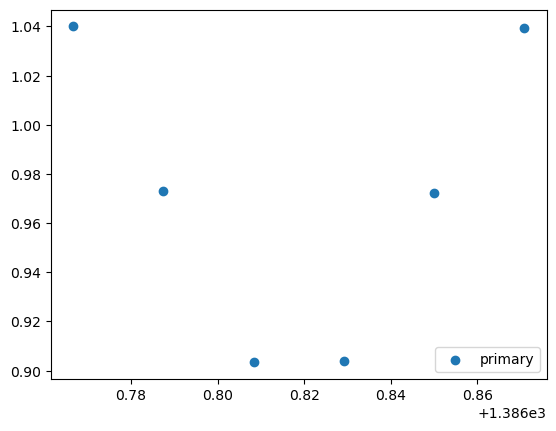

1386.0943213 0.2907787 1386.0943213


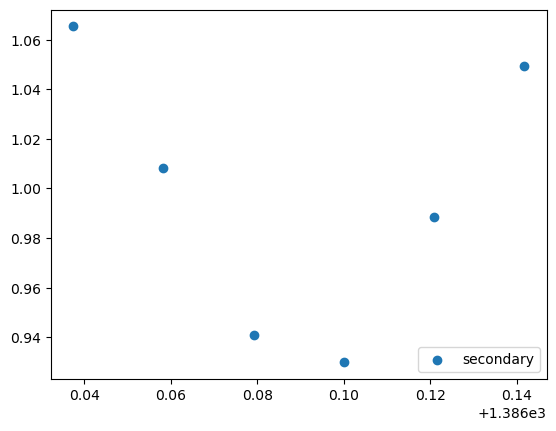

1386.0943213 0.2907787 1386.3851


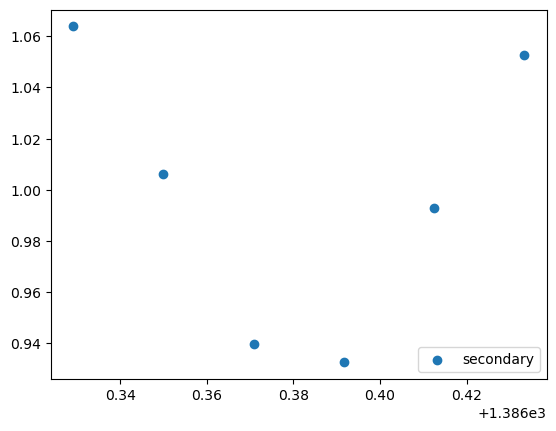

1386.0943213 0.2907787 1386.6758787


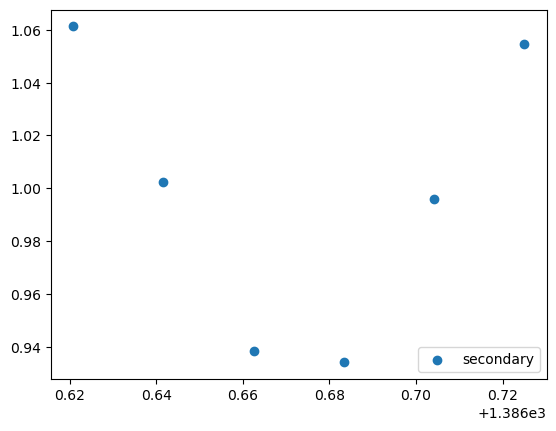

In [73]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

if t0_secondary is not None:
    for i in tr_index[0:3]:        
        transit_time = t0_secondary+(period*i)
        x = np.array(data_secondary.time)
        y = np.array(data_secondary.flux) 
        yerr = np.array(data_secondary.err)
        
        print (t0_secondary, period, transit_time)
        
        mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
        
        x = np.array(x[mask])
        y = np.array(y[mask]) 
        yerr = np.array(yerr[mask])
        fig, ax = plt.subplots()
        plt.scatter(x,y, label="secondary")
        plt.legend(loc="lower right")
        plt.show()

Fitting individual primary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
Number 1 has already been completed -- skip
Number 2 has already been completed -- skip
Number 3 has already been completed -- skip
1387.4007147999998 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.90it/s]


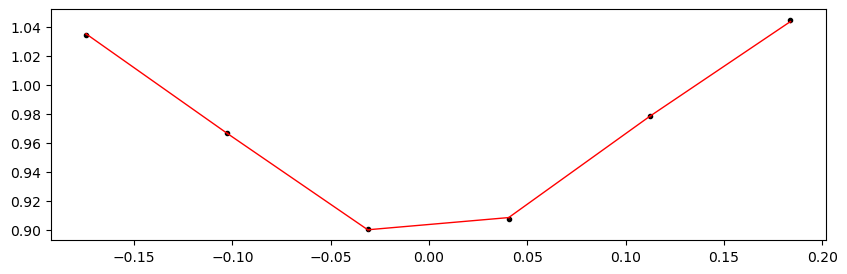

Time 1387.6914935 does not have enough data points: 5
1387.9822722 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.15it/s]


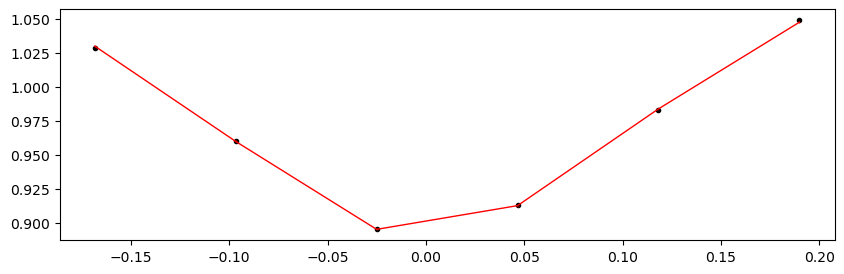

1388.2730508999998 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.80it/s]


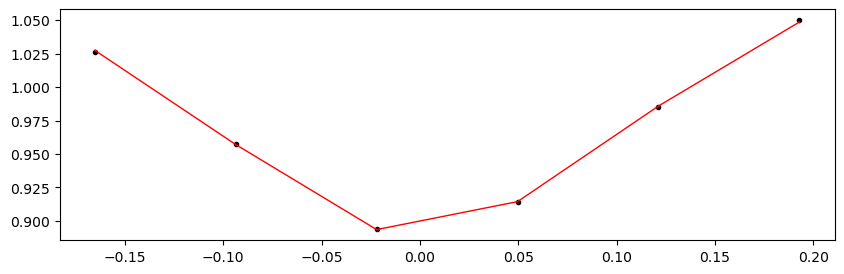

1388.5638296 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.09it/s]


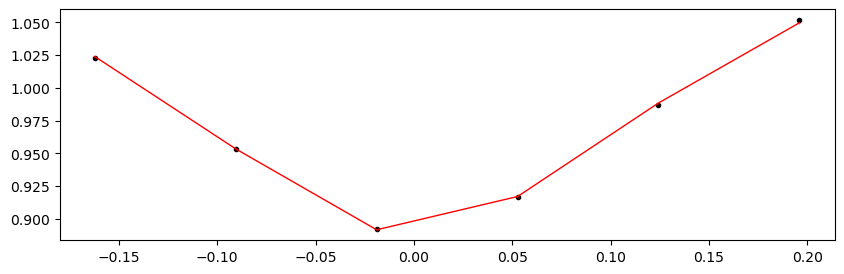

1388.8546082999999 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.20it/s]


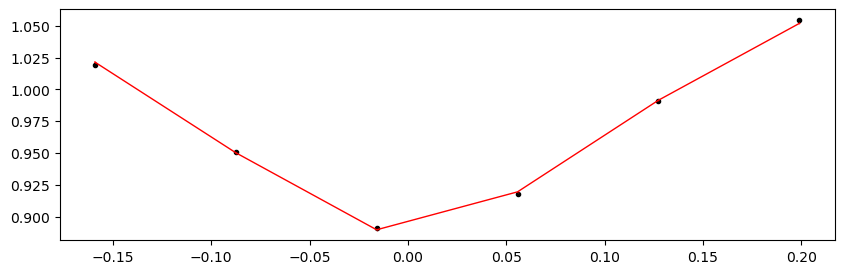

Time 1389.145387 does not have enough data points: 4
Time 1389.4361657 does not have enough data points: 4
Time 1389.7269443999999 does not have enough data points: 5
Time 1390.0177231 does not have enough data points: 3
Time 1390.3085018 does not have enough data points: 4
Time 1390.5992804999998 does not have enough data points: 5
Time 1390.8900592 does not have enough data points: 5
Time 1391.1808379 does not have enough data points: 5
Time 1391.4716165999998 does not have enough data points: 5
Time 1391.7623953 does not have enough data points: 5
1392.053174 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.55it/s]


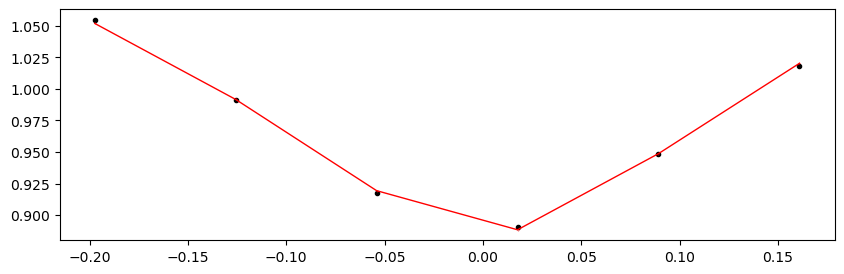

Time 1392.3439526999998 does not have enough data points: 4
1392.6347314 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.10it/s]


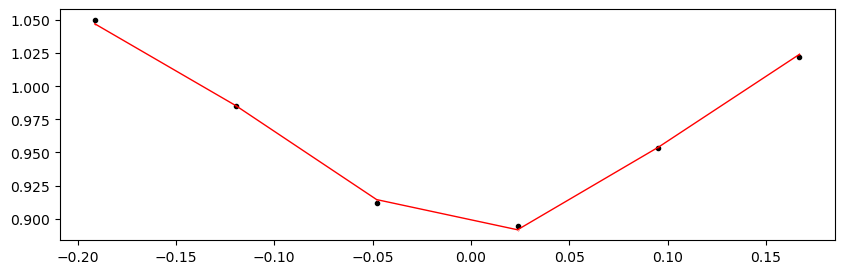

1392.9255100999999 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.95it/s]


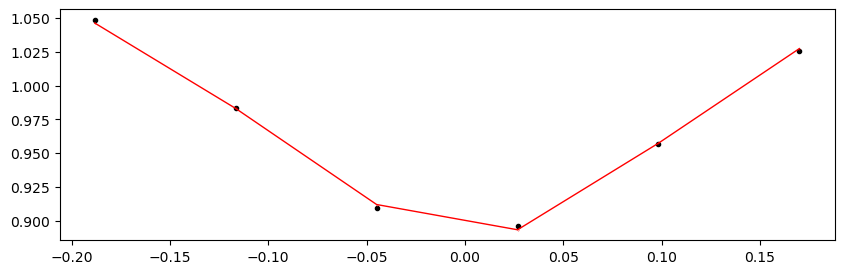

1393.2162888 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.63it/s]


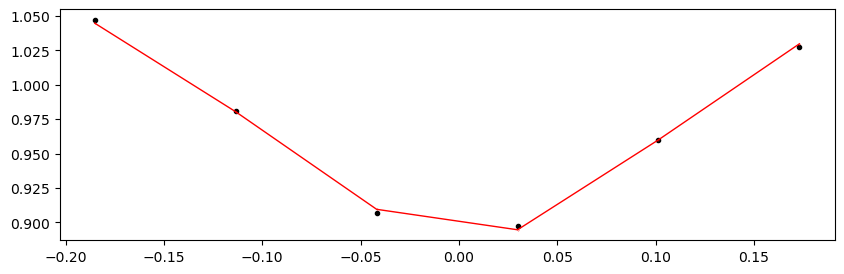

1393.5070675 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.27it/s]


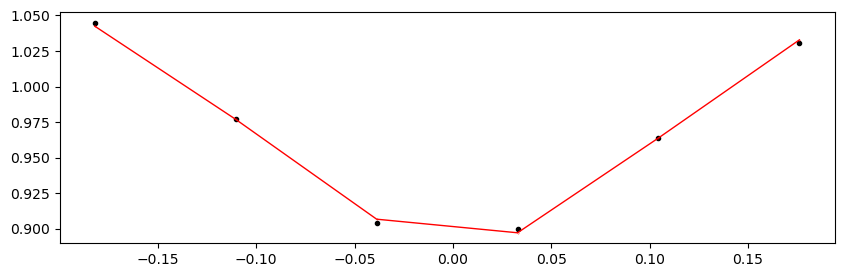

1393.7978461999999 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.52it/s]


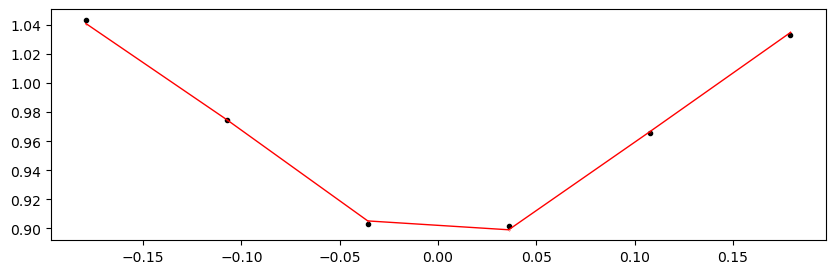

1394.0886249 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.55it/s]


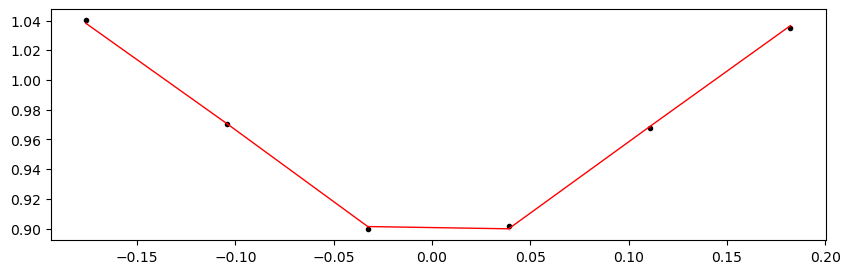

1394.3794036 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.89it/s]


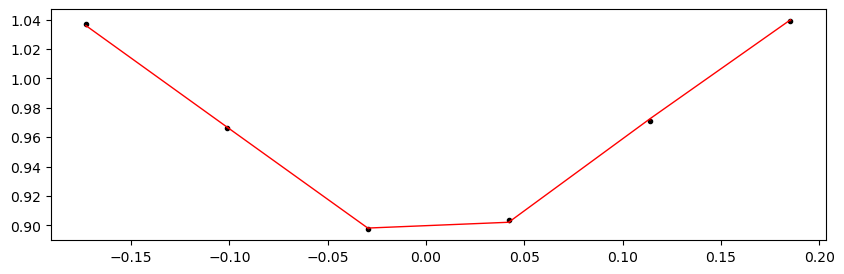

Time 1396.7056332 does not have enough data points: 4
Time 1396.9964118999999 does not have enough data points: 4
Time 1397.2871906 does not have enough data points: 5
Time 1397.5779693 does not have enough data points: 5
Time 1397.8687479999999 does not have enough data points: 5
Time 1398.1595267 does not have enough data points: 5
Time 1398.4503054 does not have enough data points: 5
Time 1398.7410840999999 does not have enough data points: 4
1399.0318628 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.42it/s]


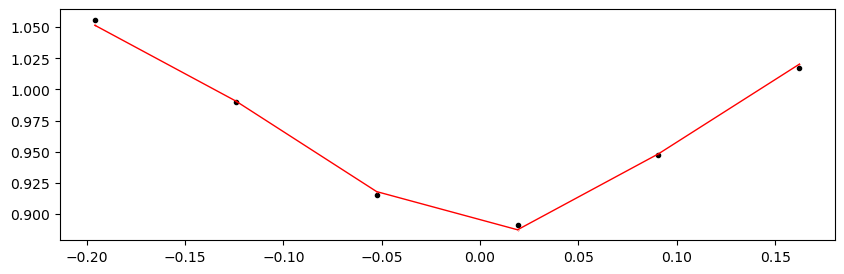

1399.3226415 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.61it/s]


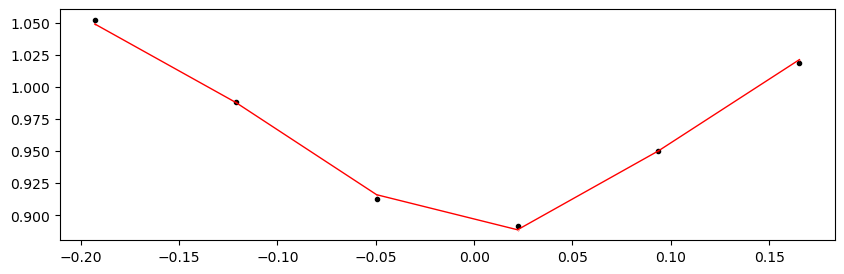

1399.6134201999998 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.83it/s]


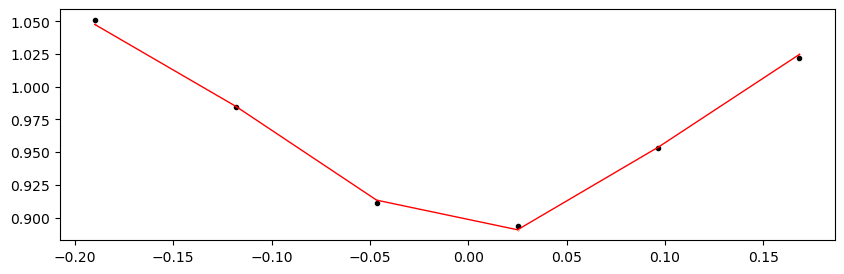

1399.9041989 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.72it/s]


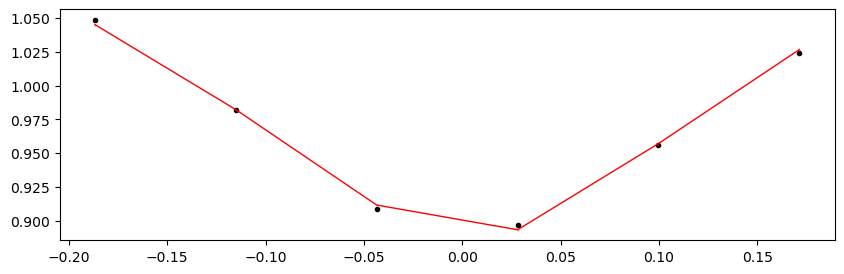

1400.1949776 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.26it/s]


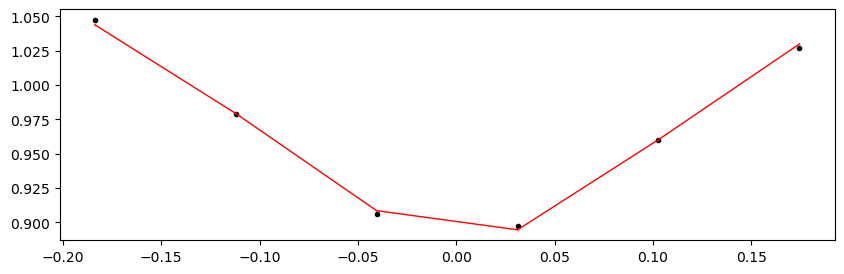

1400.4857562999998 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.42it/s]


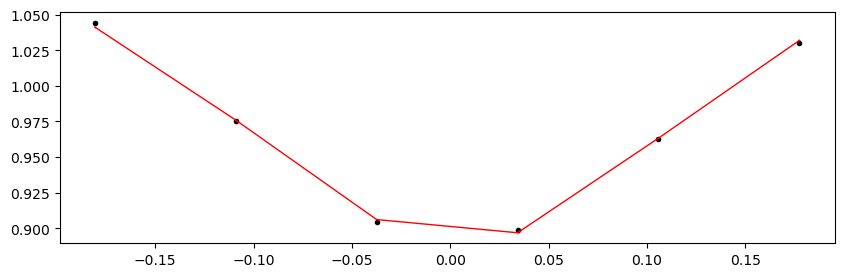

Time 1400.776535 does not have enough data points: 5
1401.0673136999999 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.26it/s]


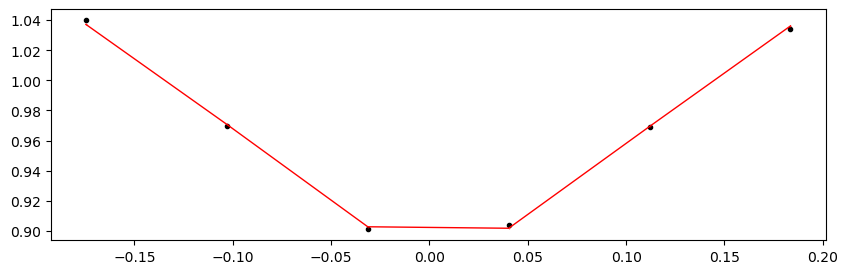

1401.3580924 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.95it/s]


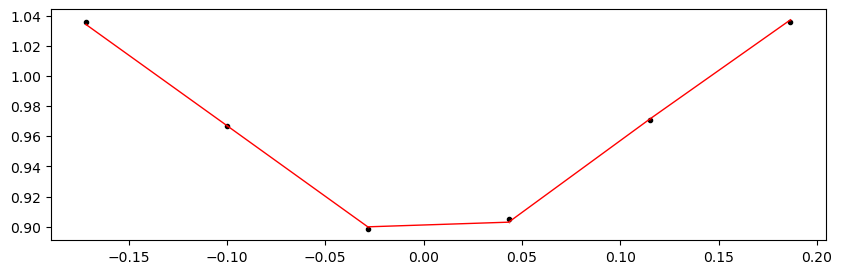

1401.6488711 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.39it/s]


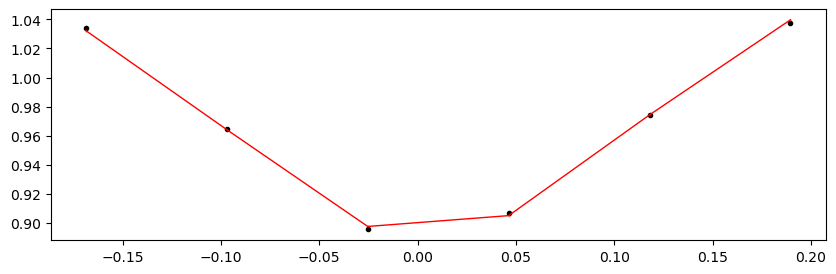

1401.9396497999999 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.20it/s]


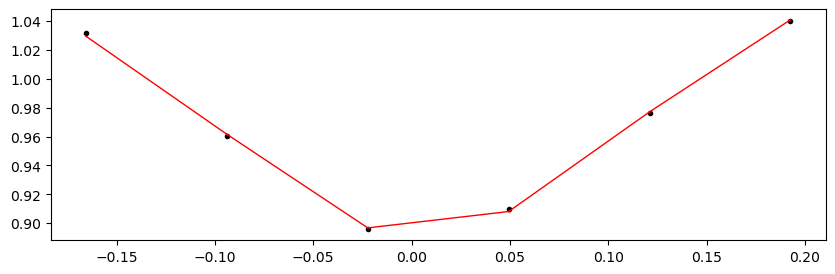

1402.2304285 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.52it/s]


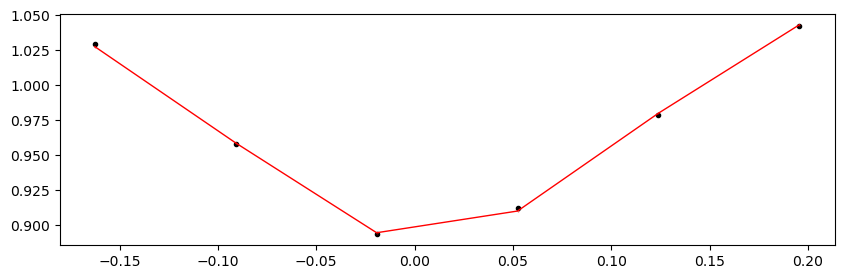

1402.5212072 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.31it/s]


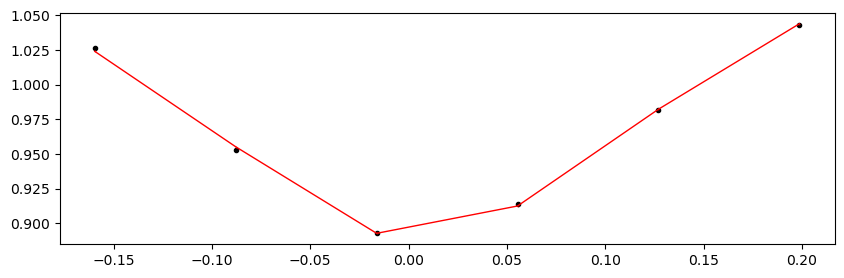

Time 1402.8119858999999 does not have enough data points: 5
Time 1403.1027646 does not have enough data points: 5
Time 1403.3935433 does not have enough data points: 5
Time 1403.6843219999998 does not have enough data points: 5
Time 1403.9751007 does not have enough data points: 5
Time 1404.2658794 does not have enough data points: 5
Time 1404.5566580999998 does not have enough data points: 5
Time 1404.8474368 does not have enough data points: 5
Time 1405.1382155 does not have enough data points: 5
Time 1405.4289942 does not have enough data points: 5
1405.7197729 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.43it/s]


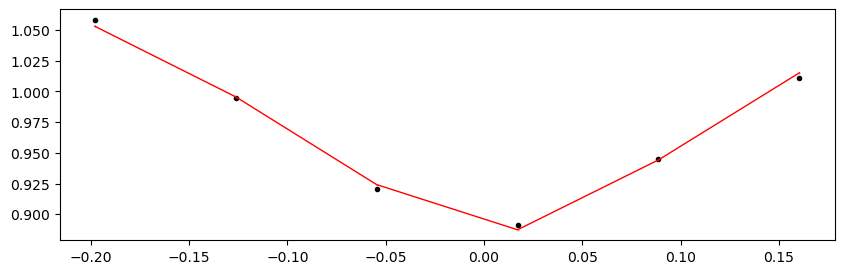

1406.0105515999999 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.03it/s]


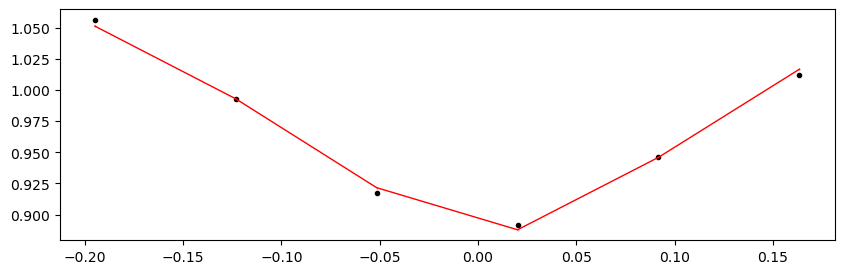

2116.092137 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.04it/s]


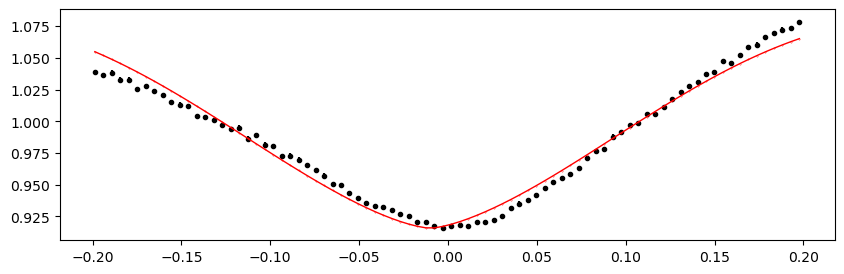

2116.3829157 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.14it/s]


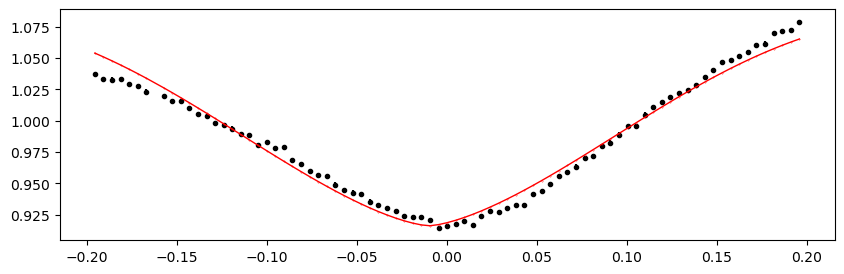

2116.6736944 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.71it/s]


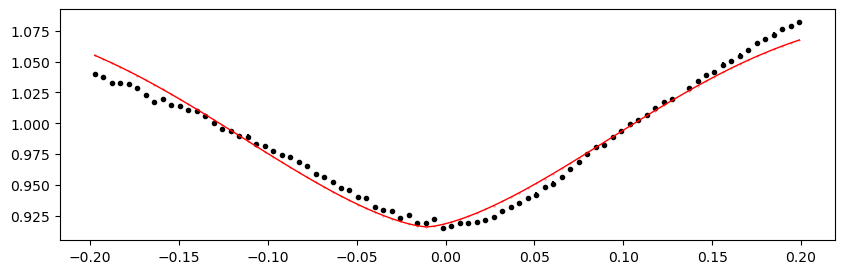

2116.9644731 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.21it/s]


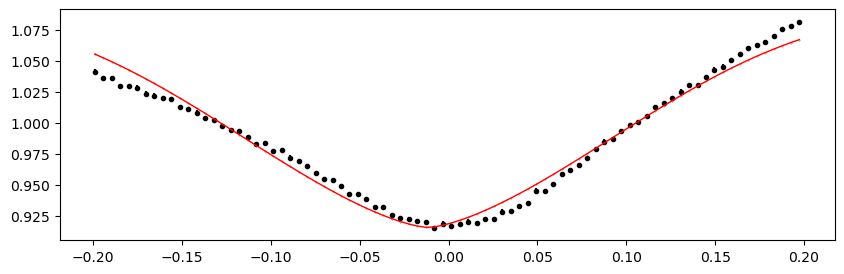

2117.2552517999998 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.21it/s]


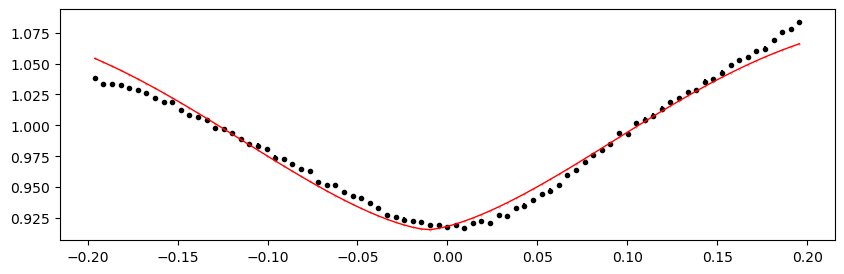

2117.5460304999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.04it/s]


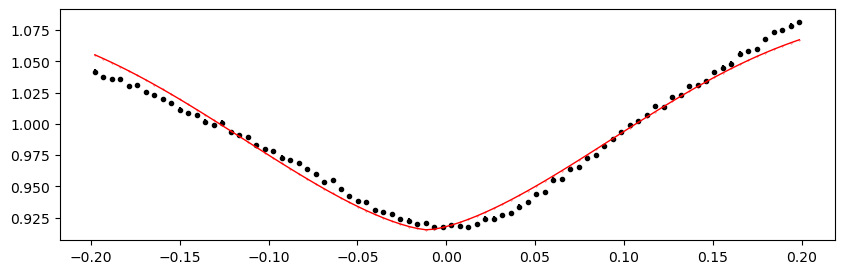

2117.8368092 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.03it/s]


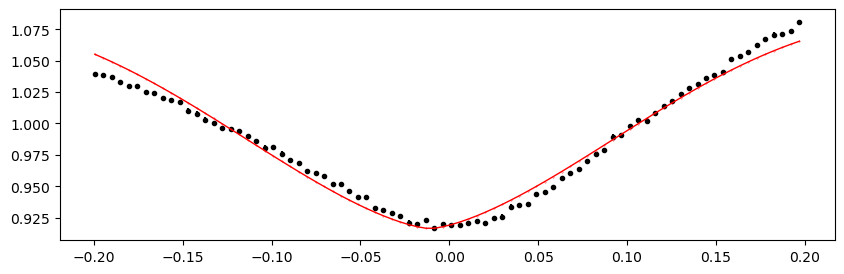

2118.1275879 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.58it/s]


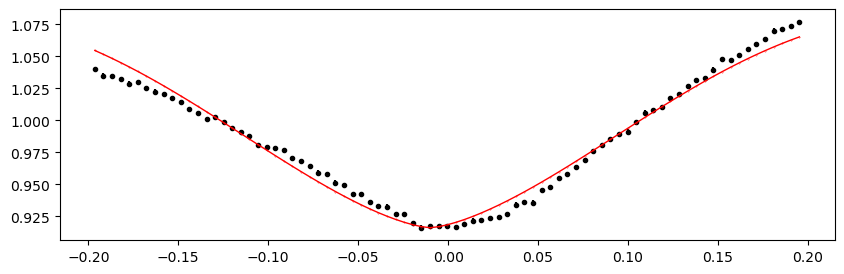

2118.4183666 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.48it/s]


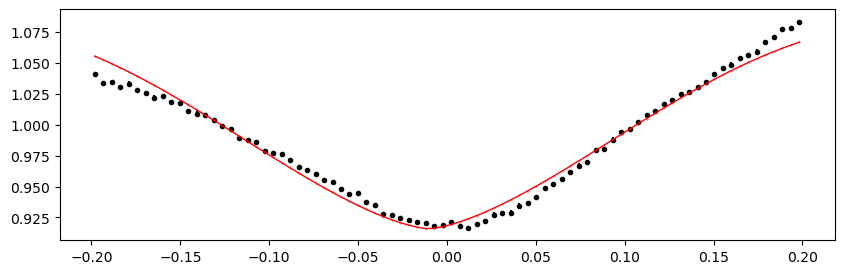

2118.7091453 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.68it/s]


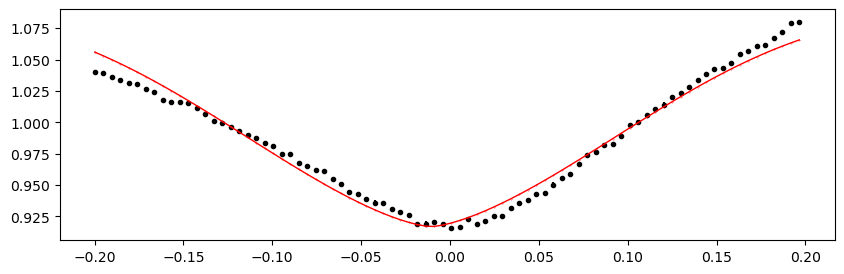

2118.9999239999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.33it/s]


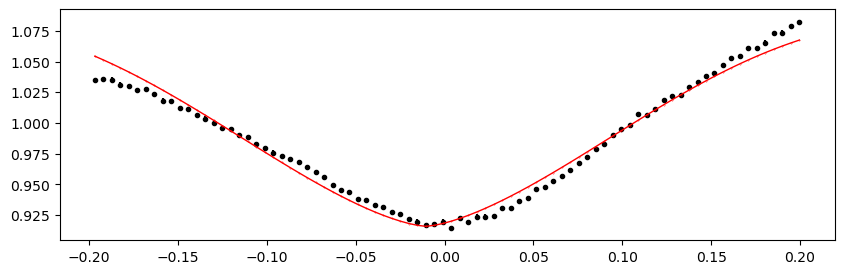

2119.2907027 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.90it/s]


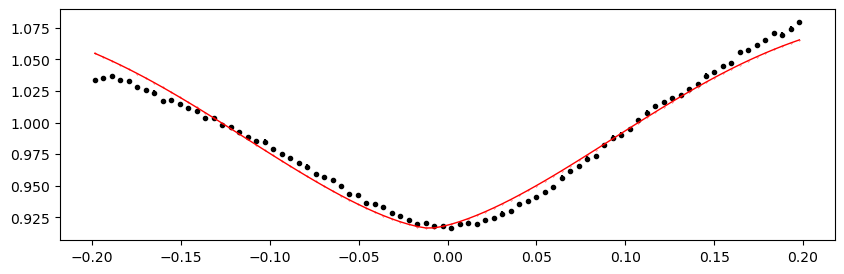

2119.5814814 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.36it/s]


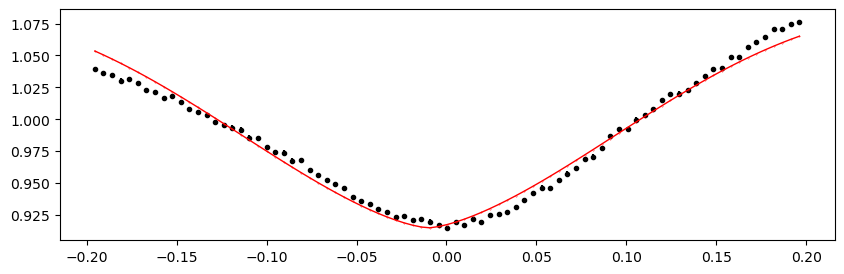

2119.8722601 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.44it/s]


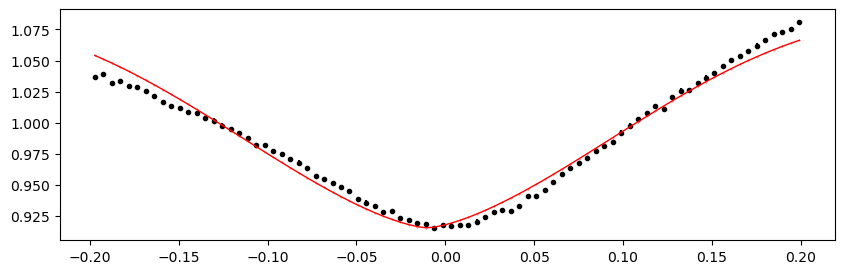

2120.1630388 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.94it/s]


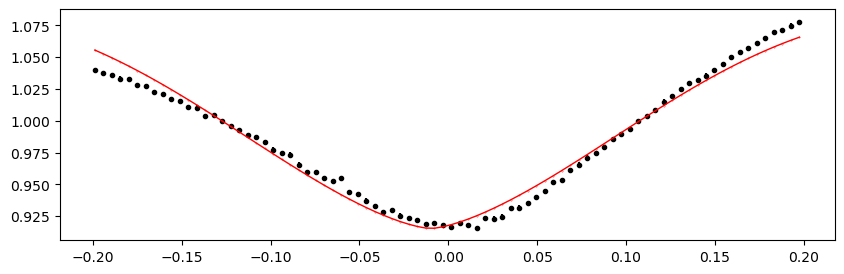

2120.4538175 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.74it/s]


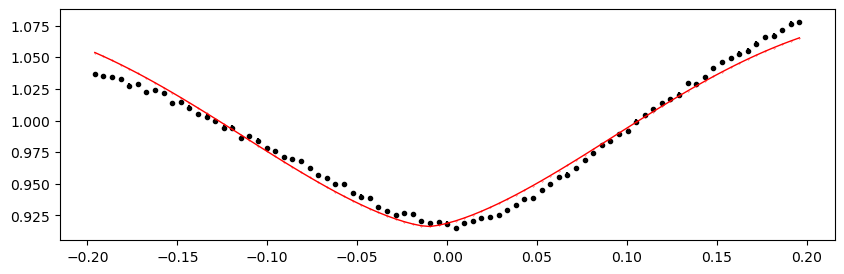

2120.7445962 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.58it/s]


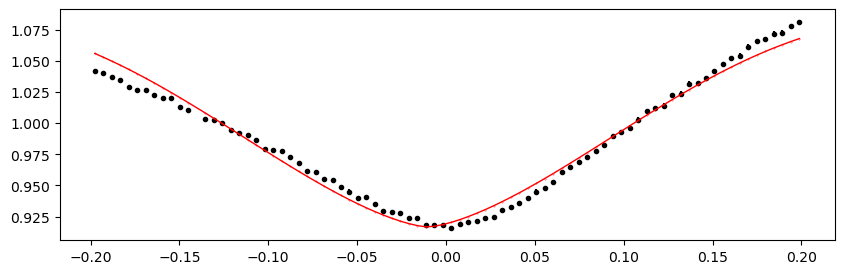

2121.0353749 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.32it/s]


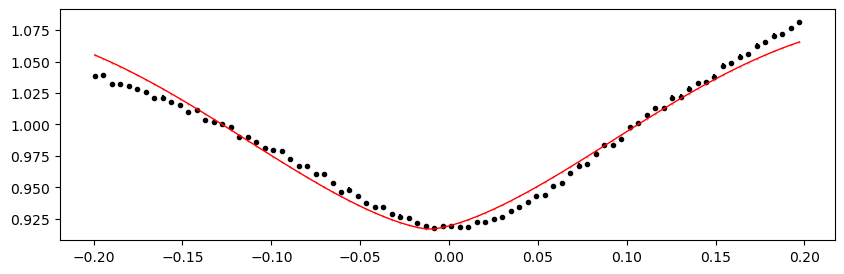

2121.3261536 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.88it/s]


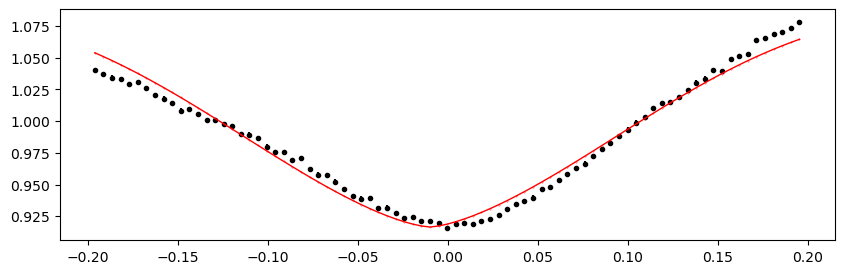

2121.6169323 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.11it/s]


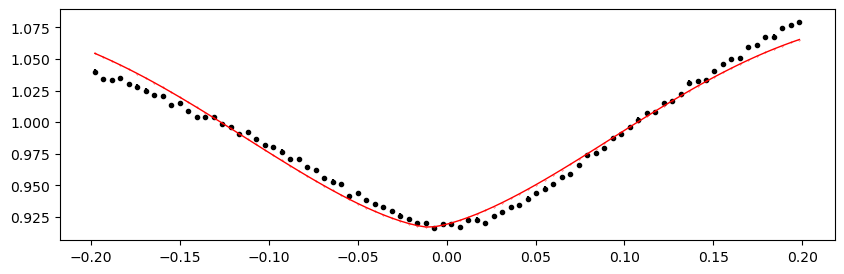

2121.907711 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.24it/s]


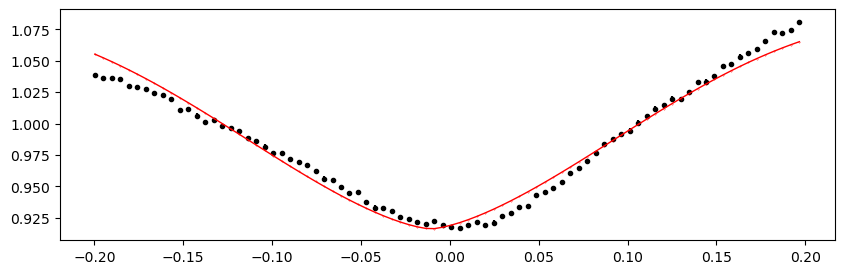

2122.1984897 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.68it/s]


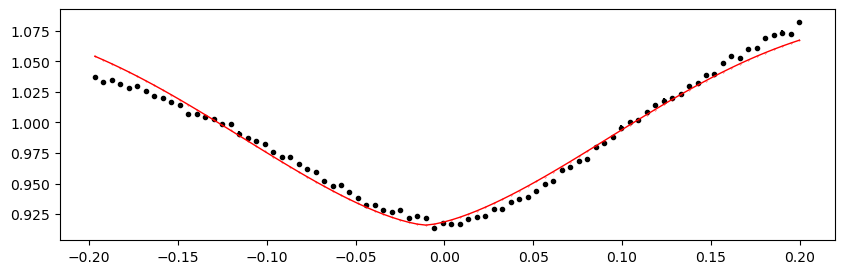

2122.4892683999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.67it/s]


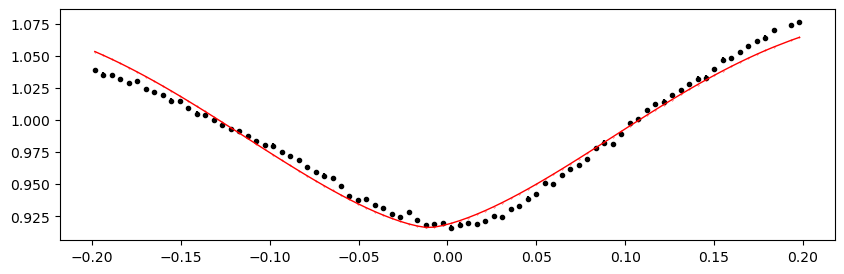

2122.7800471 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.17it/s]


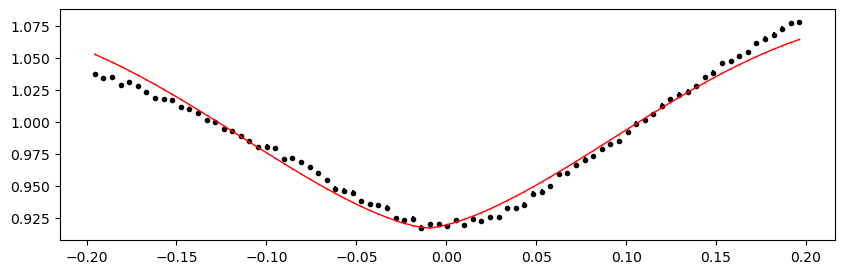

2123.0708258 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.11it/s]


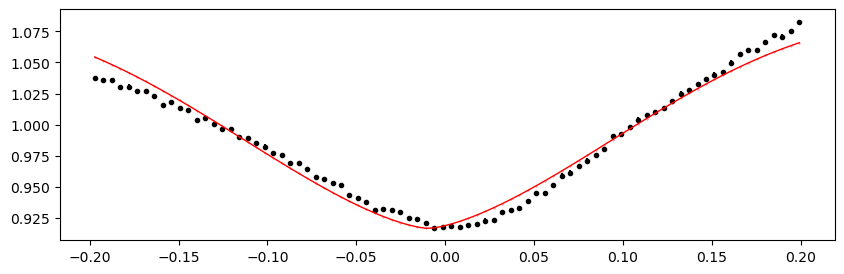

2123.3616045 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.68it/s]


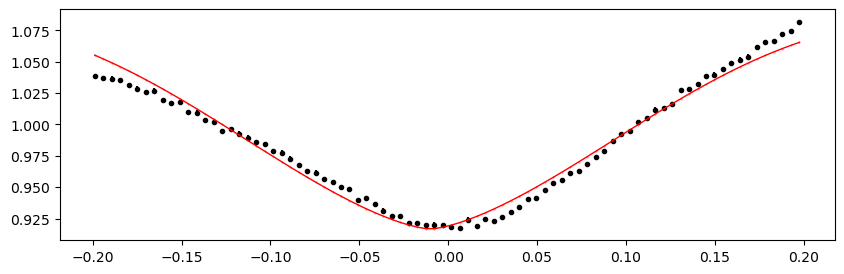

2123.6523832 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.14it/s]


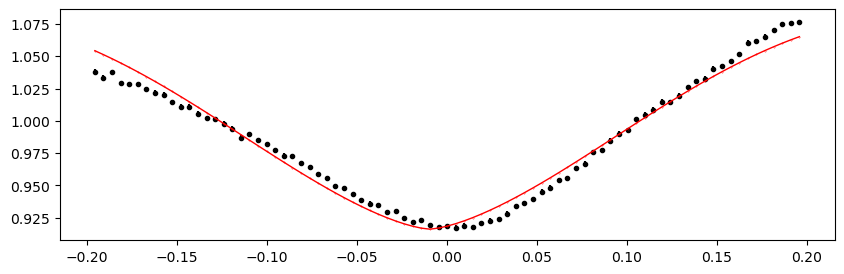

2123.9431618999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.19it/s]


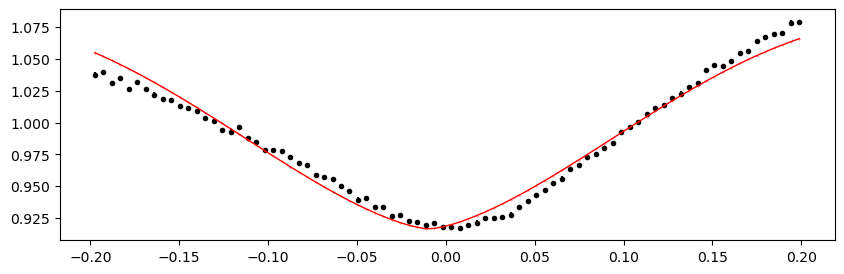

2124.2339406 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.42it/s]


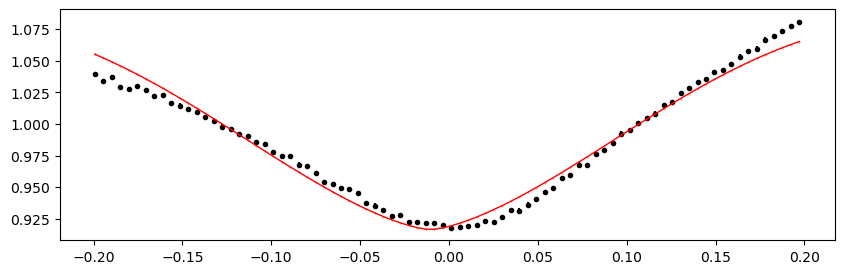

2124.5247193 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.28it/s]


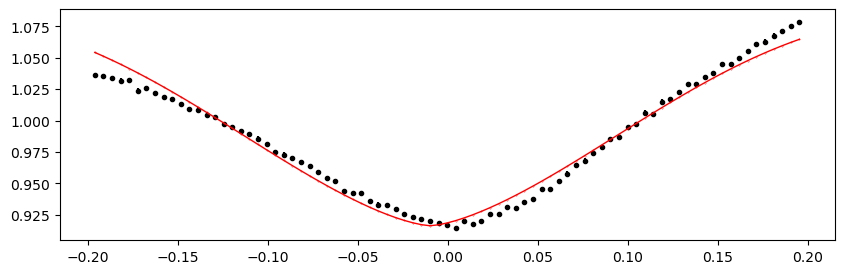

2124.815498 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.18it/s]


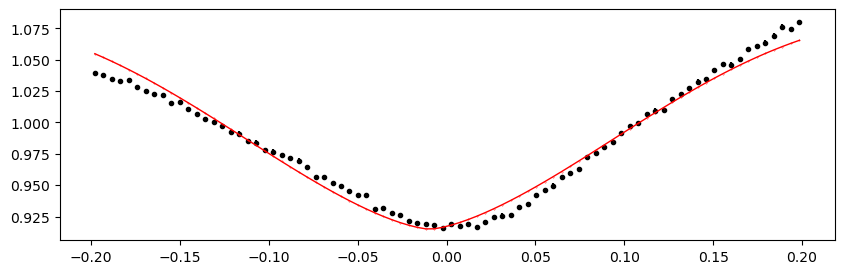

2125.1062767 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.64it/s]


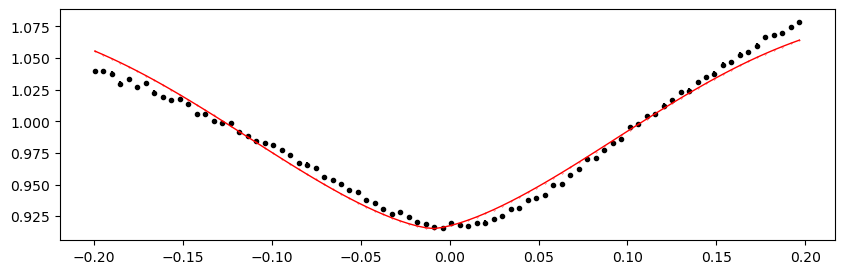

2125.3970553999998 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.66it/s]


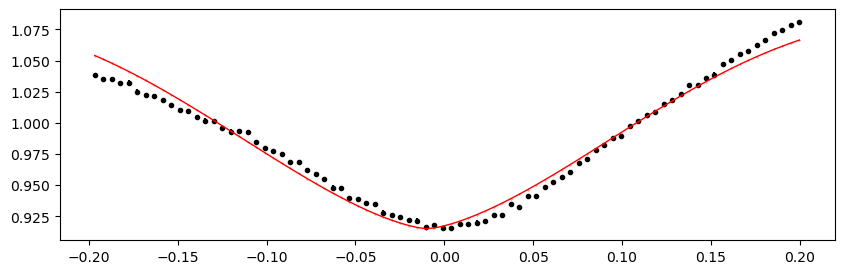

2125.6878341 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.29it/s]


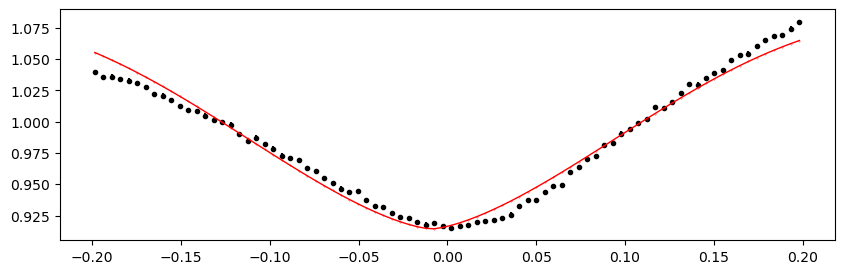

2125.9786128 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.58it/s]


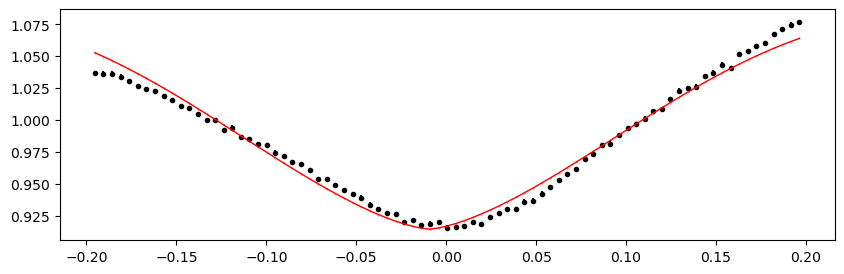

2130.3402932999998 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.90it/s]


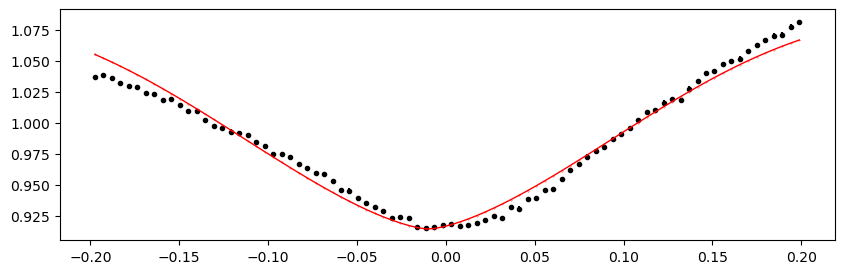

2130.631072 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.27it/s]


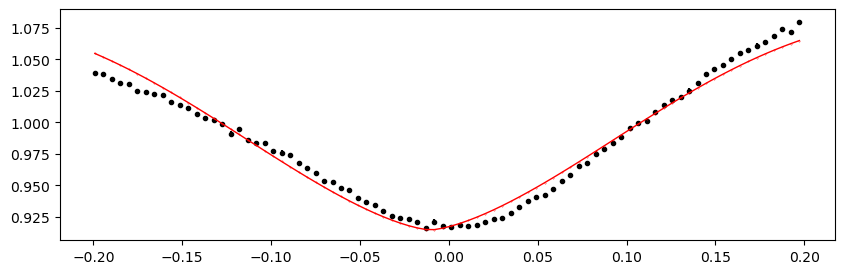

2130.9218507 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.91it/s]


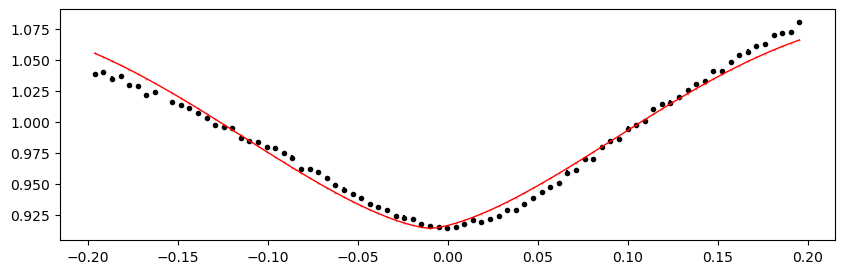

2131.2126294 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.53it/s]


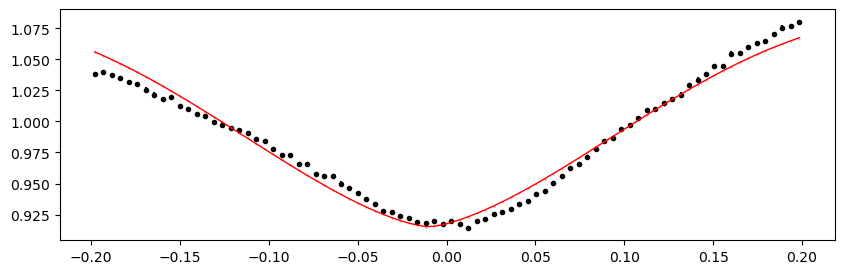

2131.5034081 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.41it/s]


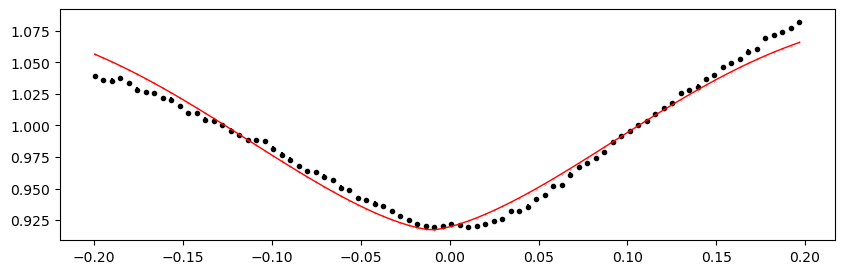

2131.7941868 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.23it/s]


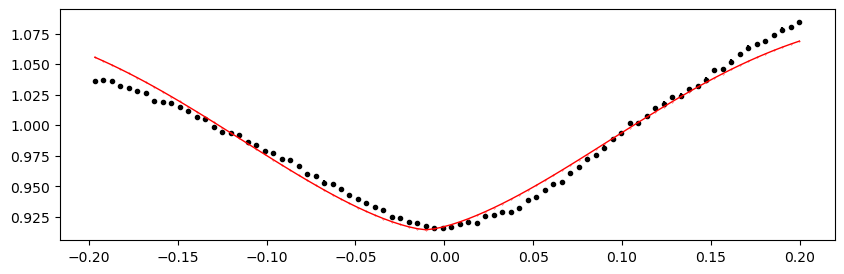

2132.0849655 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.60it/s]


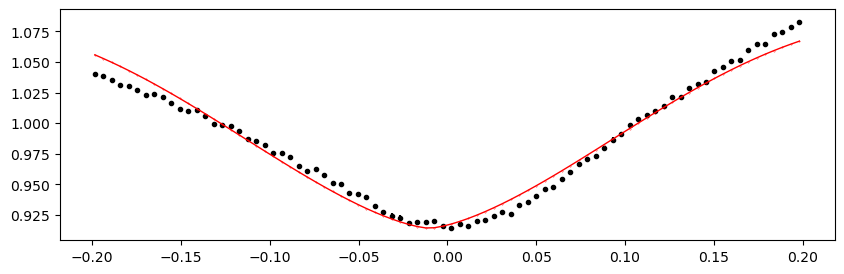

2132.3757442 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.22it/s]


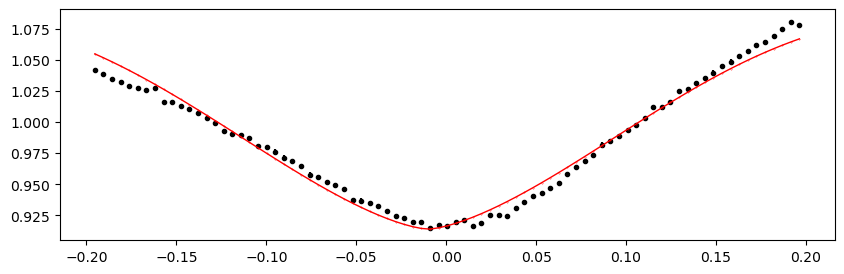

2132.6665229 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.00it/s]


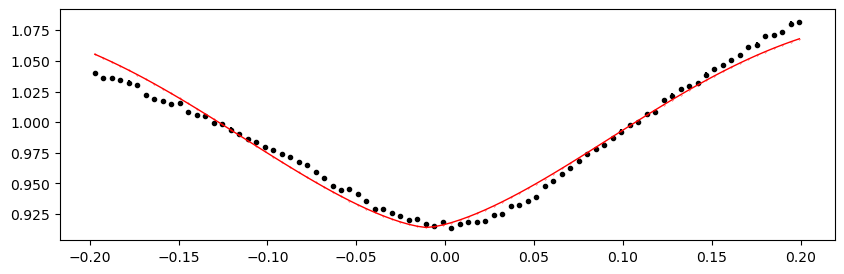

2132.9573016 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.86it/s]


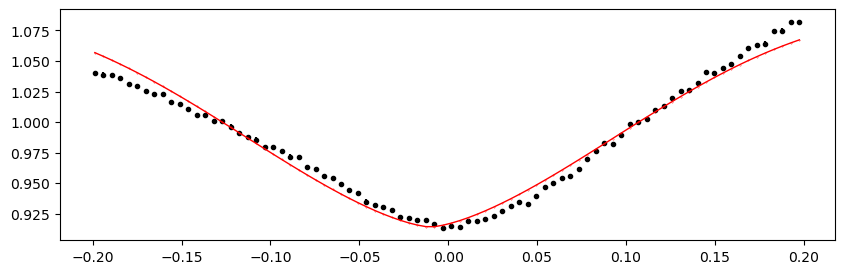

2133.2480803 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.95it/s]


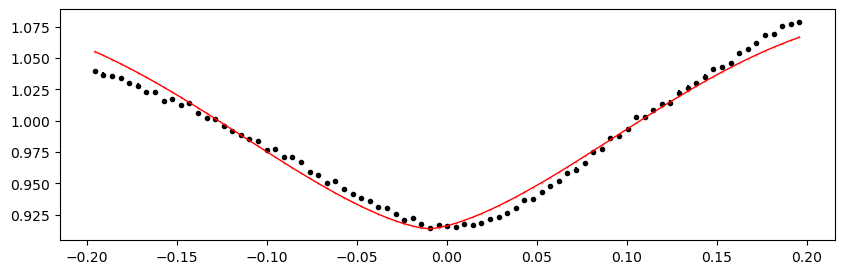

2133.538859 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.61it/s]


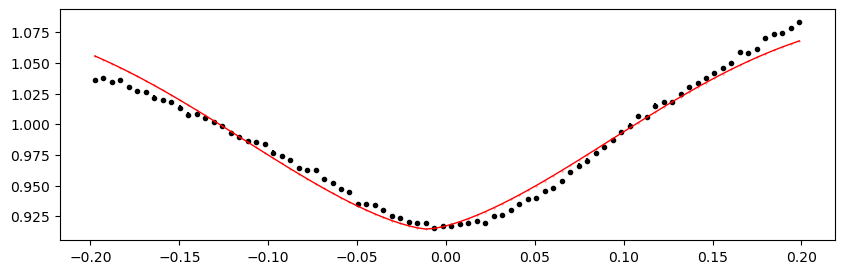

2133.8296376999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.07it/s]


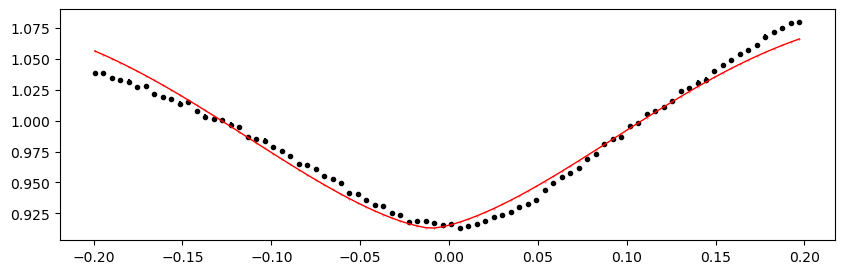

2134.1204164 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.64it/s]


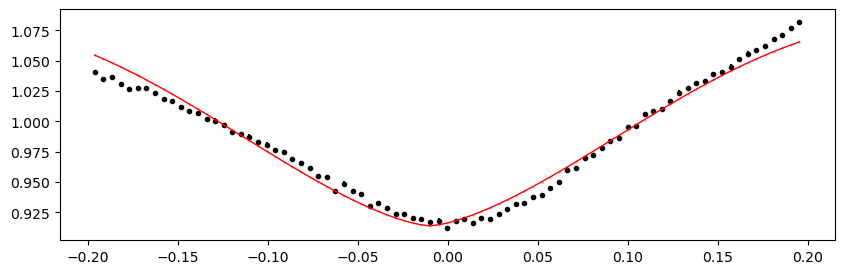

2134.4111951 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.37it/s]


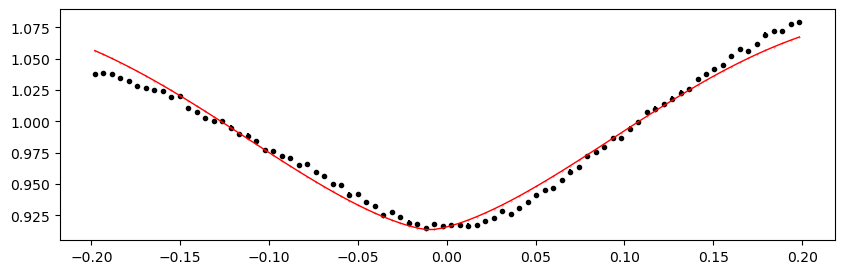

2134.7019738 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.76it/s]


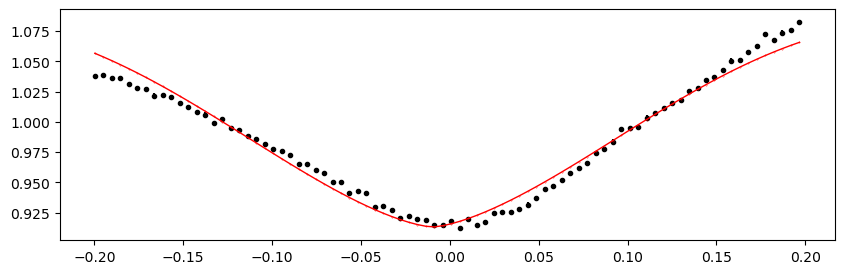

2134.9927525 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.80it/s]


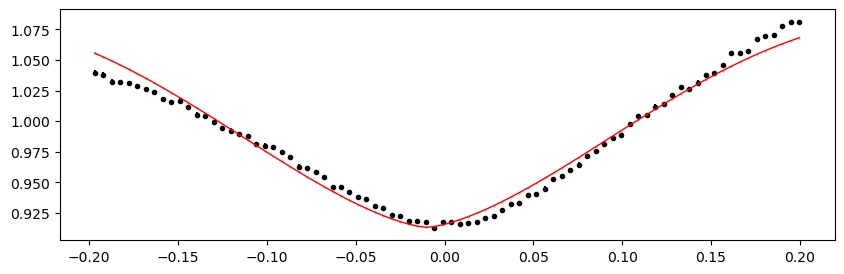

2135.2835311999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.82it/s]


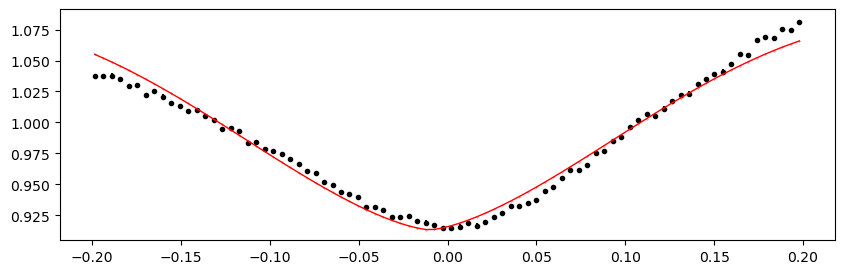

2135.5743099 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.43it/s]


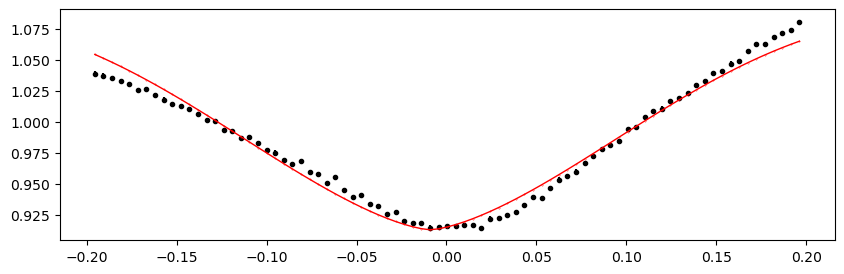

2135.8650886 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.42it/s]


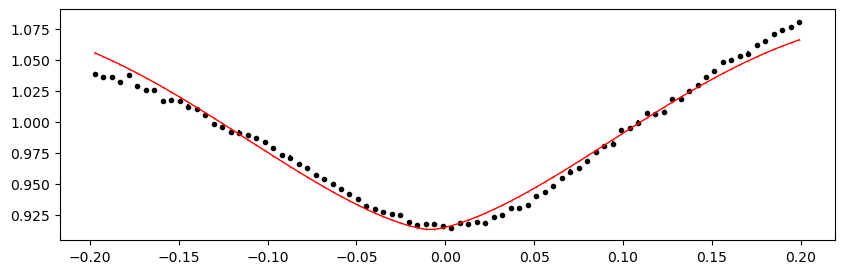

2136.1558673 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.43it/s]


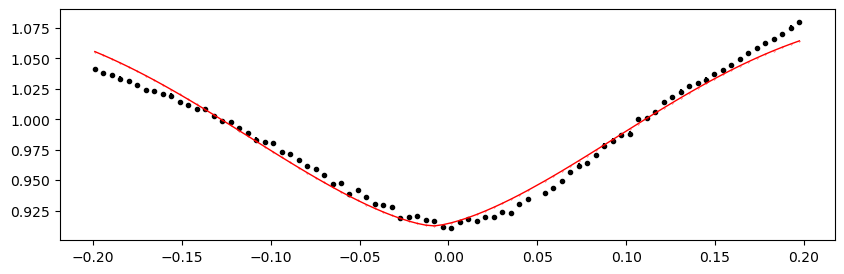

2136.446646 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.29it/s]


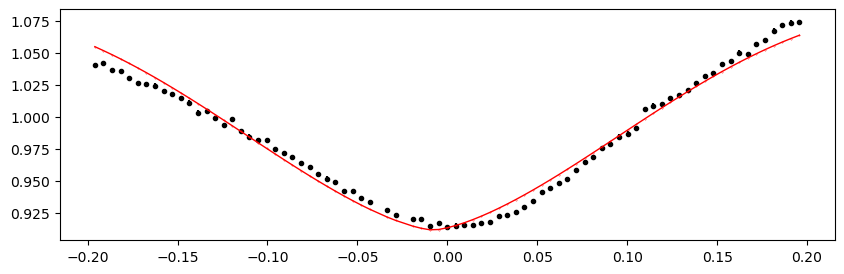

2136.7374247 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.95it/s]


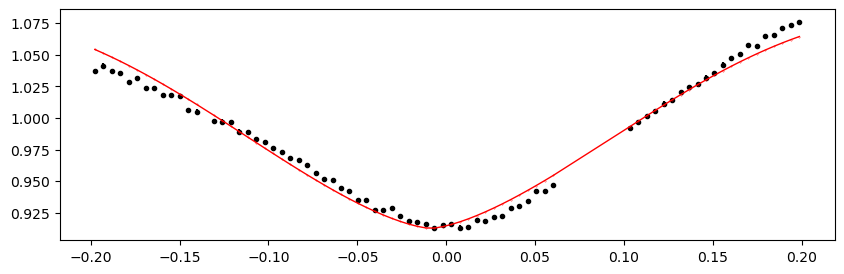

2137.0282034 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.51it/s]


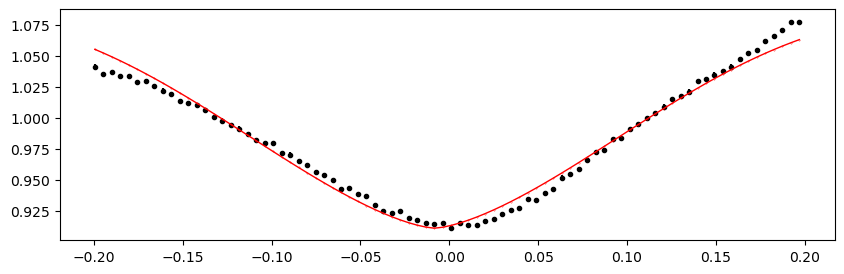

2137.3189821 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.05it/s]


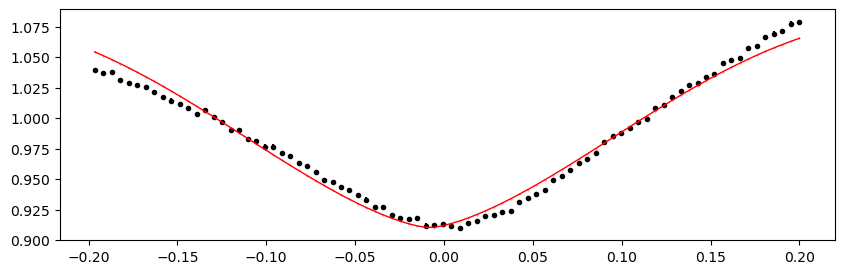

2137.6097608 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.44it/s]


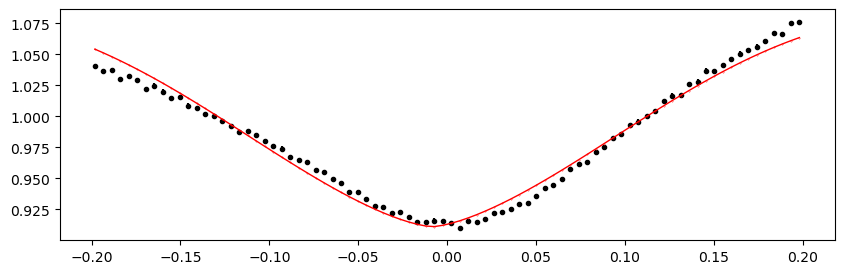

2137.9005395 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.64it/s]


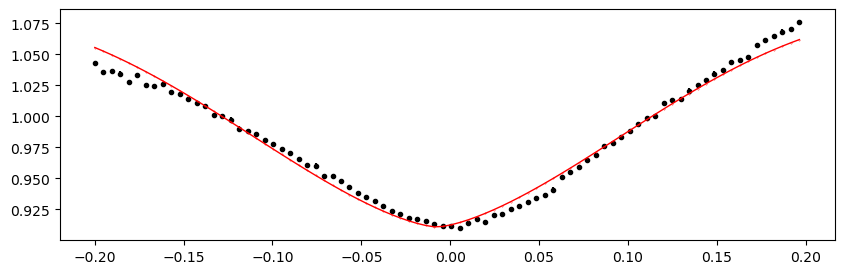

2138.1913182 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.14it/s]


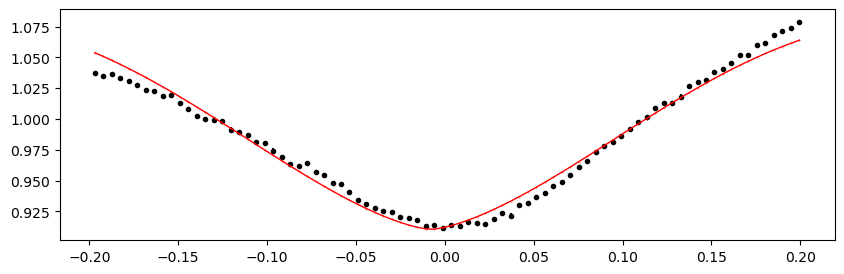

2138.4820969 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.00it/s]


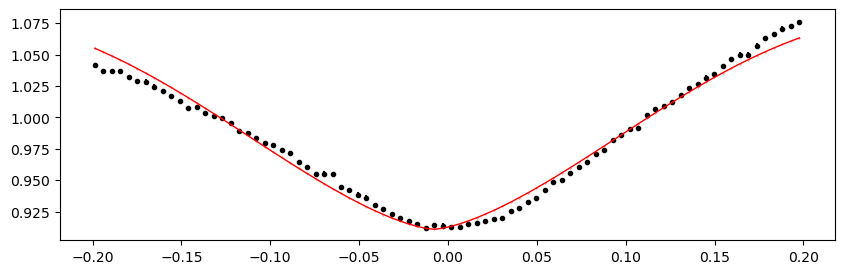

2138.7728755999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.19it/s]


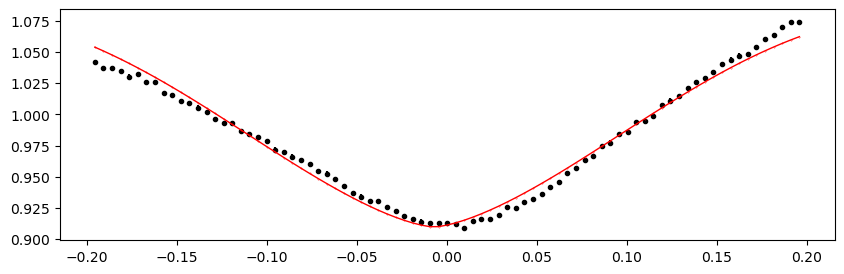

2139.0636543 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.18it/s]


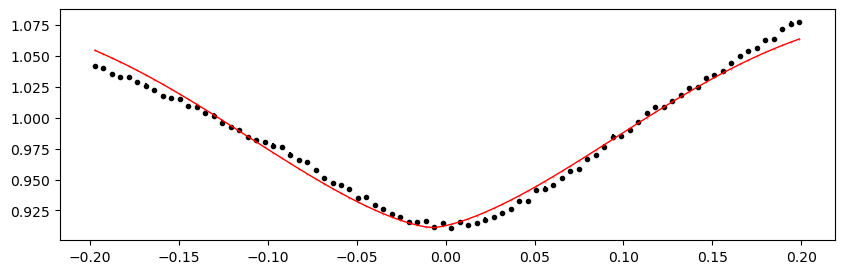

2139.354433 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.33it/s]


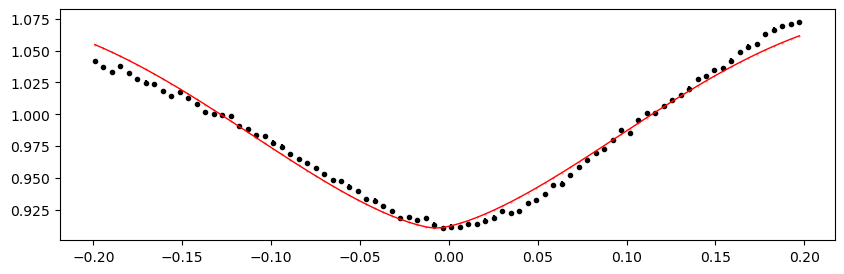

2139.6452117 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.73it/s]


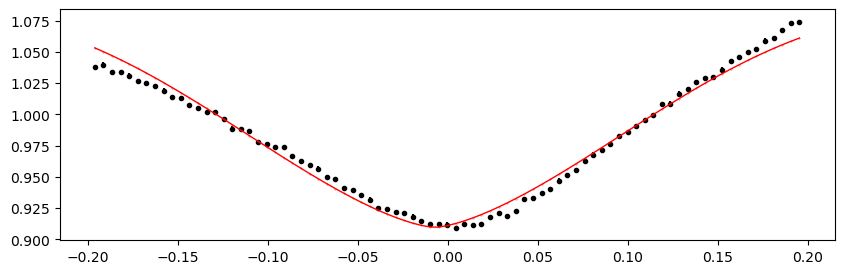

2139.9359904 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.27it/s]


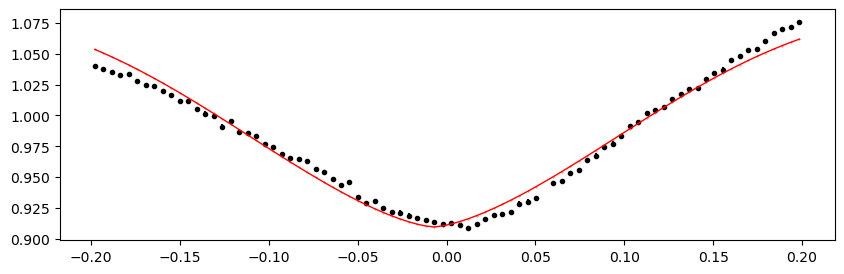

2140.2267690999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.08it/s]


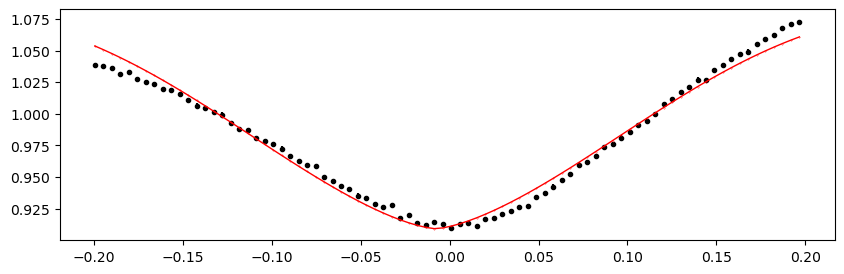

2140.5175478 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.86it/s]


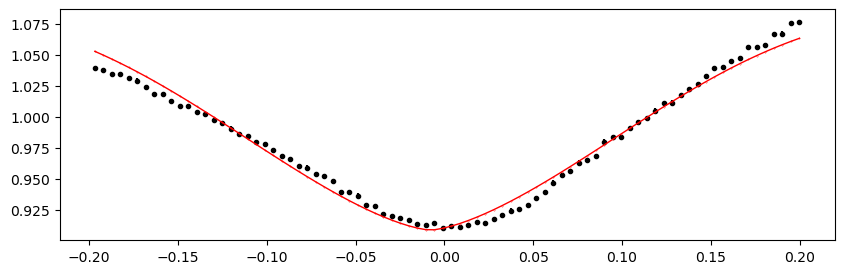

2140.8083265 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.69it/s]


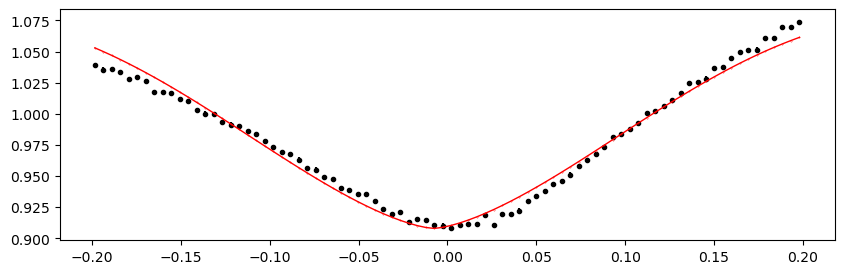

2141.0991052 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.84it/s]


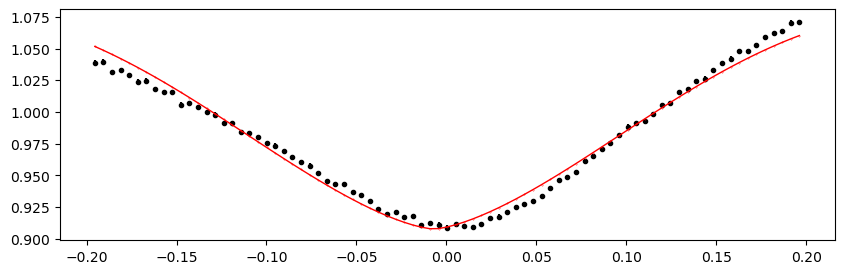

2141.3898839 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.00it/s]


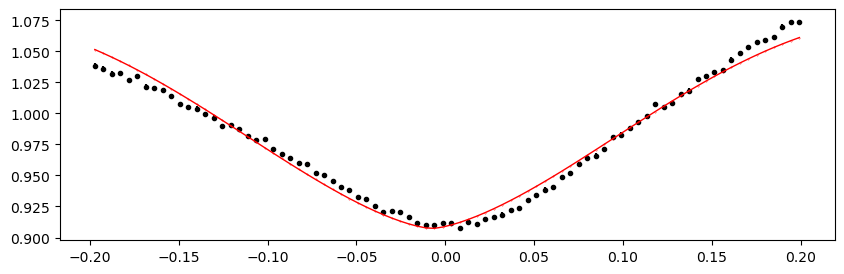

2141.6806626 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.20it/s]


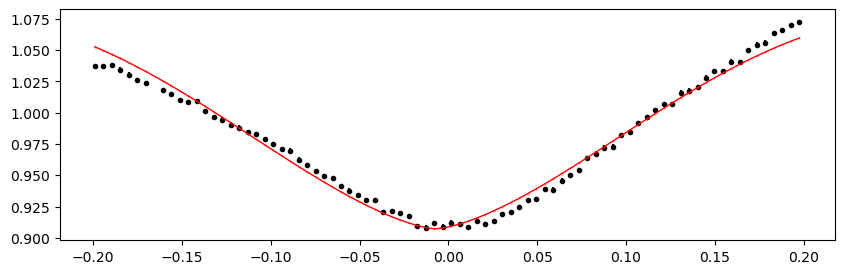

2447.8706337 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.70it/s]


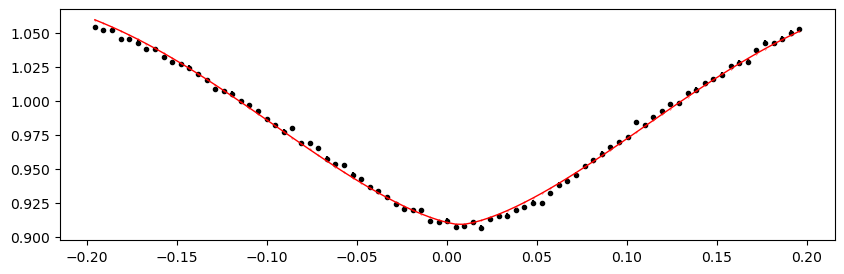

2448.1614124 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.12it/s]


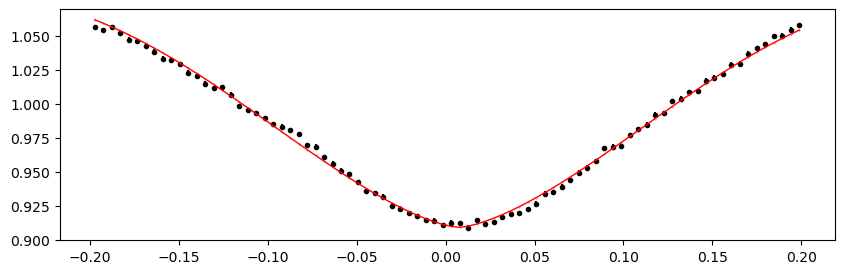

2448.4521911 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.86it/s]


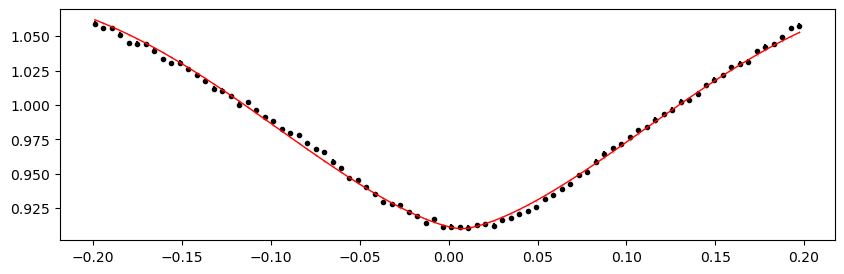

2448.7429697999996 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.45it/s]


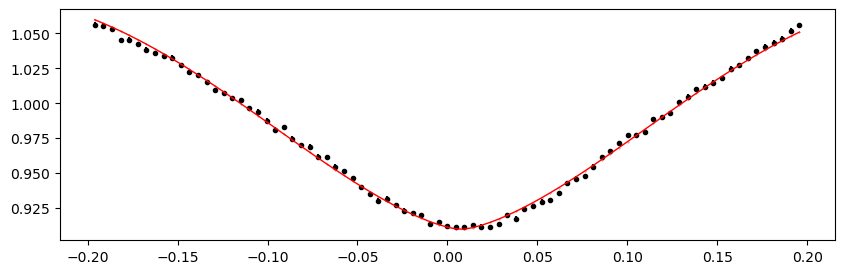

2449.0337485 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.52it/s]


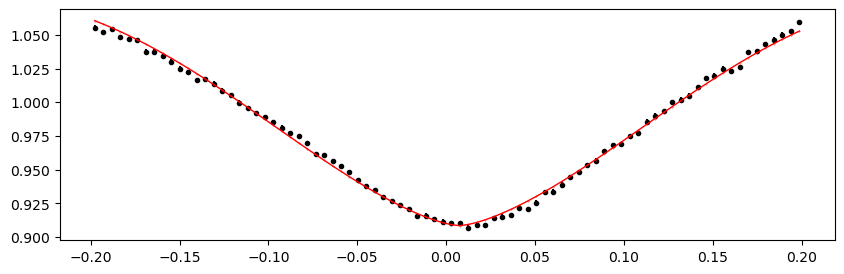

2449.3245272 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.09it/s]


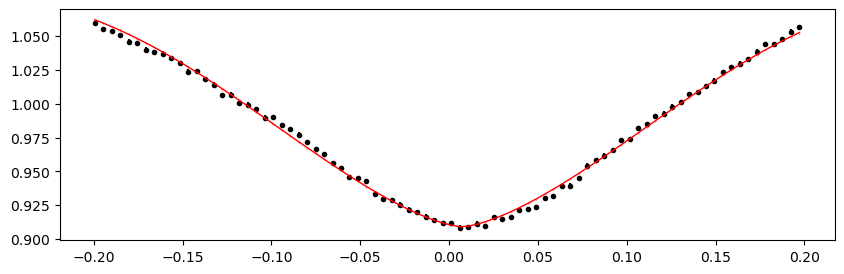

2449.6153059 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.62it/s]


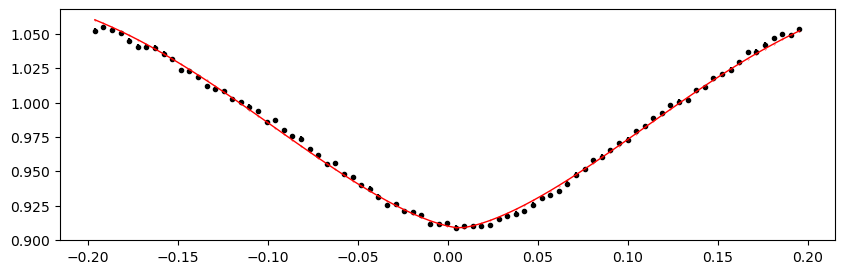

2449.9060846 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.44it/s]


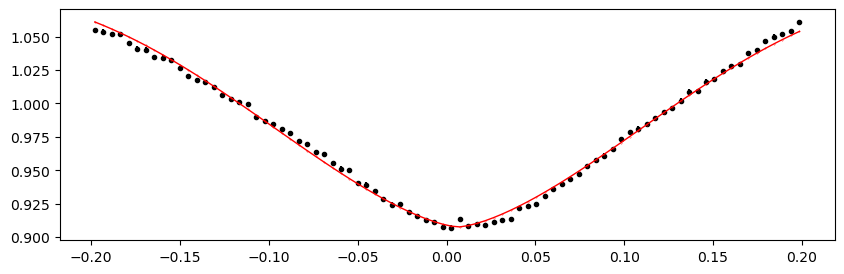

2450.1968632999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.74it/s]


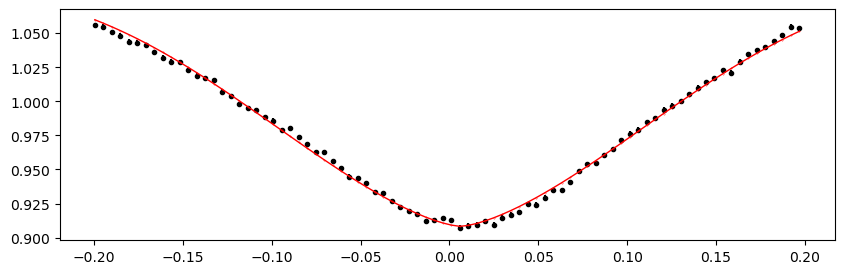

2450.487642 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.08it/s]


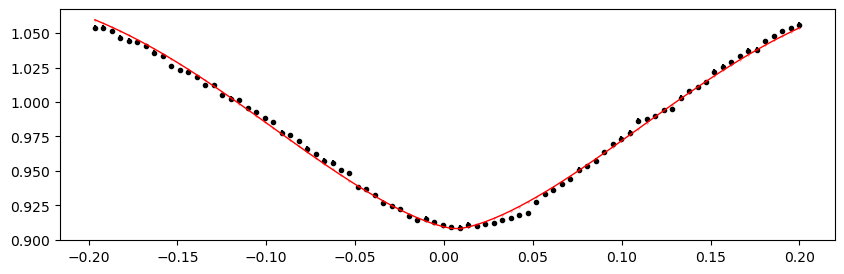

2450.7784207 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.34it/s]


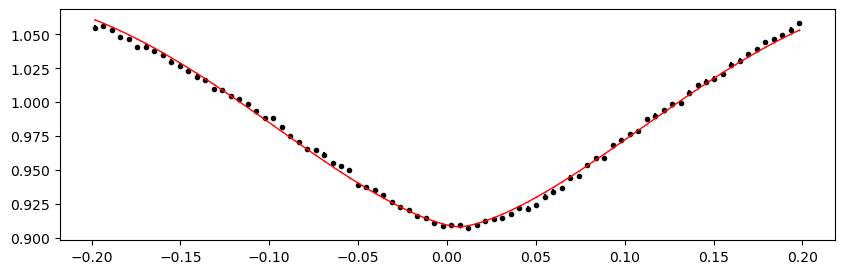

2451.0691994 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.01it/s]


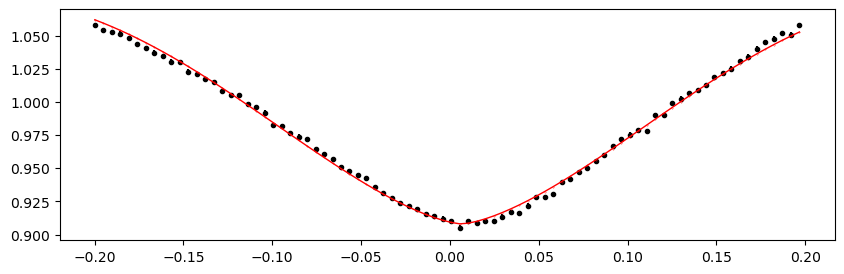

2451.3599781000003 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.64it/s]


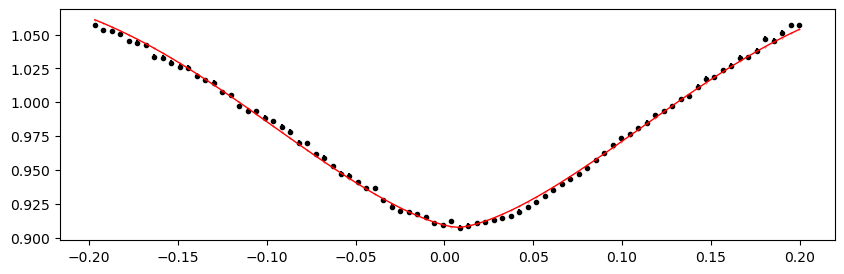

2451.6507567999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.96it/s]


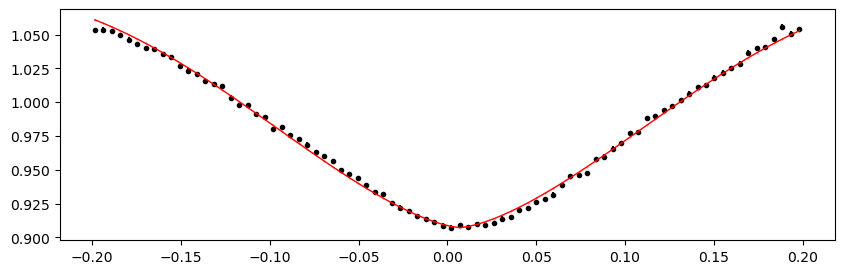

2451.9415355 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.67it/s]


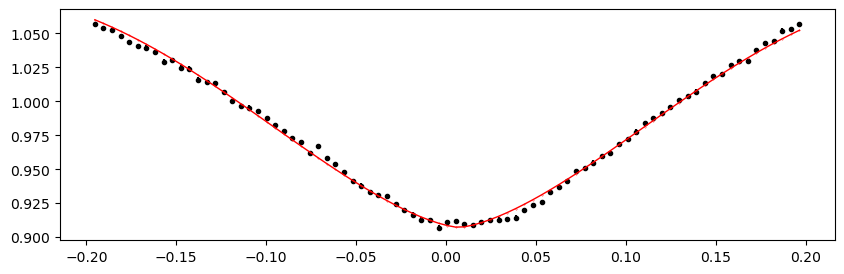

2452.2323142 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.12it/s]


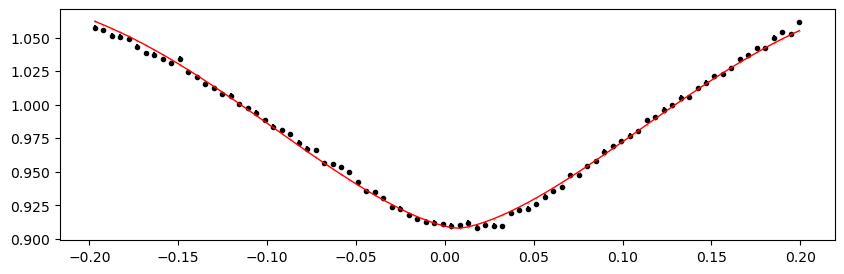

2452.5230929 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.00it/s]


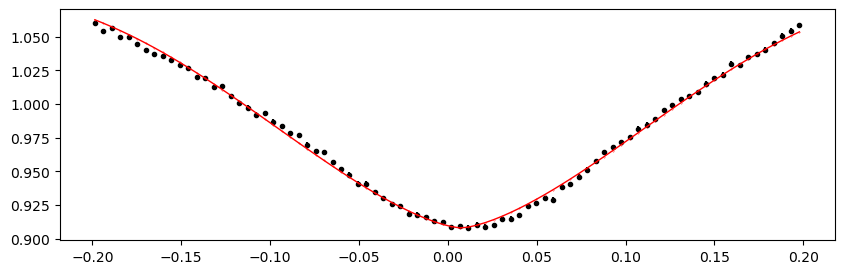

2452.8138716 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.05it/s]


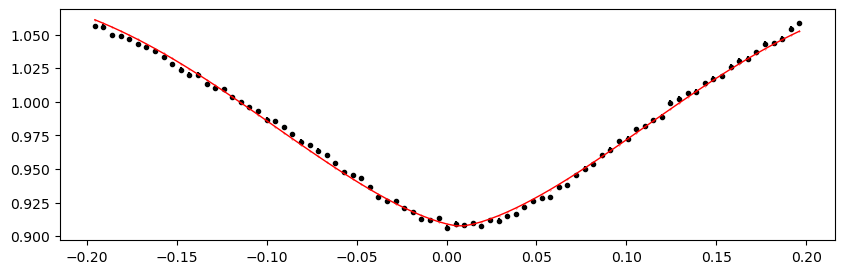

2453.1046503 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.40it/s]


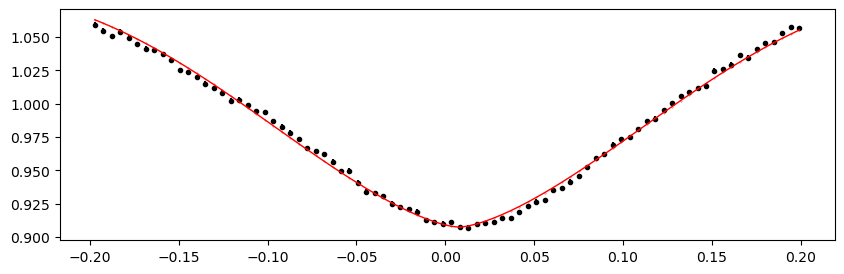

2453.395429 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.23it/s]


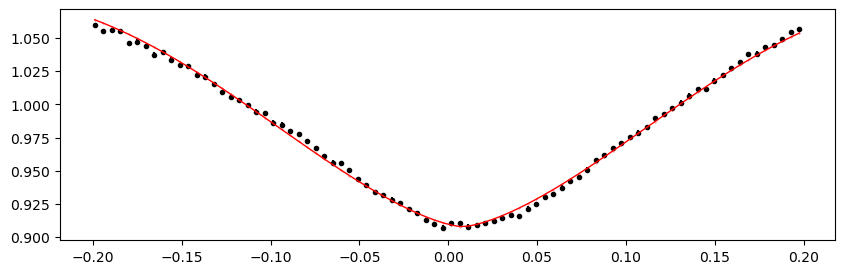

2461.2464539000002 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.02it/s]


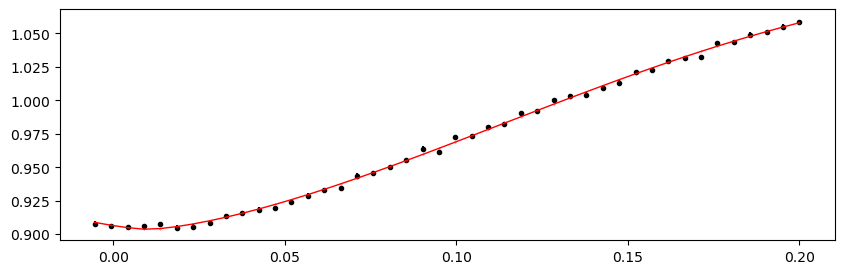

2461.5372325999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.17it/s]


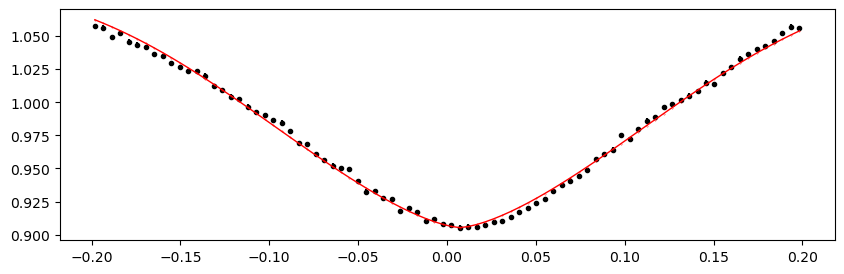

2461.8280113 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.16it/s]


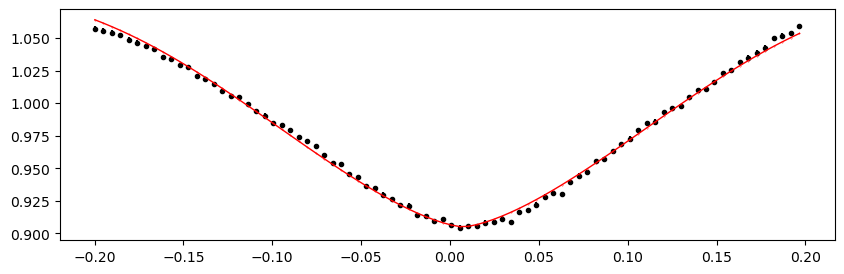

2462.11879 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.51it/s]


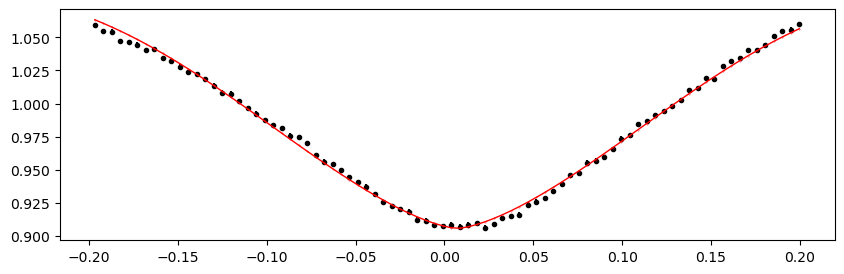

2462.4095687 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.16it/s]


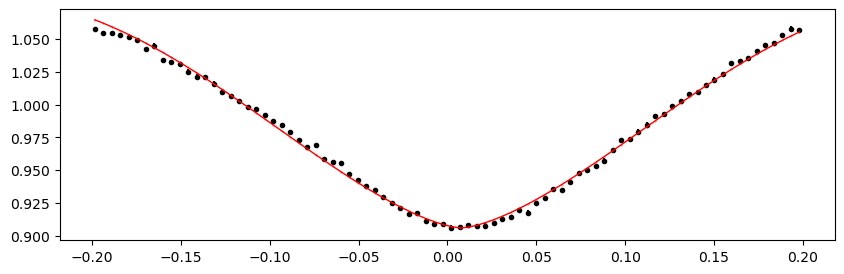

2462.7003474 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.67it/s]


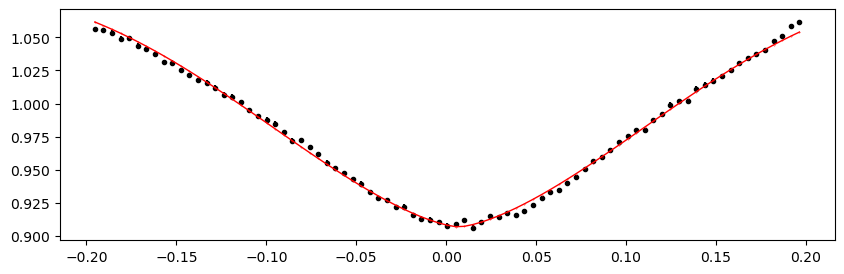

2462.9911260999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.59it/s]


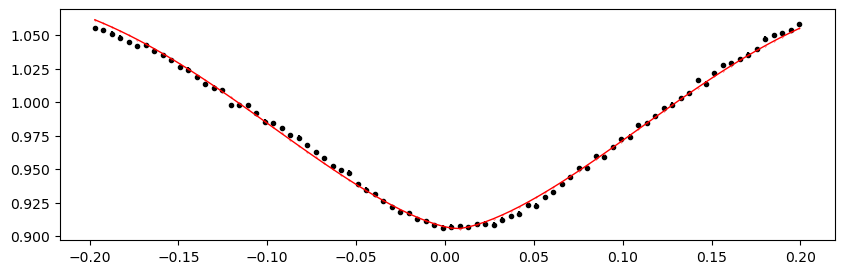

2463.2819048 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.44it/s]


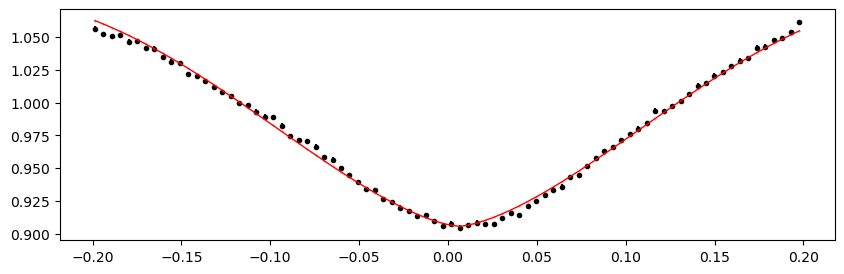

2463.5726835 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.91it/s]


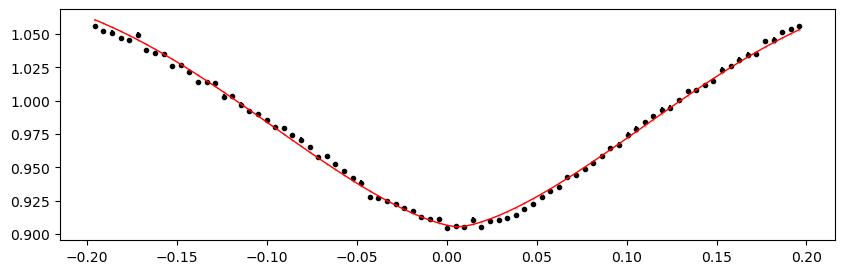

2463.8634622 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.88it/s]


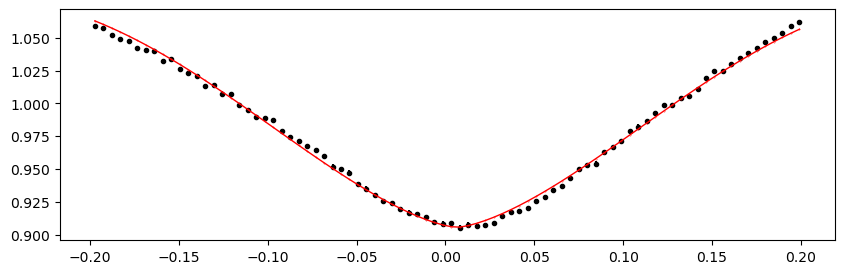

2464.1542409 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.92it/s]


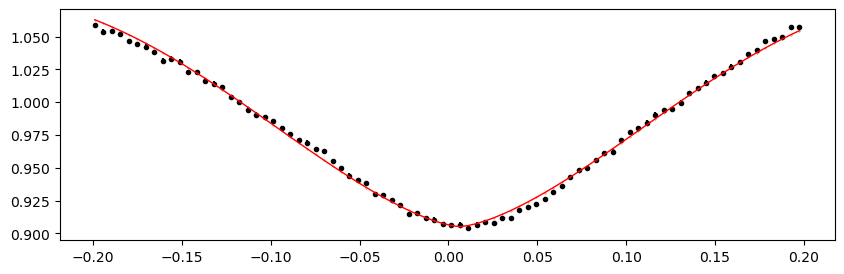

2464.4450196 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.70it/s]


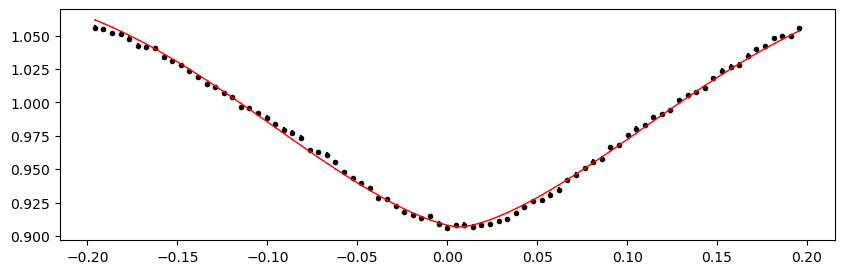

2464.7357983 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.66it/s]


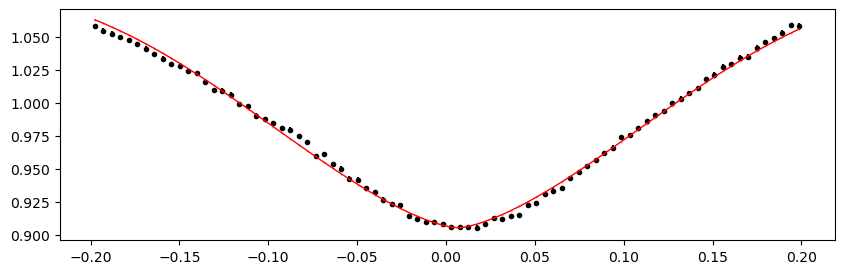

2465.0265769999996 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.73it/s]


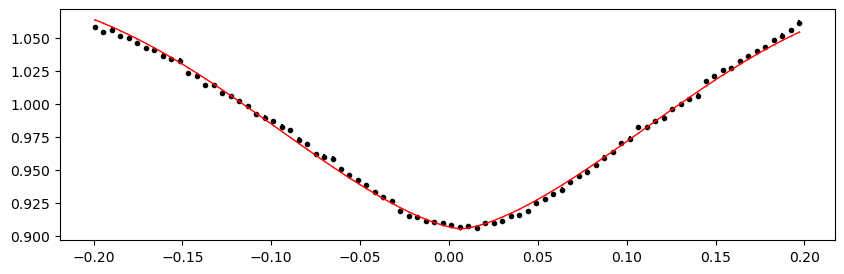

2465.3173557 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.18it/s]


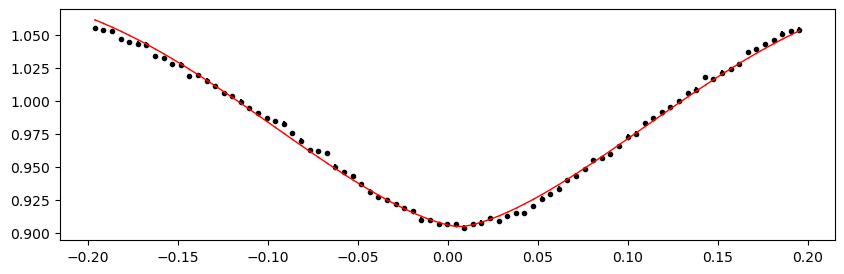

2465.6081344 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.45it/s]


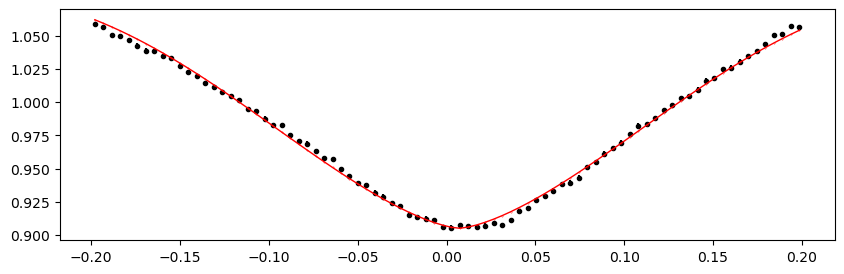

2465.8989131 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.87it/s]


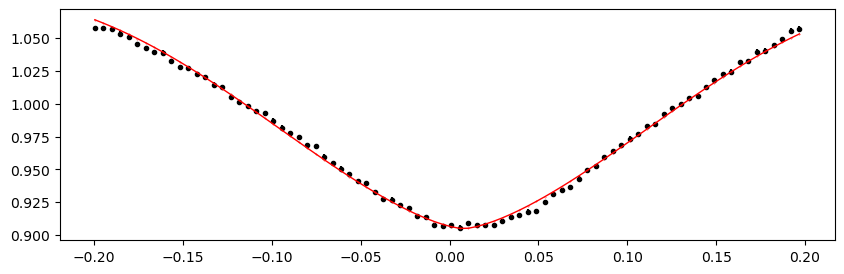

2466.1896918 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.93it/s]


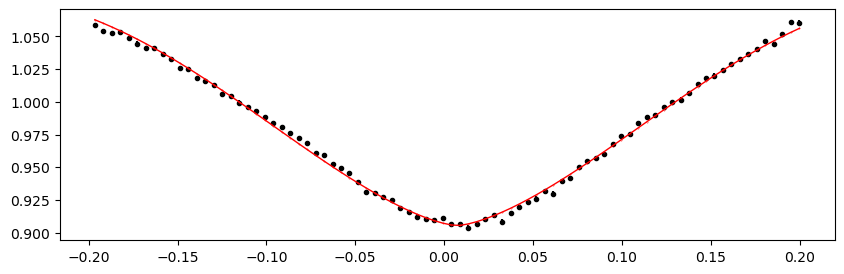

2466.4804704999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.48it/s]


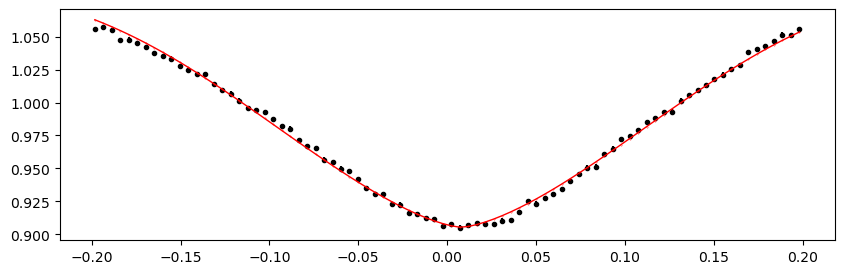

2466.7712492 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.43it/s]


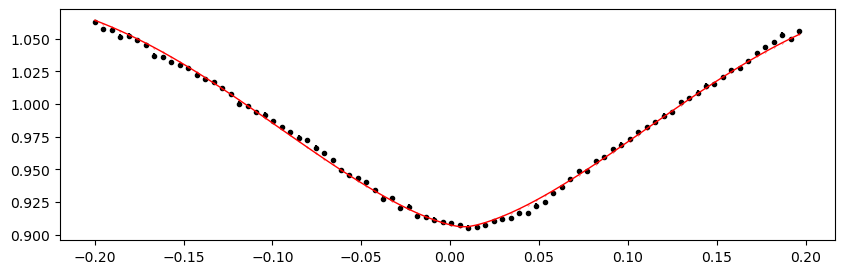

2467.0620279 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.41it/s]


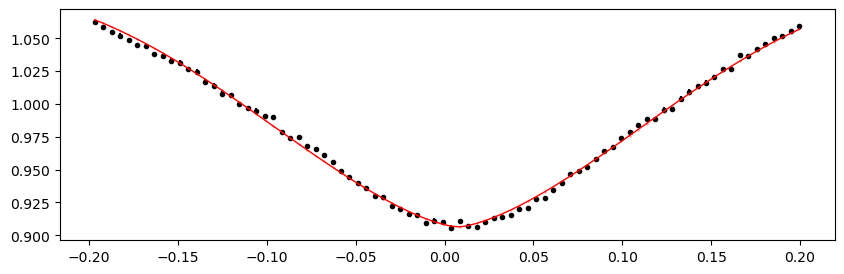

2467.3528066 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.21it/s]


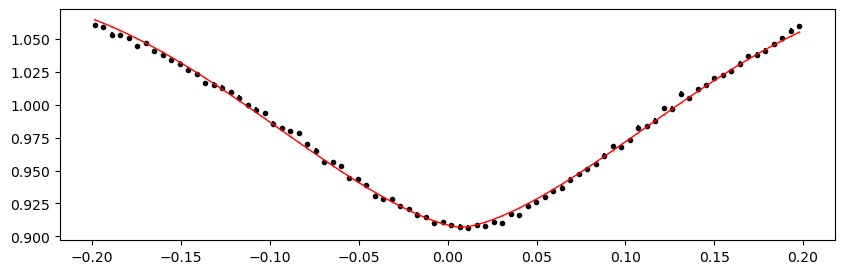

2467.6435853000003 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.39it/s]


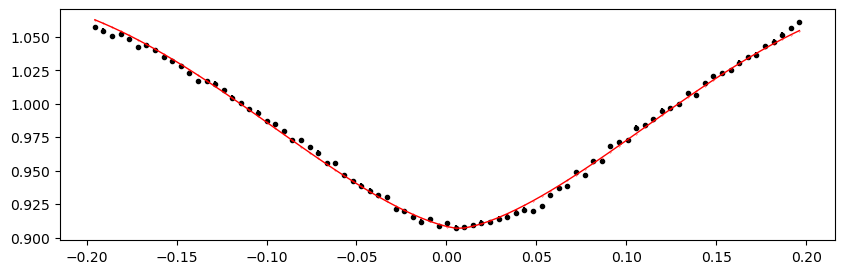

2467.9343639999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.48it/s]


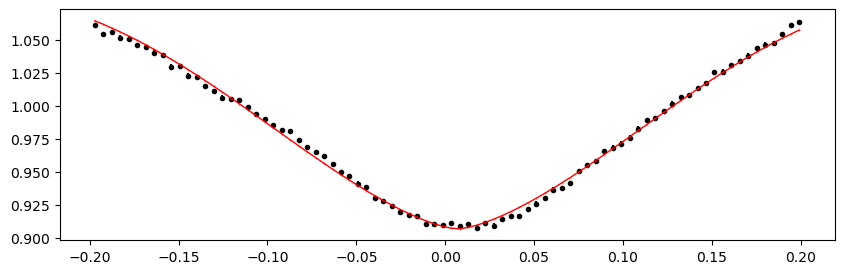

2468.2251427 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.45it/s]


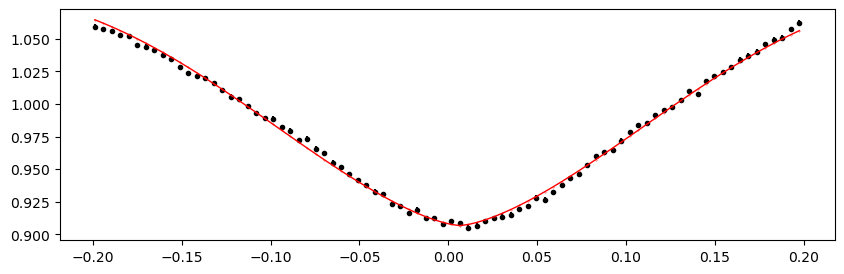

2468.5159214 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.85it/s]


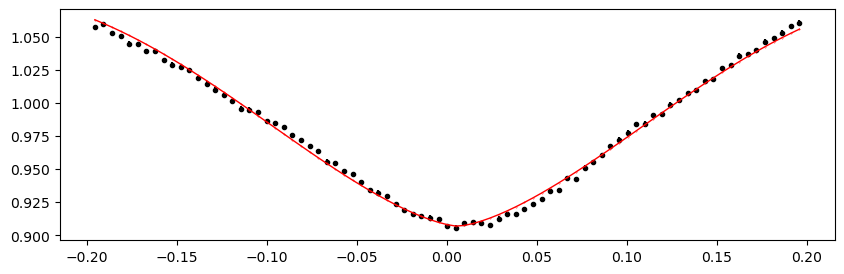

2468.8067001 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.50it/s]


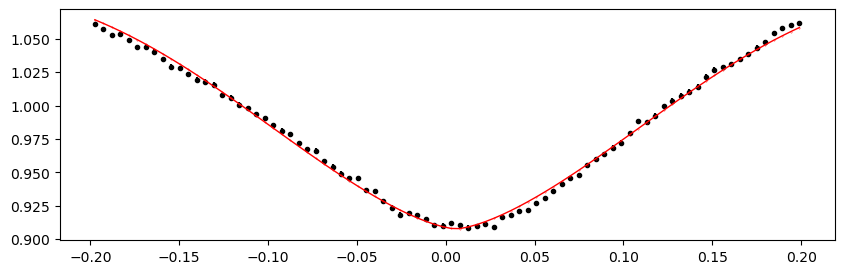

2469.0974788 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.62it/s]


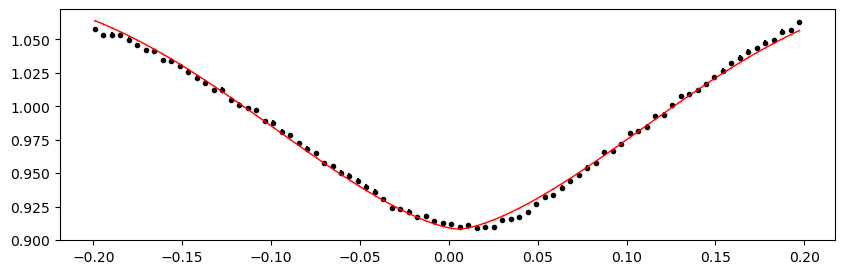

2469.3882575 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.91it/s]


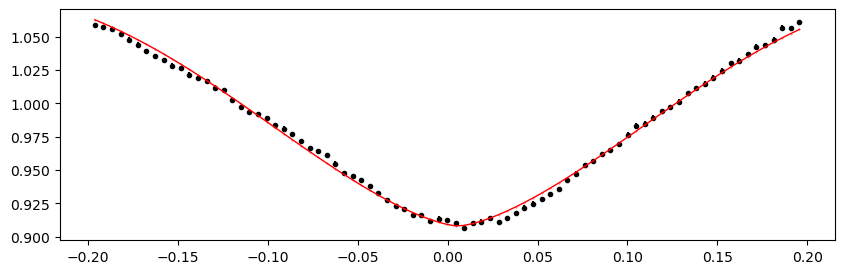

2469.6790362 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.44it/s]


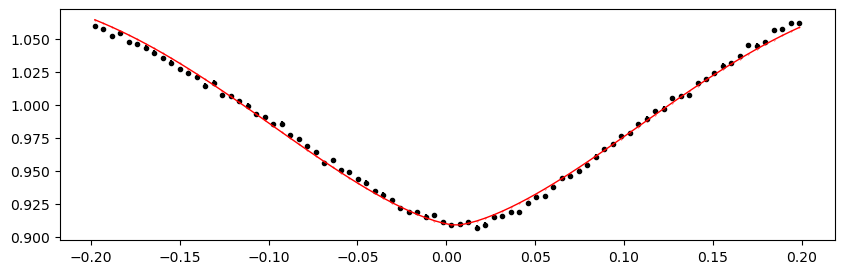

2469.9698148999996 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.66it/s]


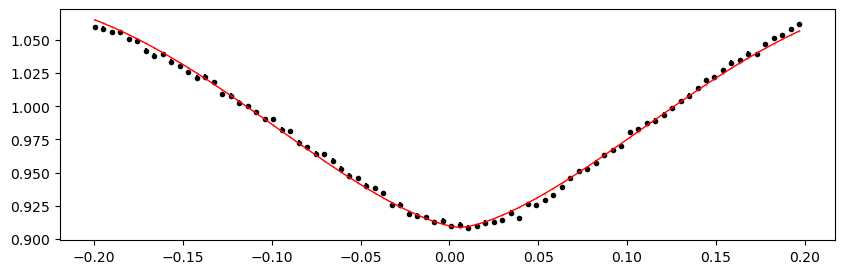

2470.2605936 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.15it/s]


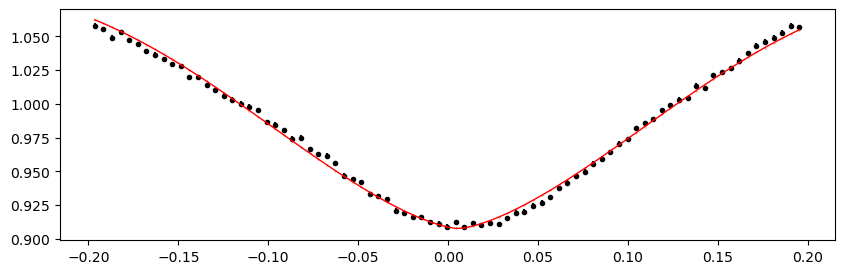

2470.5513723 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.27it/s]


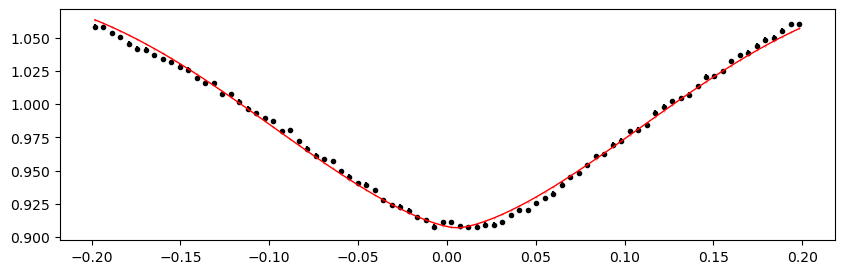

2474.3314953999998 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.70it/s]


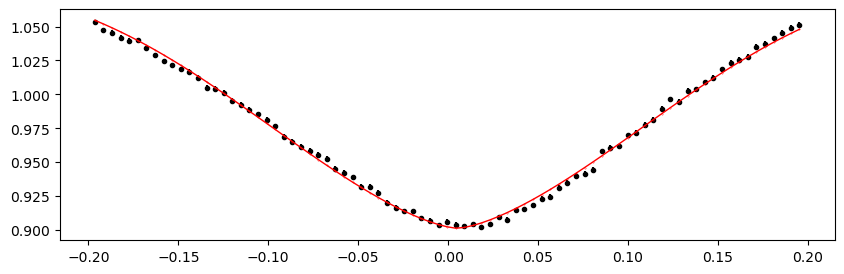

2474.6222741 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.27it/s]


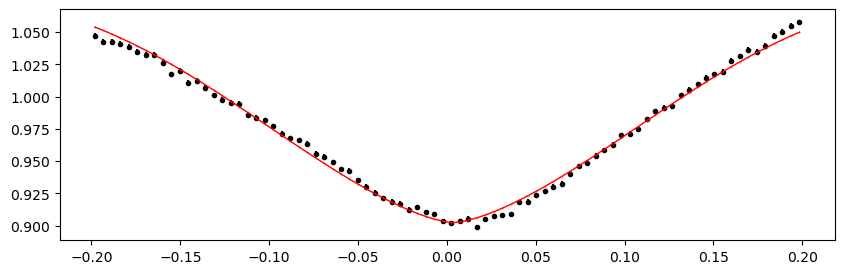

2474.9130527999996 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.90it/s]


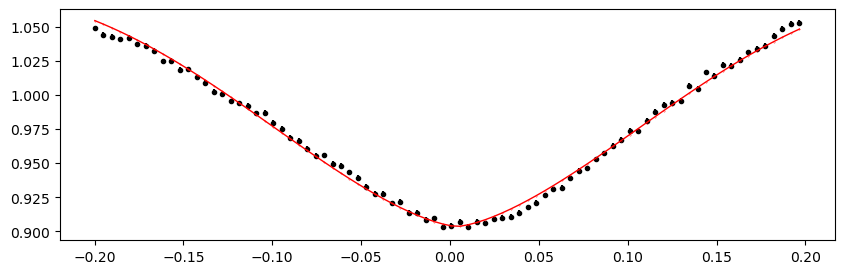

2475.2038315 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.97it/s]


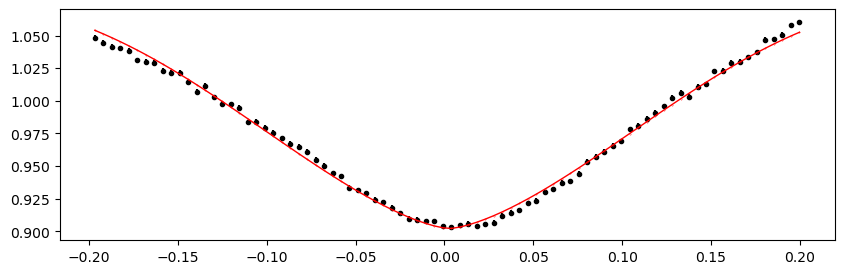

2475.4946102 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.87it/s]


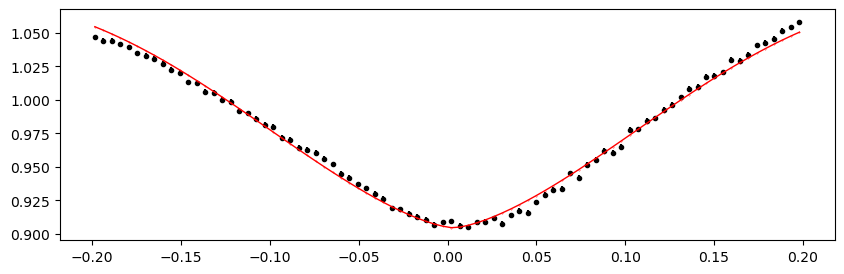

2475.7853889 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.64it/s]


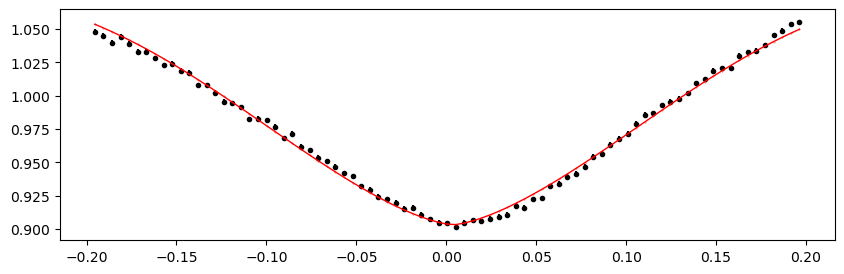

2476.0761676 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.04it/s]


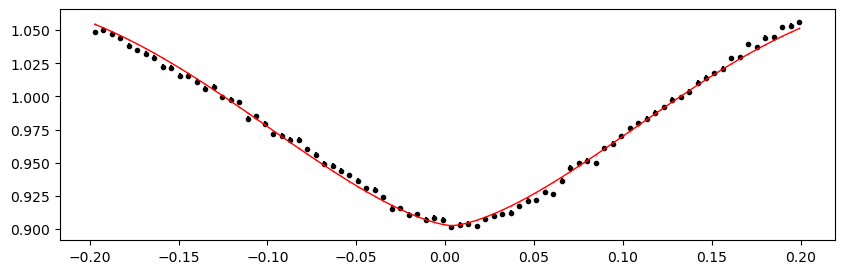

2476.3669462999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.86it/s]


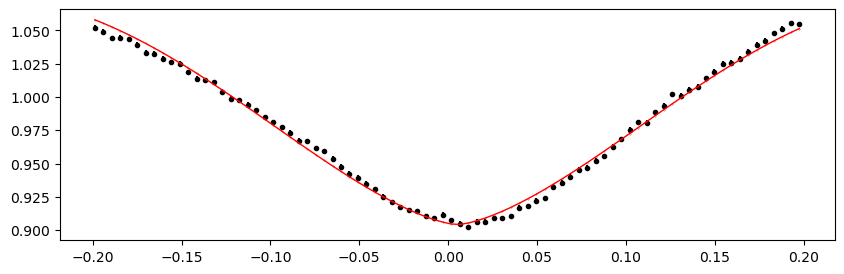

2476.657725 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.52it/s]


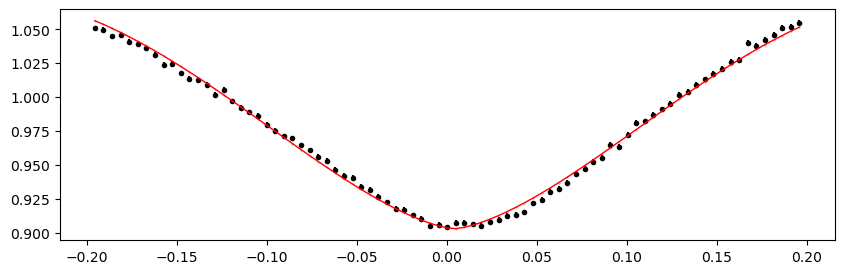

2476.9485037 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.52it/s]


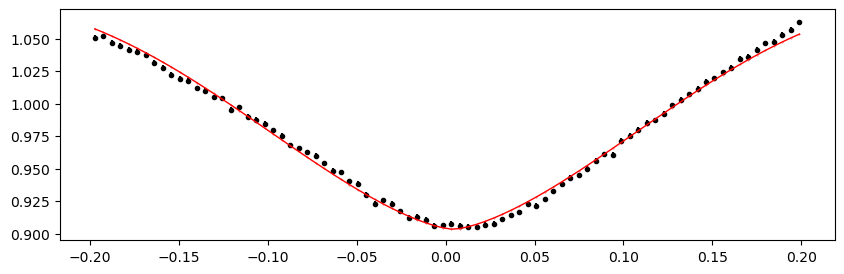

2477.2392824 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.57it/s]


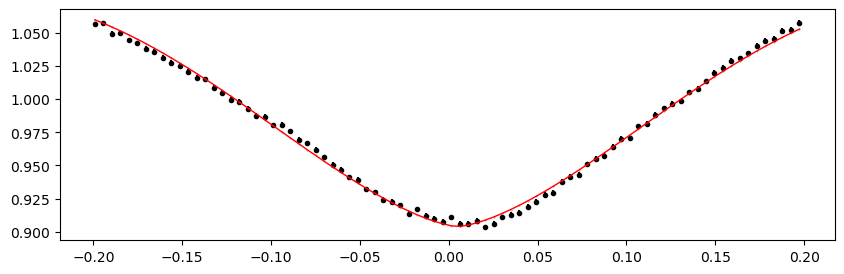

2477.5300611000002 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.89it/s]


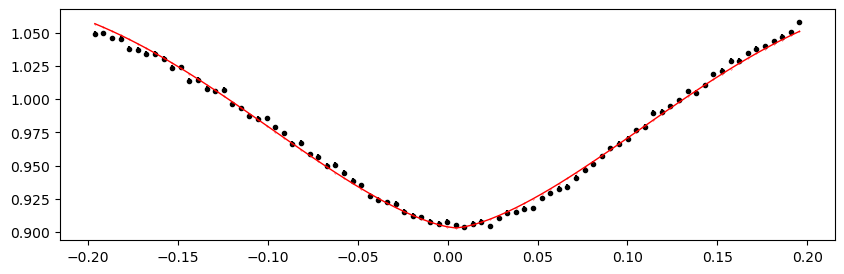

2477.8208397999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.17it/s]


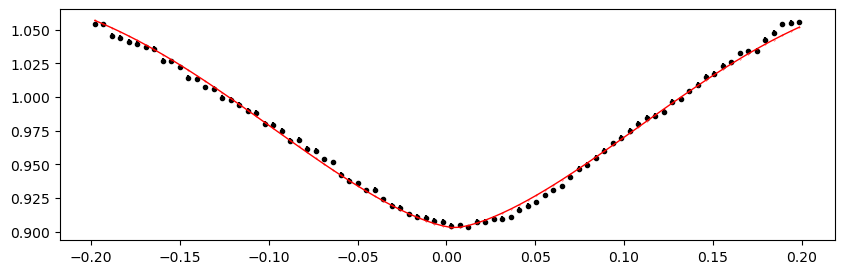

2478.1116185 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.79it/s]


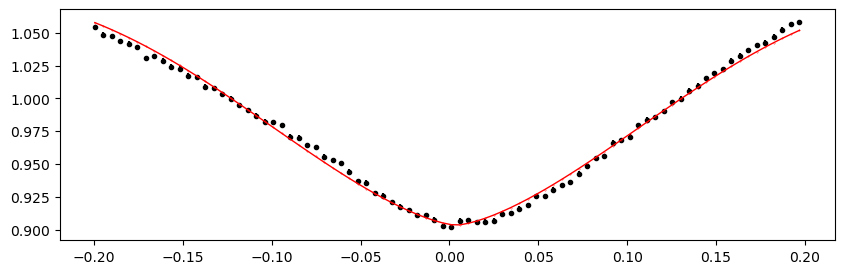

2478.4023972 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.82it/s]


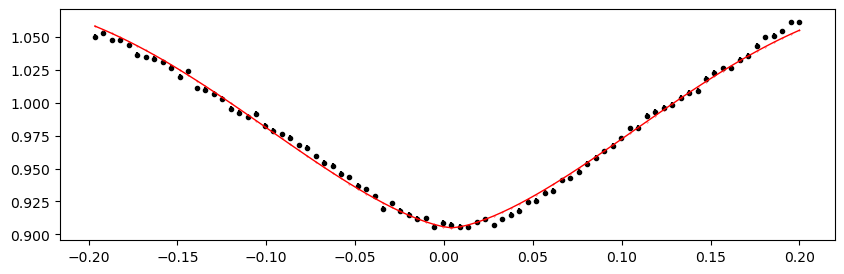

2478.6931759 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.12it/s]


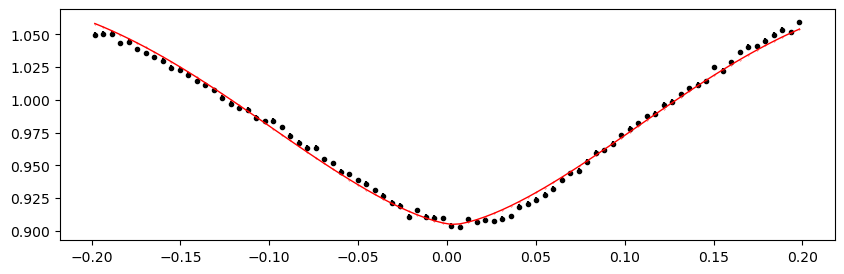

2478.9839546 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.21it/s]


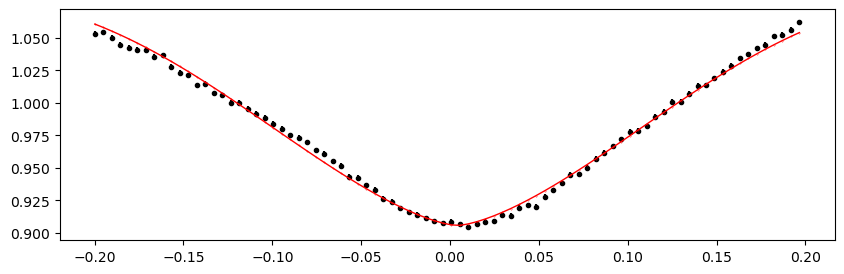

2479.2747332999998 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.24it/s]


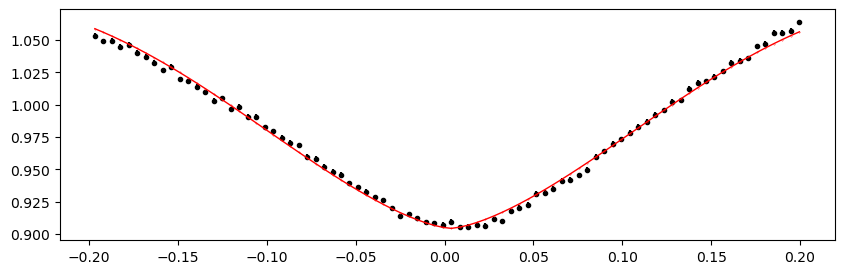

2479.565512 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.77it/s]


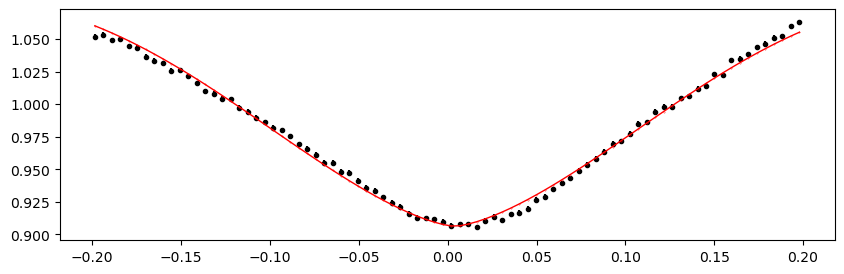

2479.8562907 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.55it/s]


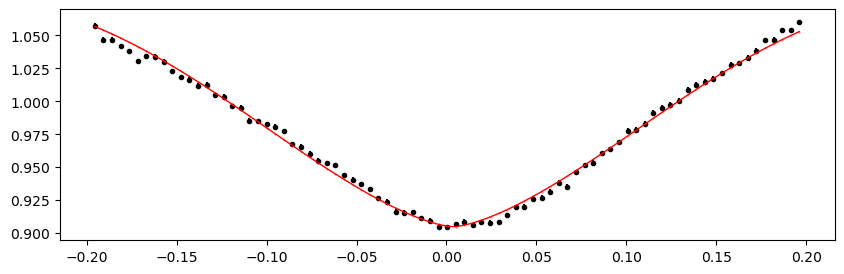

2480.1470694 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.27it/s]


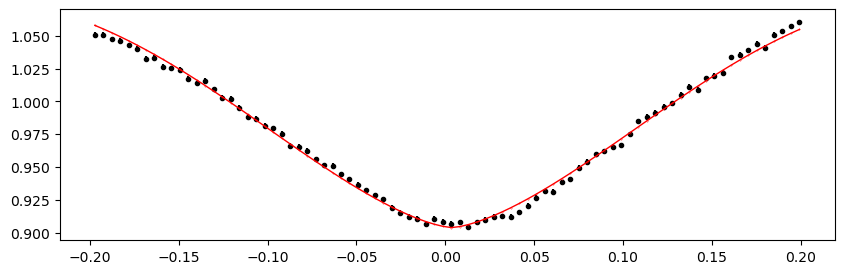

2480.4378481 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.82it/s]


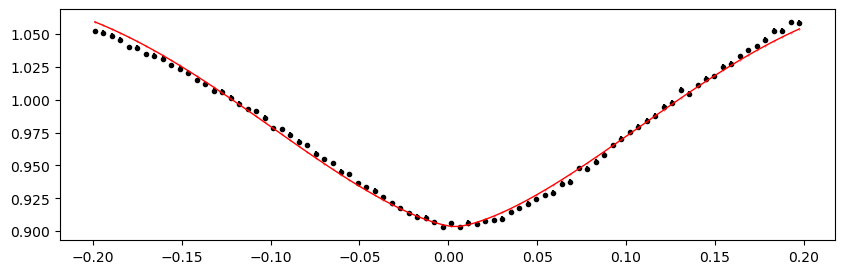

2480.7286268 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.09it/s]


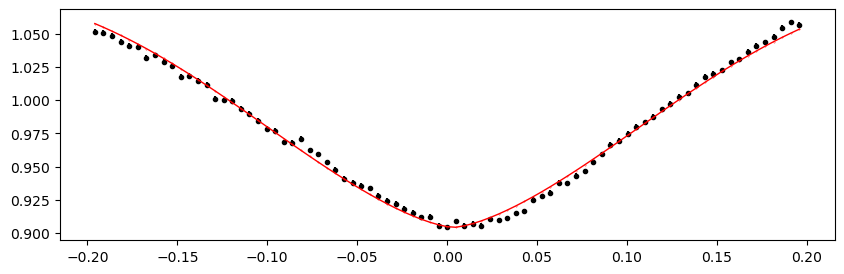

2481.0194055 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.30it/s]


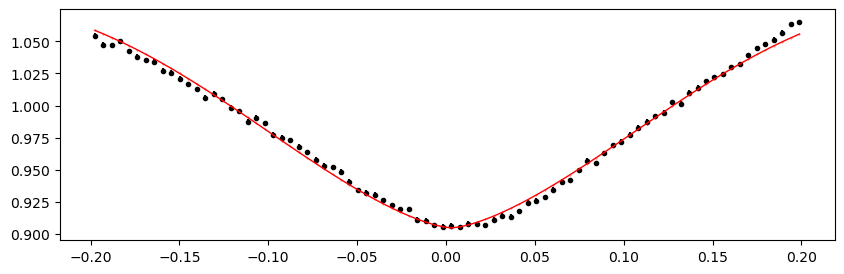

2481.3101841999996 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.69it/s]


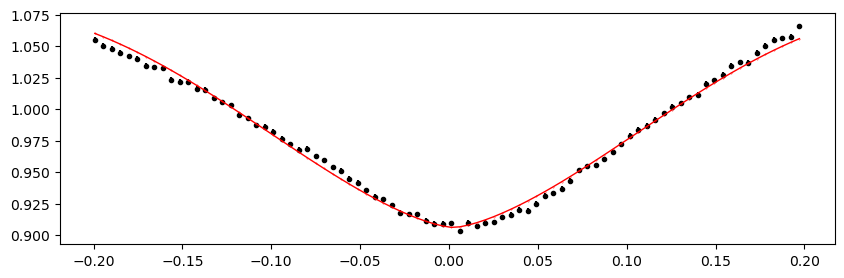

2481.6009629 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.95it/s]


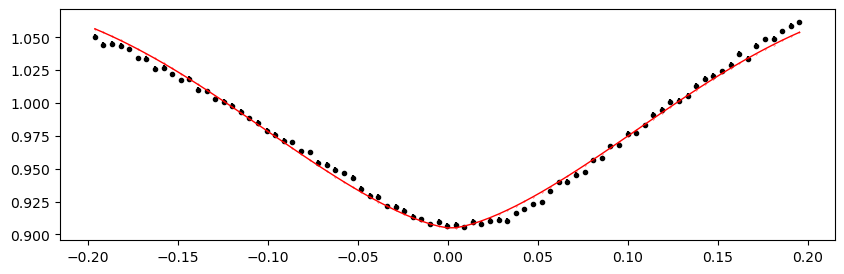

2481.8917416 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.46it/s]


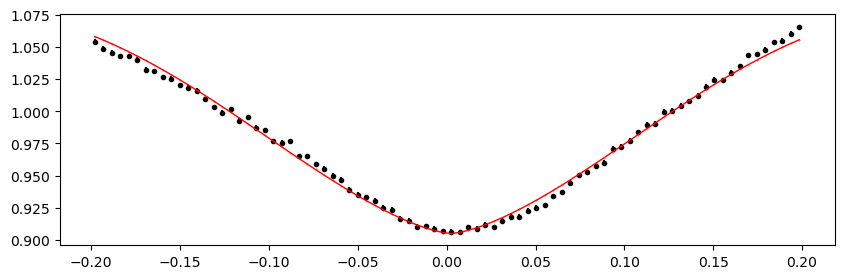

2482.1825203 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.01it/s]


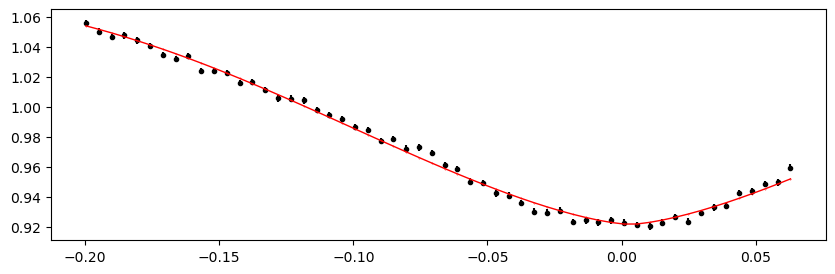

2487.4165369 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.26it/s]


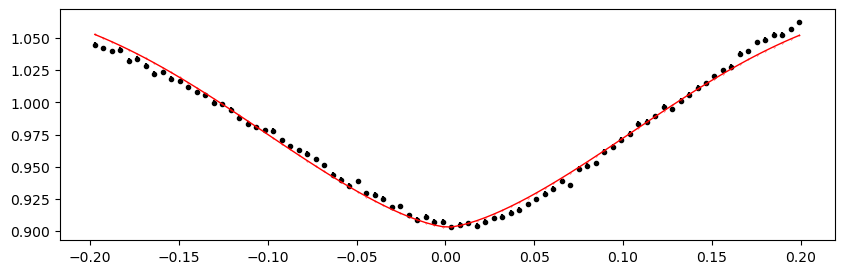

2487.7073155999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.40it/s]


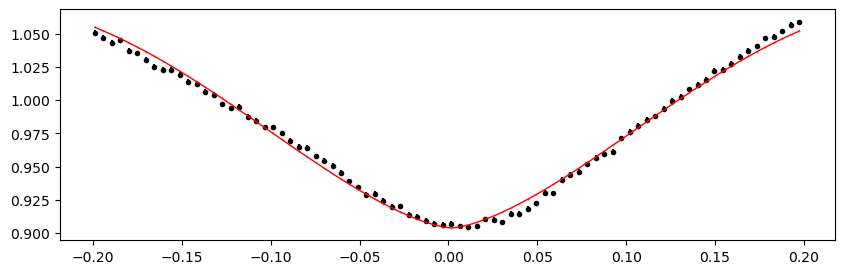

2487.9980943 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.28it/s]


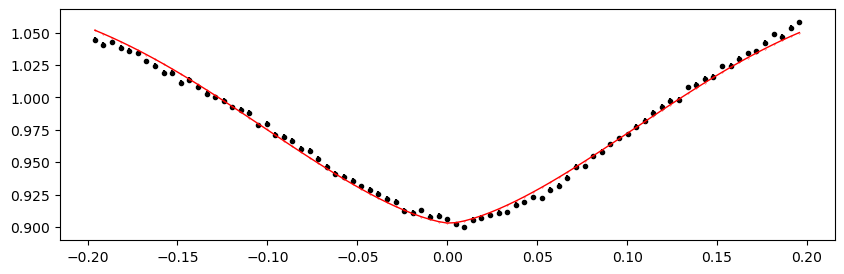

2488.288873 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.08it/s]


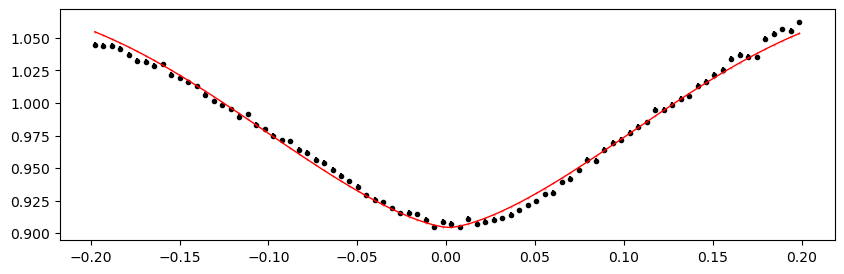

2488.5796517 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.13it/s]


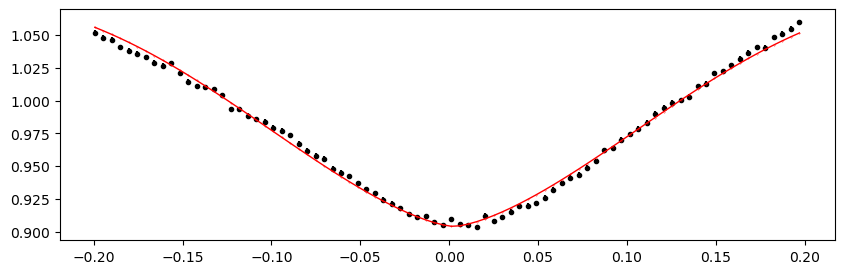

2488.8704304000003 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.46it/s]


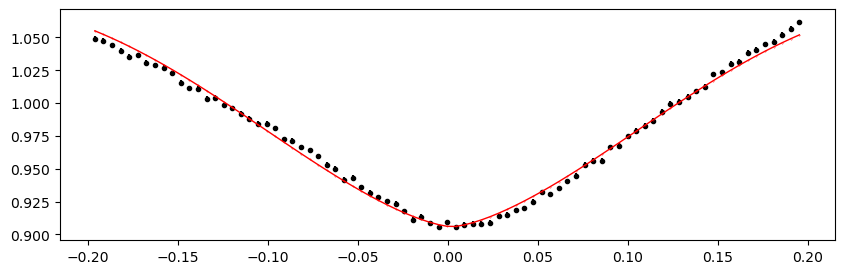

2489.1612090999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.37it/s]


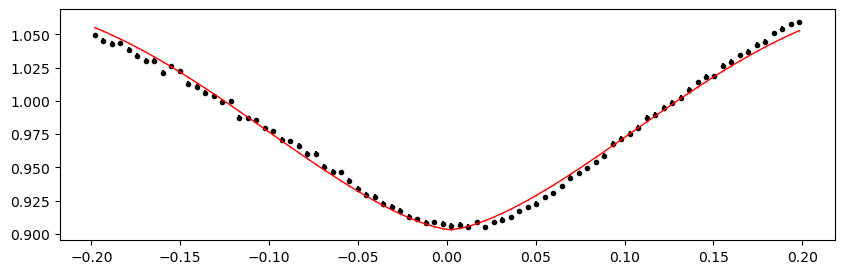

2489.4519878 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.44it/s]


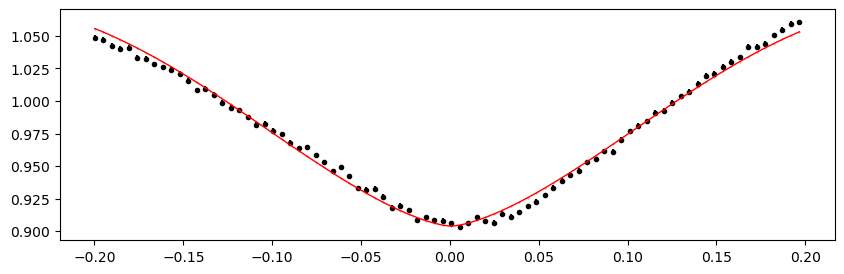

2489.7427665 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.54it/s]


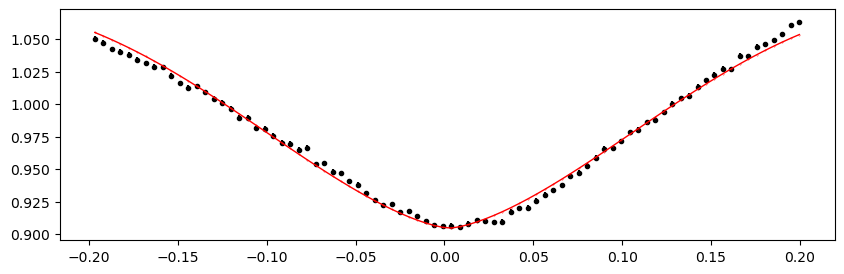

2490.0335452 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.16it/s]


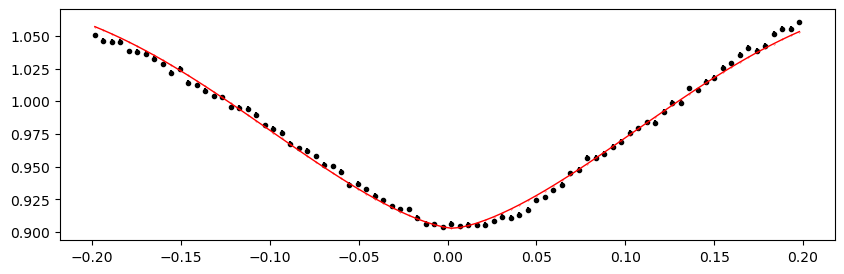

2490.3243239 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.82it/s]


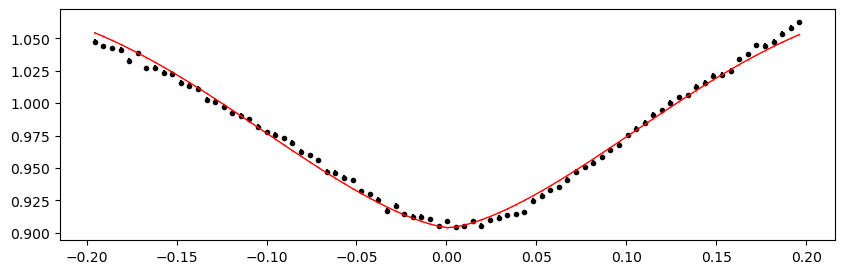

2490.6151026 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.88it/s]


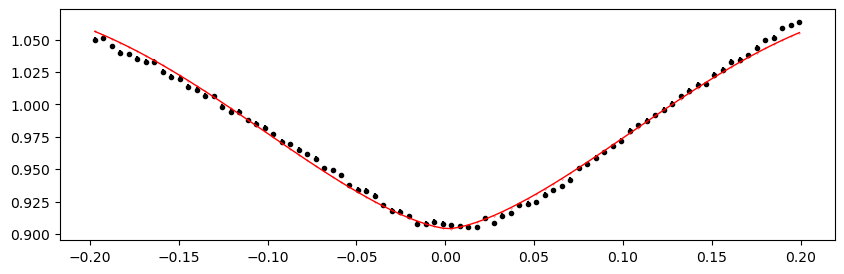

2490.9058813 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.52it/s]


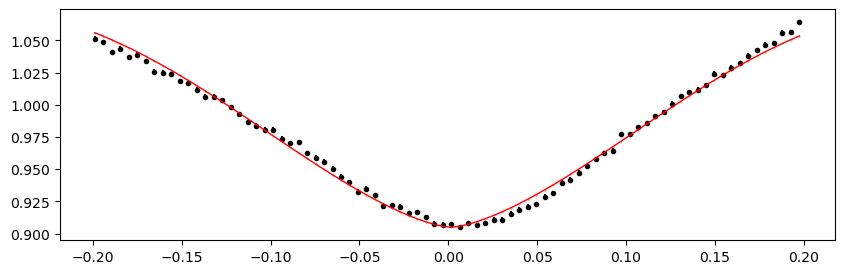

2491.1966599999996 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.50it/s]


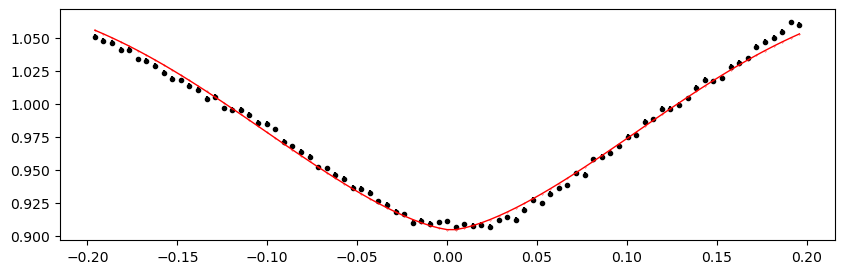

2491.4874387 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.19it/s]


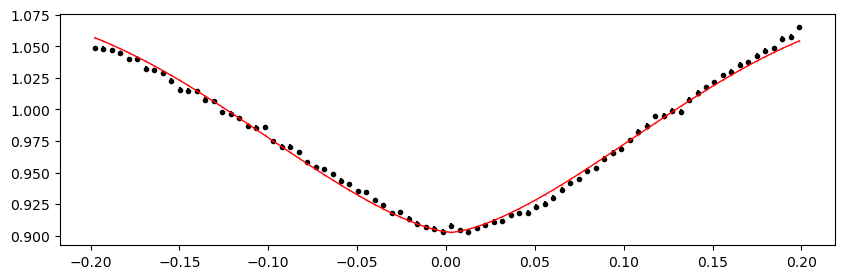

2491.7782174 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.92it/s]


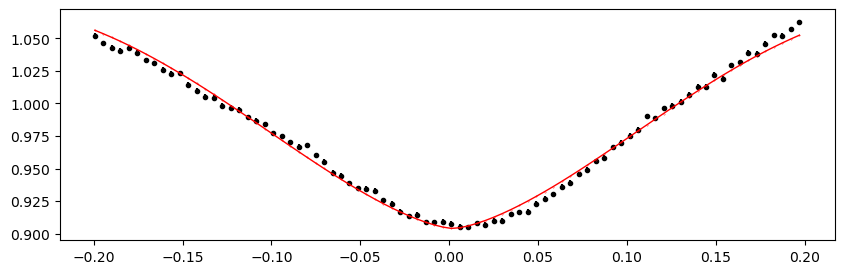

2492.0689961 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.38it/s]


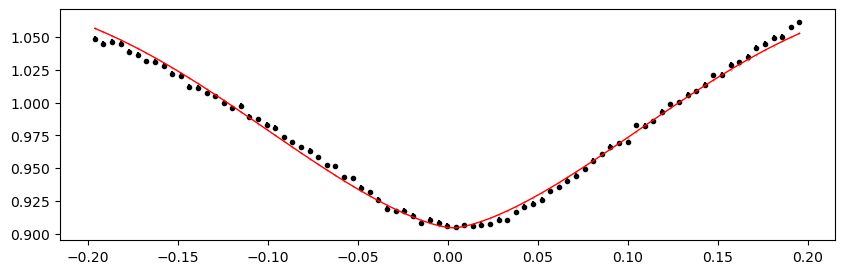

2492.3597748 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.03it/s]


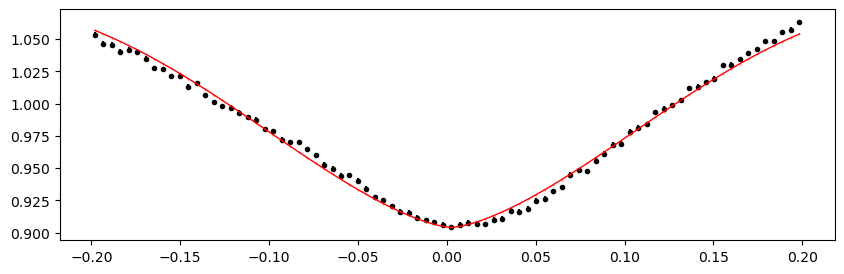

2492.6505534999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.16it/s]


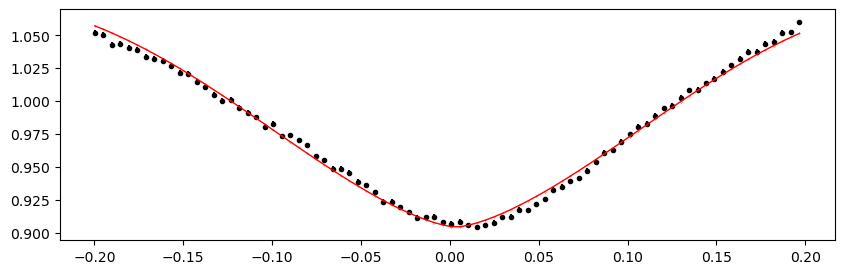

2492.9413322 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.96it/s]


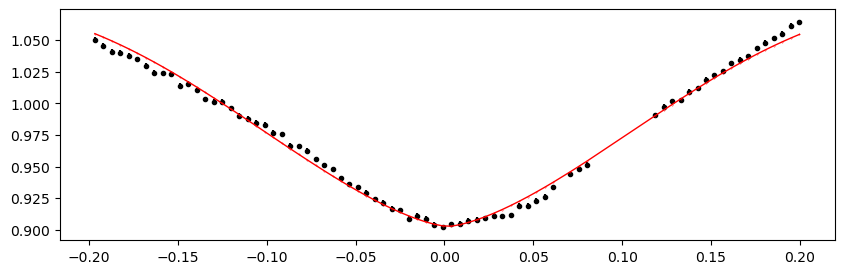

2493.2321109 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.57it/s]


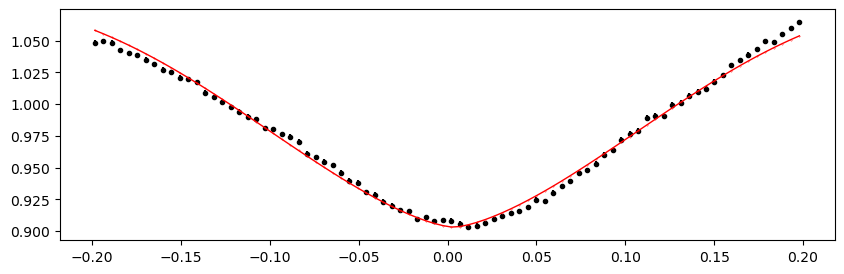

2493.5228896 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.61it/s]


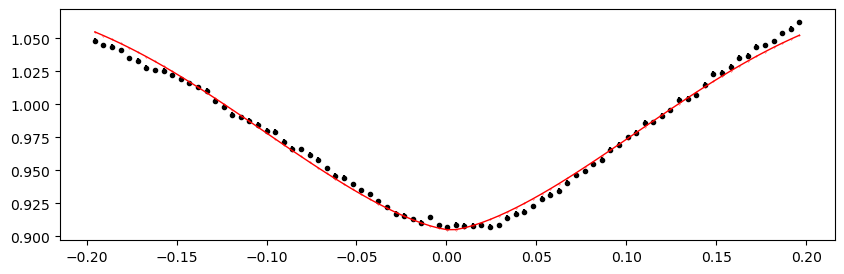

2493.8136683000002 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.68it/s]


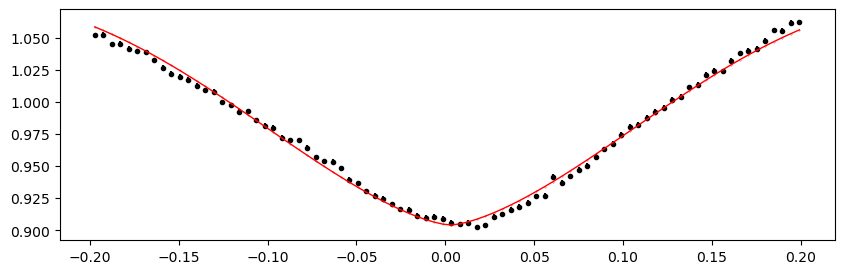

2494.1044469999997 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.52it/s]


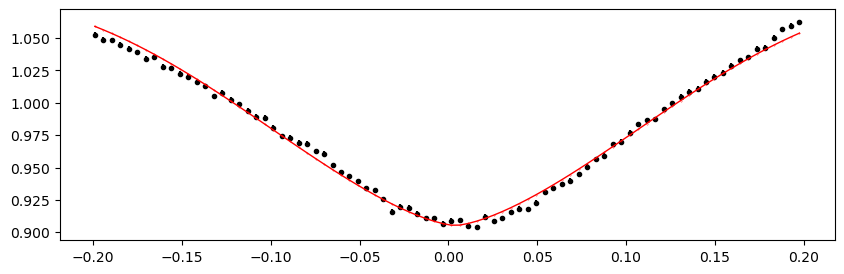

2494.3952257 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.79it/s]


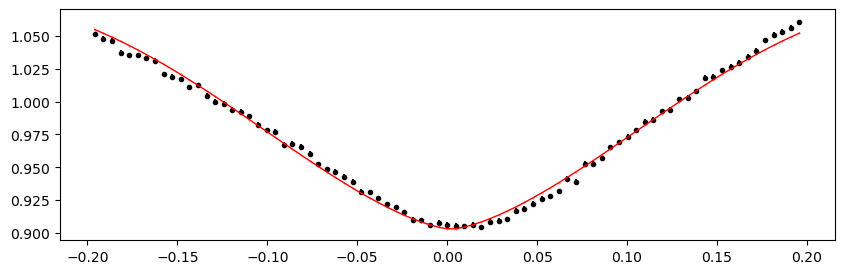

2494.6860044 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.18it/s]


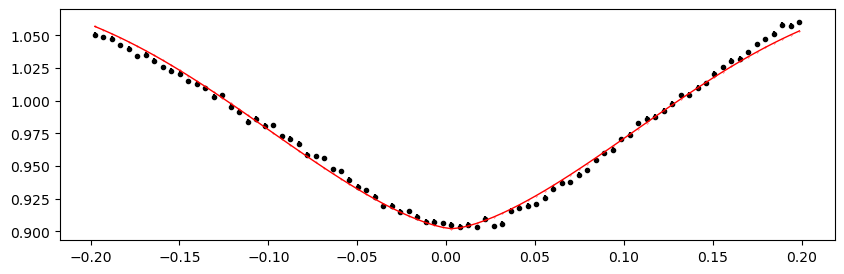

2494.9767831 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.28it/s]


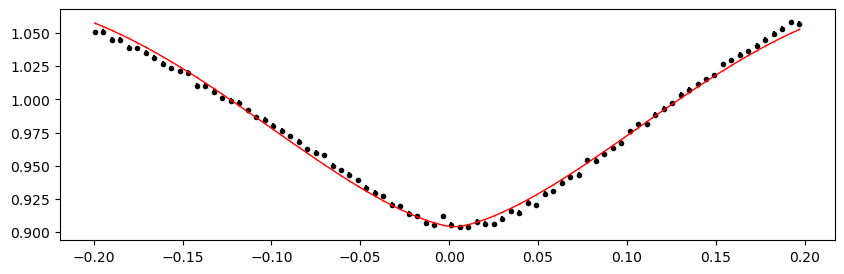

2495.2675618 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 298.46it/s]


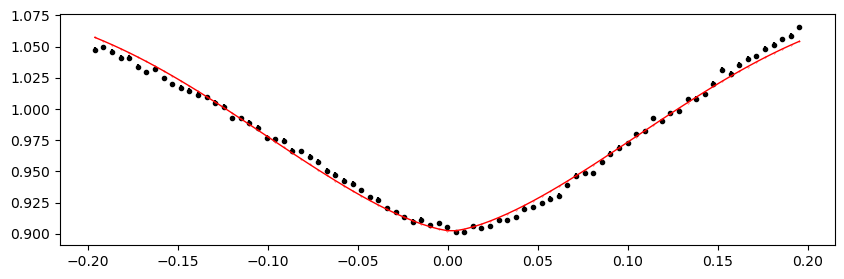

2495.5583404999998 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.94it/s]


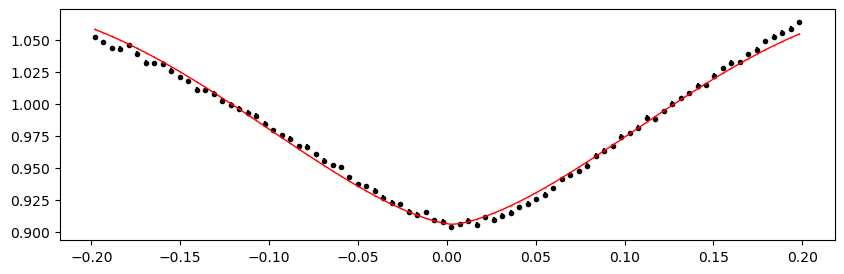

2495.8491192 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.06it/s]


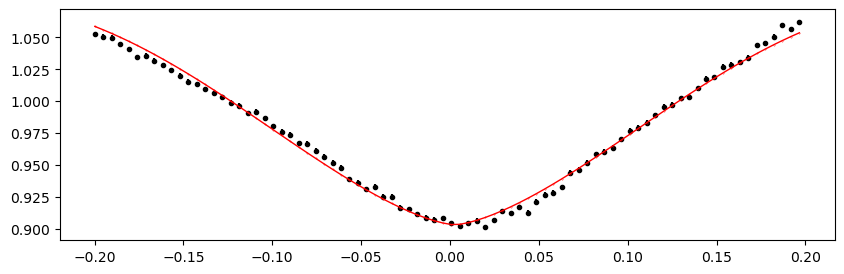

2496.1398978999996 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.43it/s]


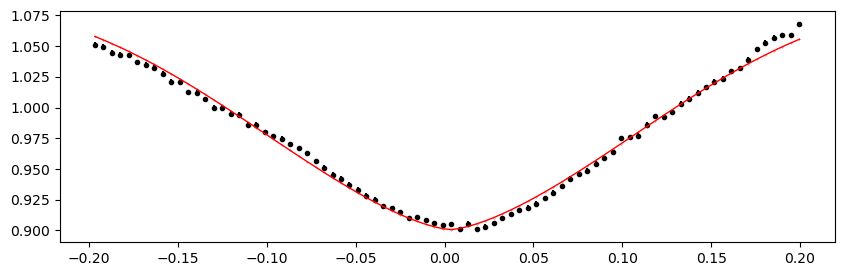

2496.4306766 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.04it/s]


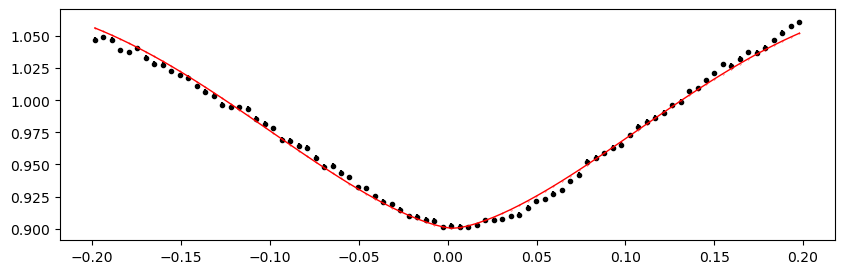

2496.7214553 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.21it/s]


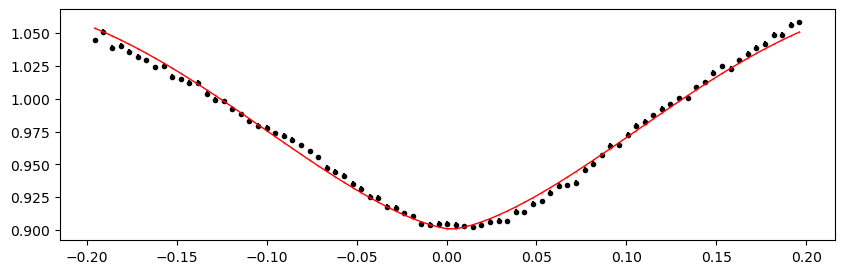

2497.012234 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.31it/s]


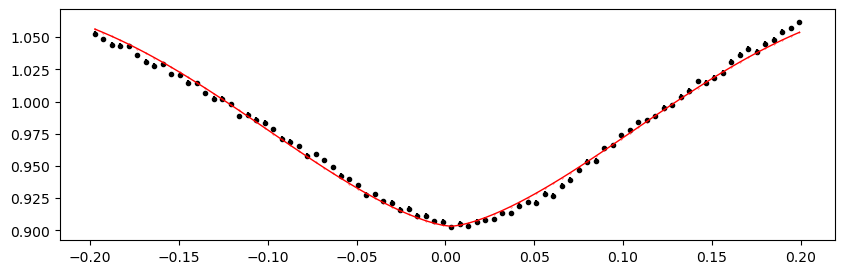

2497.3030127 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.02it/s]


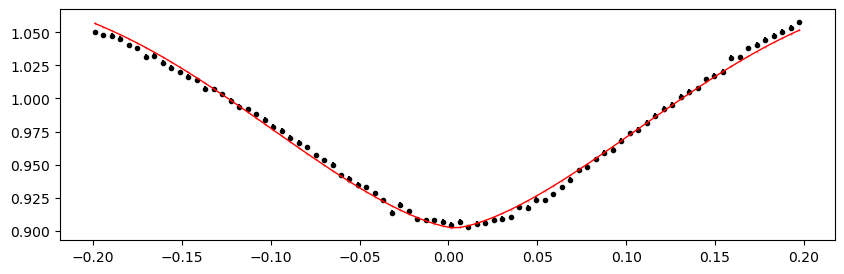

2497.5937913999996 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.54it/s]


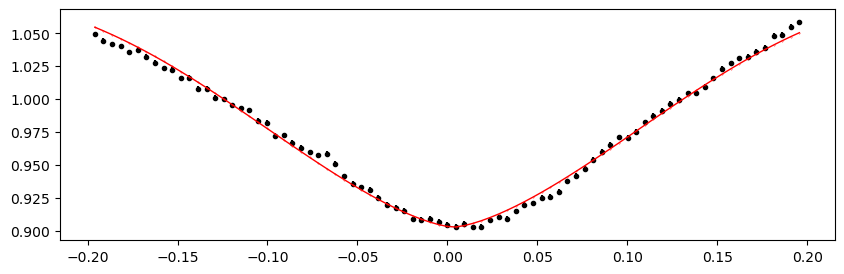

2497.8845701 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.56it/s]


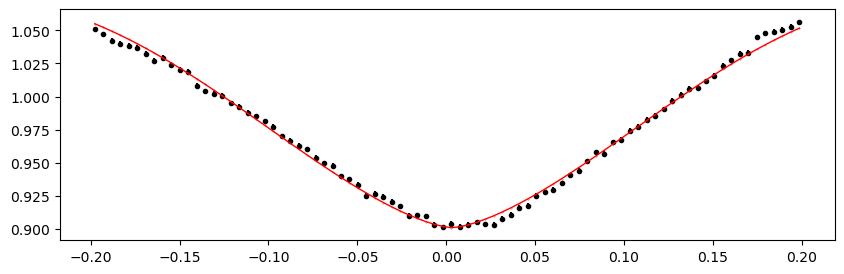

2498.1753488 1.0860468609118734 -0.18284371724120857 0.22168431580507153


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.59it/s]


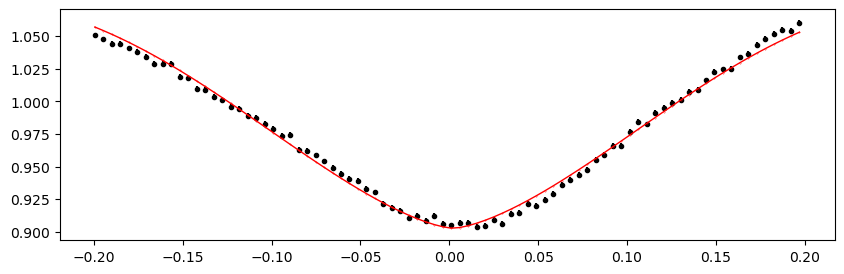

Fitting individual secondary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
Number 1 has already been completed -- skip
Number 2 has already been completed -- skip
Number 3 has already been completed -- skip
1387.2574361 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.69it/s]


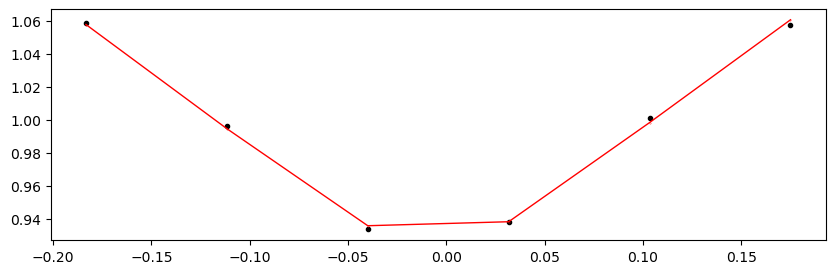

1387.5482148 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.46it/s]


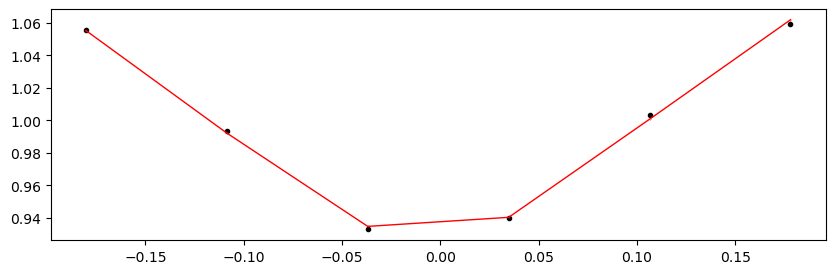

1387.8389935 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.22it/s]


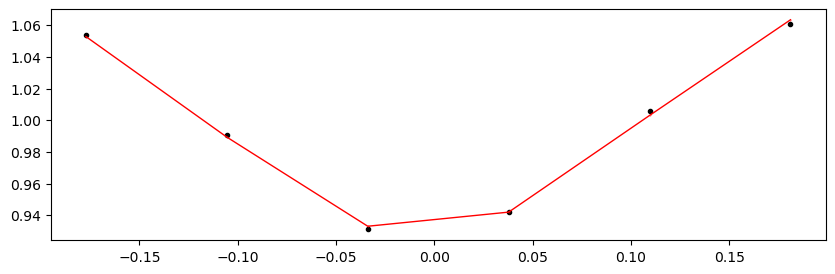

1388.1297722 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.49it/s]


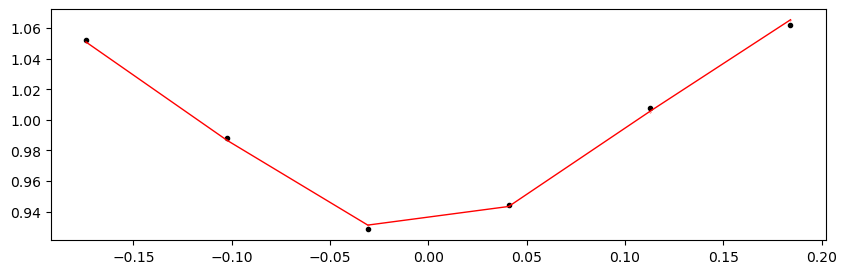

1388.4205509 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.42it/s]


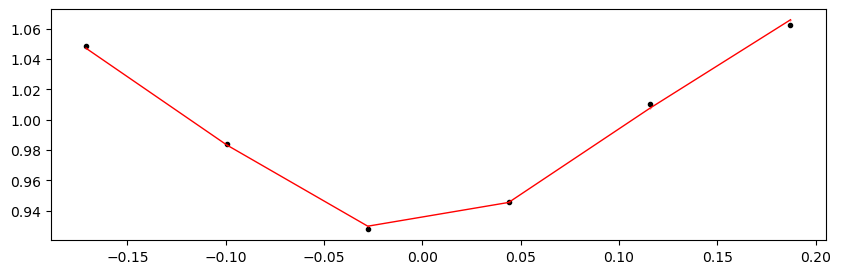

1388.7113296 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.17it/s]


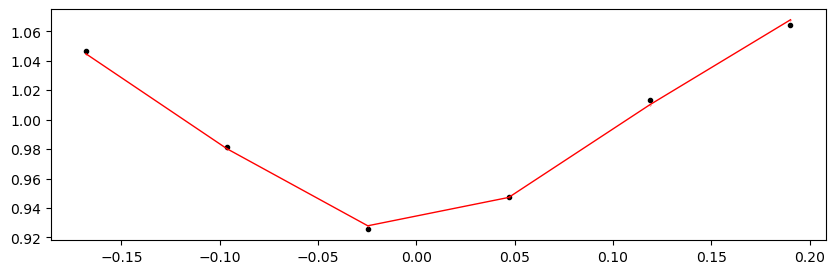

1389.0021083000001 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.83it/s]


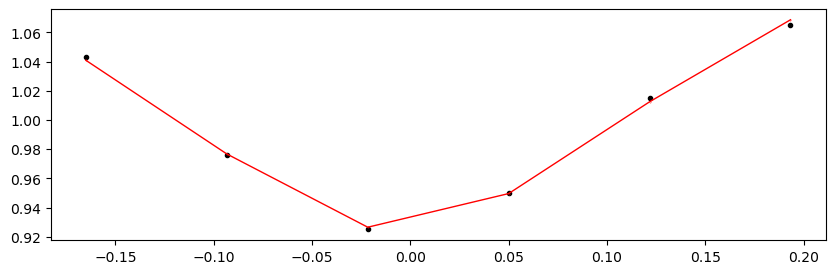

1389.292887 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.72it/s]


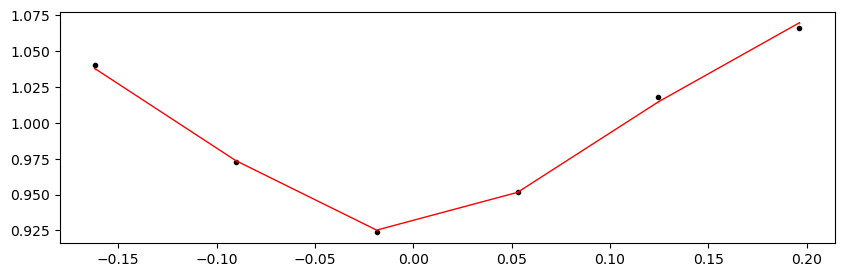

1389.5836657 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.46it/s]


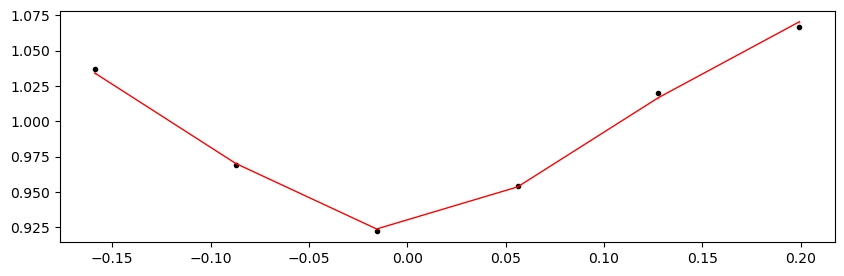

Time 1389.8744444000001 does not have enough data points: 5
Time 1390.1652231 does not have enough data points: 5
Time 1390.4560018 does not have enough data points: 5
Time 1390.7467805 does not have enough data points: 5
Time 1391.0375592 does not have enough data points: 5
Time 1391.3283379 does not have enough data points: 5
Time 1391.6191166 does not have enough data points: 5
Time 1391.9098953 does not have enough data points: 5
Time 1392.200674 does not have enough data points: 5
1392.4914527 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.68it/s]


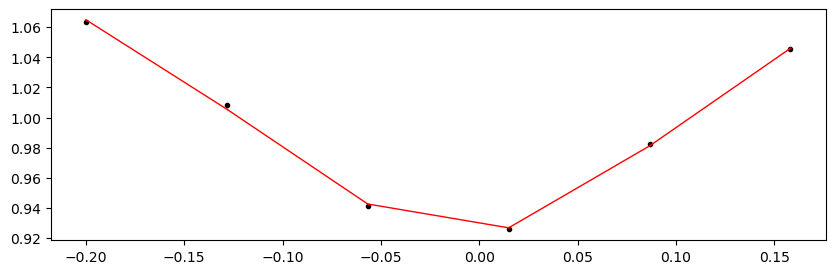

Time 1392.7822314 does not have enough data points: 4
1393.0730101000001 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.60it/s]


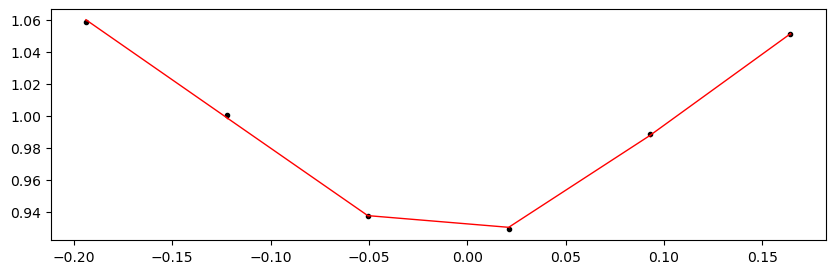

1393.3637888 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.79it/s]


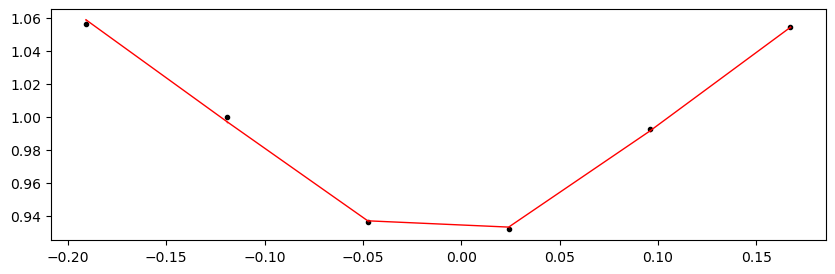

1393.6545675 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.00it/s]


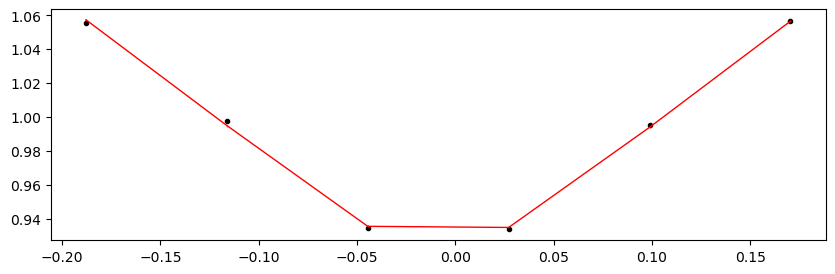

1393.9453462000001 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.45it/s]


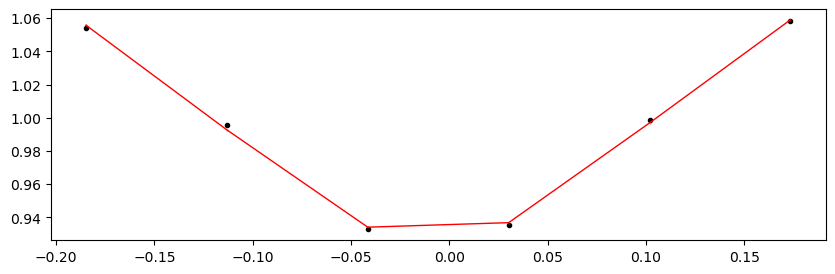

1394.2361249 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.40it/s]


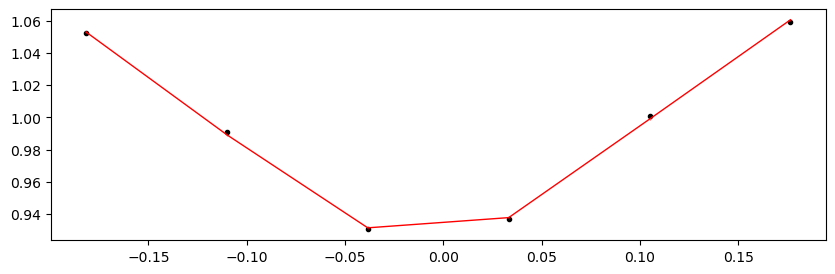

Time 1394.5269036 does not have enough data points: 2
Time 1396.8531332 does not have enough data points: 5
Time 1397.1439119000001 does not have enough data points: 5
Time 1397.4346906 does not have enough data points: 5
Time 1397.7254693 does not have enough data points: 5
Time 1398.0162480000001 does not have enough data points: 5
Time 1398.3070267 does not have enough data points: 5
Time 1398.5978054 does not have enough data points: 5
Time 1398.8885841000001 does not have enough data points: 5
Time 1399.1793628 does not have enough data points: 5
1399.4701415 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.44it/s]


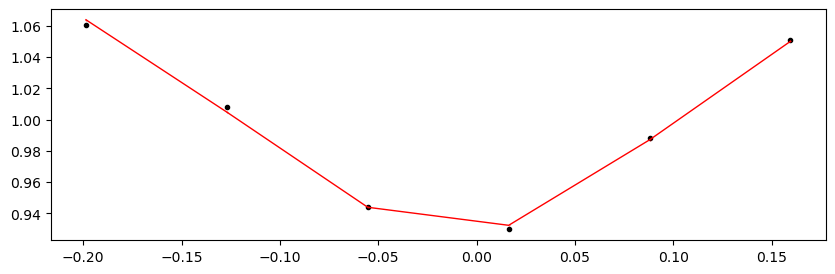

1399.7609202 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.26it/s]


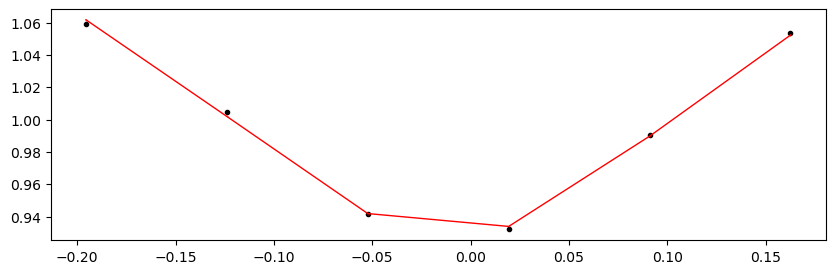

1400.0516989 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.75it/s]


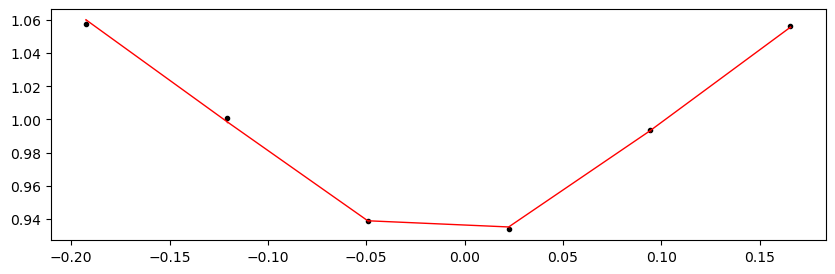

1400.3424776 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.92it/s]


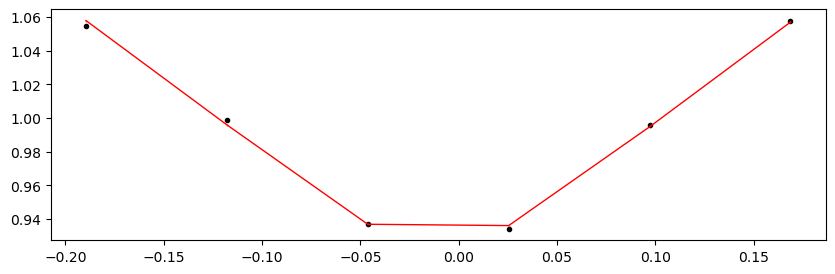

Time 1400.6332563 does not have enough data points: 5
1400.924035 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 416.84it/s]


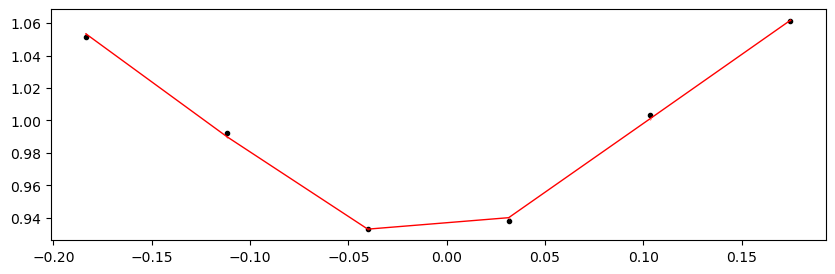

1401.2148137000001 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.57it/s]


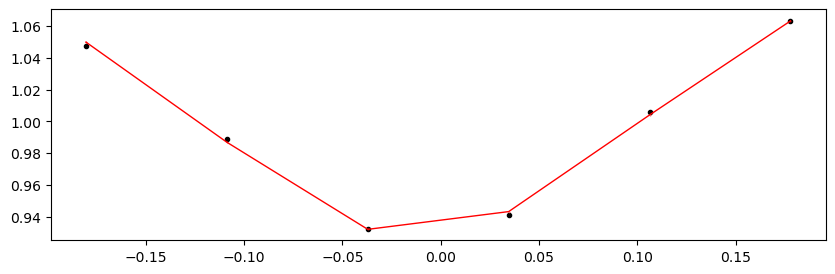

1401.5055924 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.81it/s]


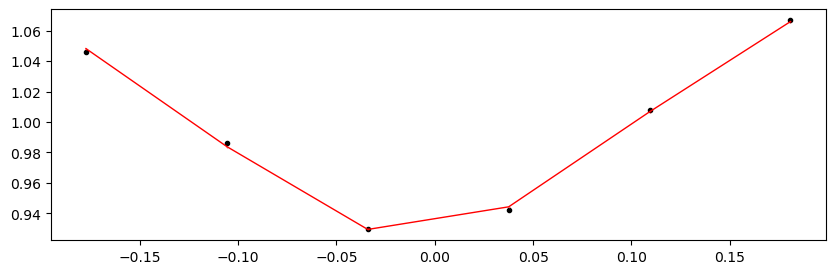

1401.7963711 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.93it/s]


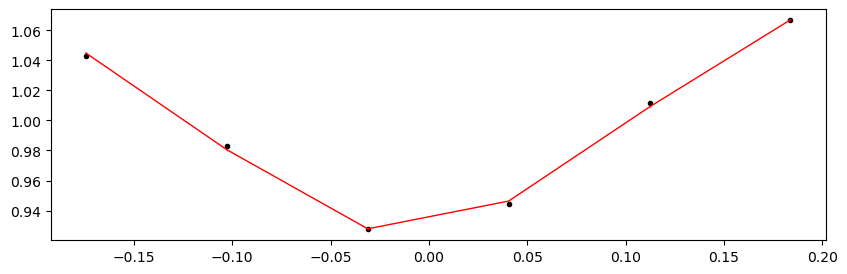

1402.0871498000001 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 416.67it/s]


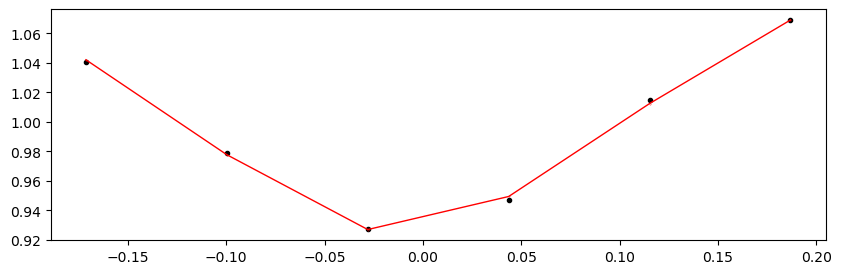

1402.3779285 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.81it/s]


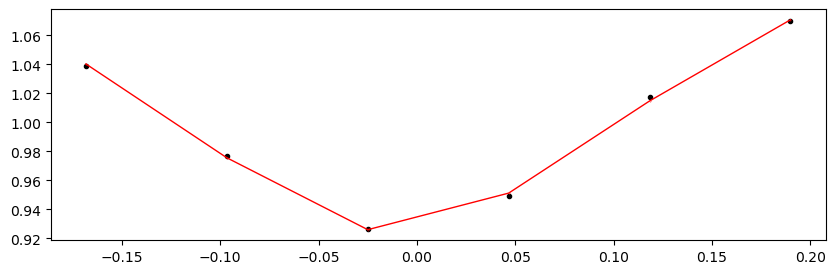

Time 1402.6687072 does not have enough data points: 3
1402.9594859000001 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.20it/s]


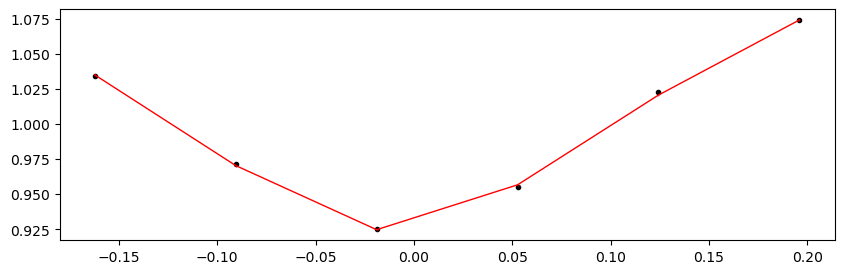

1403.2502646 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.46it/s]


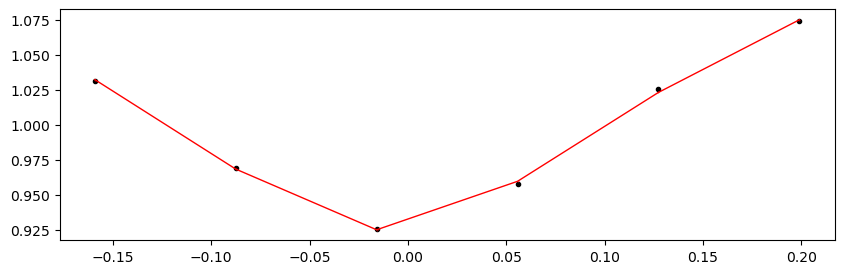

Time 1403.5410433 does not have enough data points: 5
Time 1403.831822 does not have enough data points: 5
Time 1404.1226007 does not have enough data points: 5
Time 1404.4133794 does not have enough data points: 5
Time 1404.7041581 does not have enough data points: 3
Time 1404.9949368 does not have enough data points: 5
Time 1405.2857155000002 does not have enough data points: 5
Time 1405.5764942 does not have enough data points: 5
Time 1405.8672729 does not have enough data points: 5
Time 1406.1580516000001 does not have enough data points: 5
2115.9488583 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 305.60it/s]


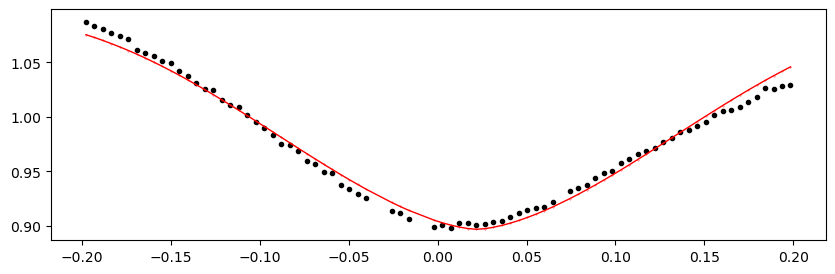

2116.239637 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.57it/s]


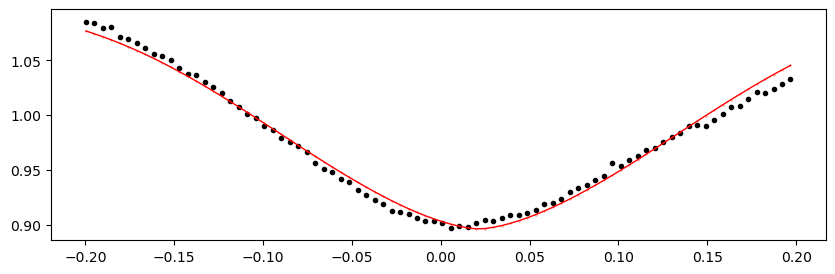

2116.5304157 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.85it/s]


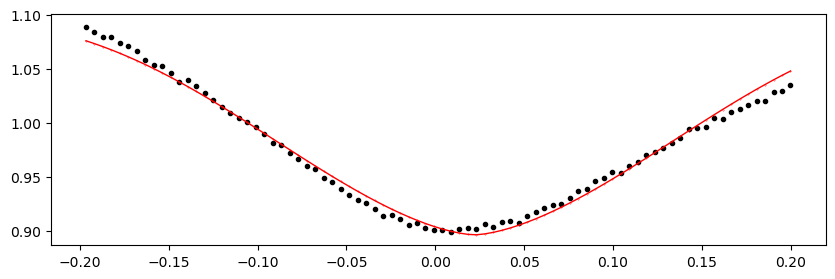

2116.8211944 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.53it/s]


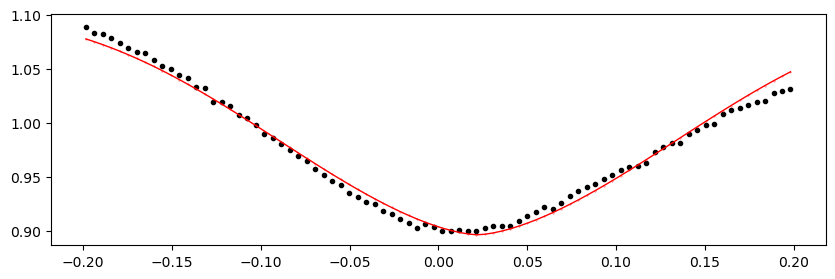

2117.1119731 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.52it/s]


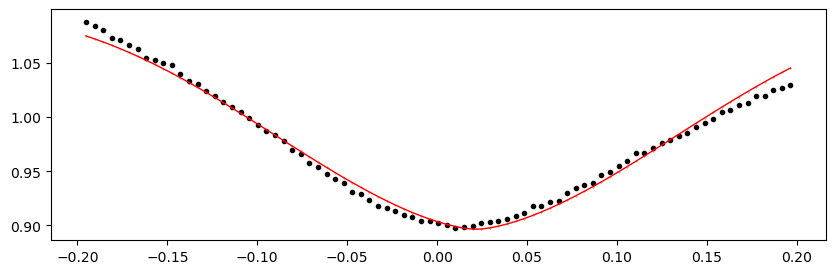

2117.4027518000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.50it/s]


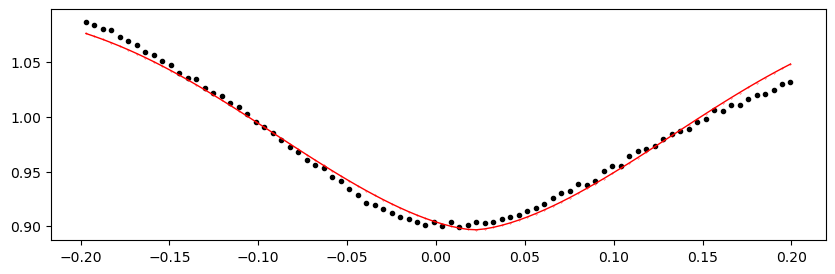

2117.6935305 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.76it/s]


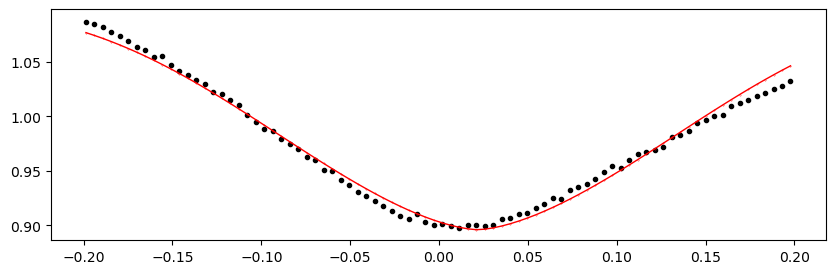

2117.9843092 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.87it/s]


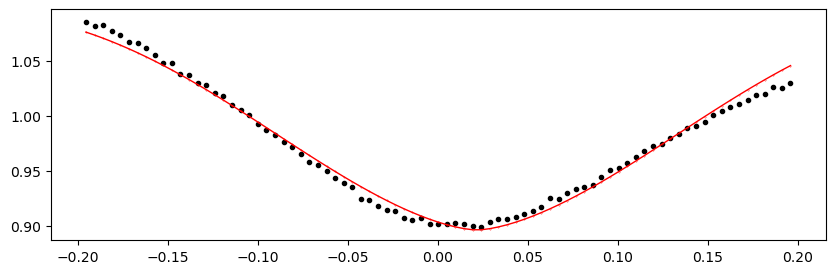

2118.2750879 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.48it/s]


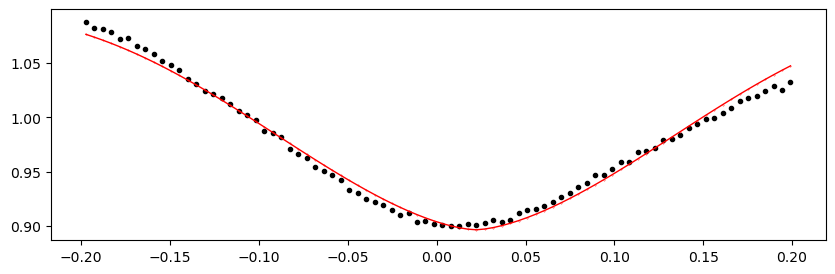

2118.5658666 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.91it/s]


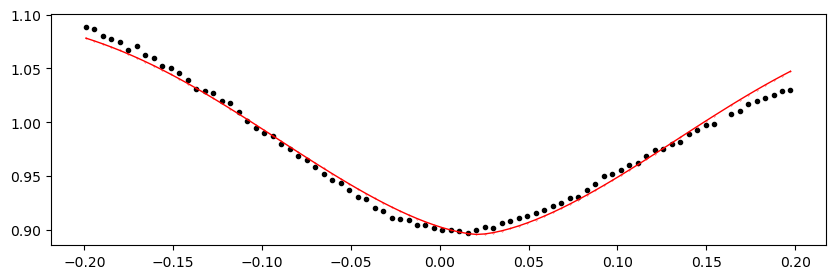

2118.8566453000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.12it/s]


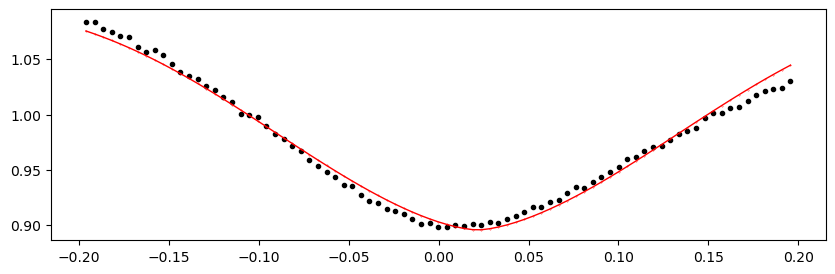

2119.147424 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.49it/s]


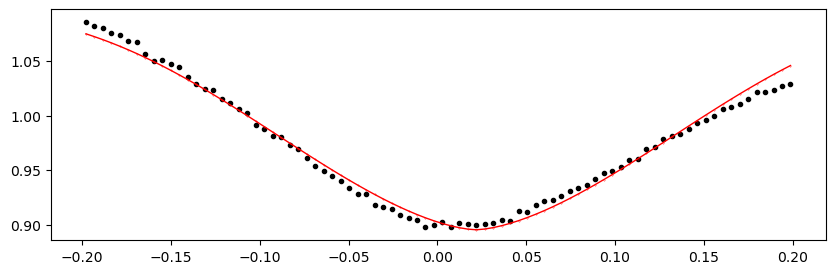

2119.4382027 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.95it/s]


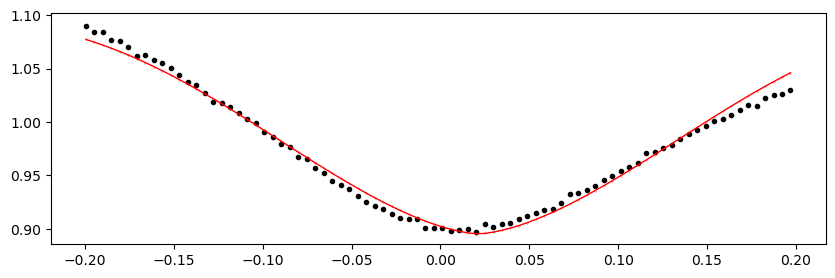

2119.7289814 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.43it/s]


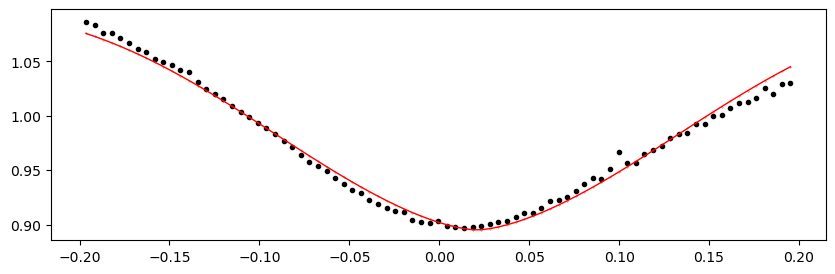

2120.0197601 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.10it/s]


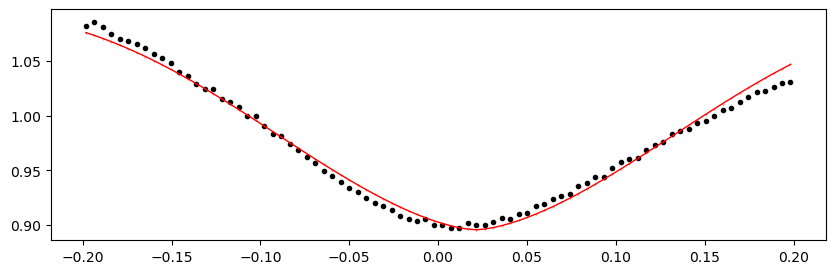

2120.3105388 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.54it/s]


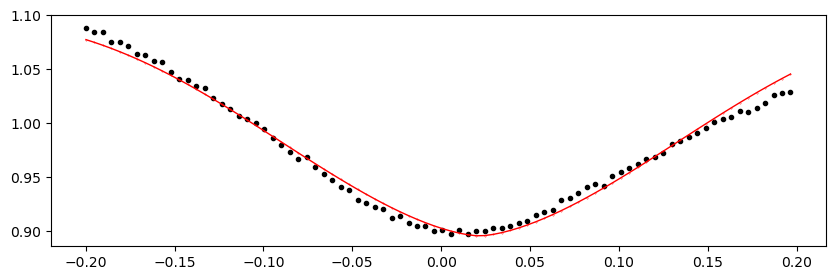

2120.6013175 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.59it/s]


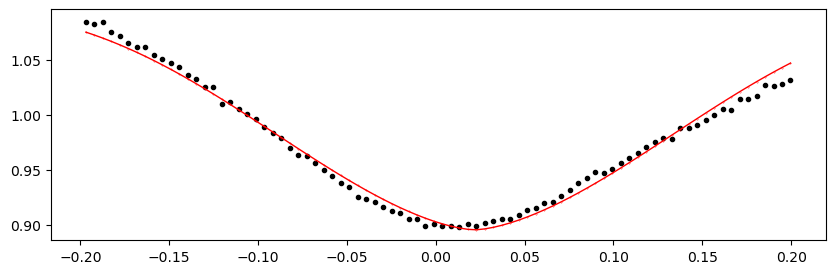

2120.8920962 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.08it/s]


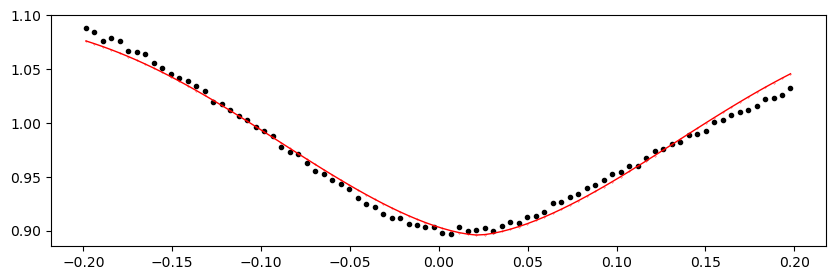

2121.1828749 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.83it/s]


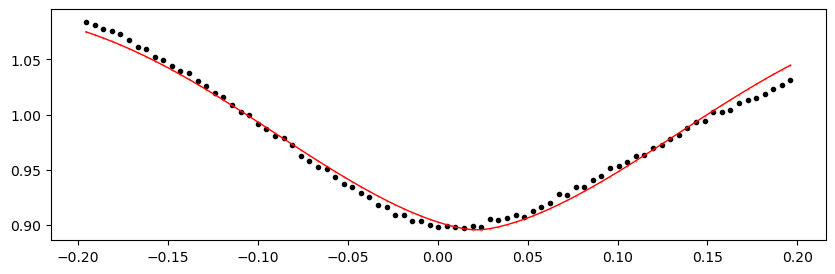

2121.4736536 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.65it/s]


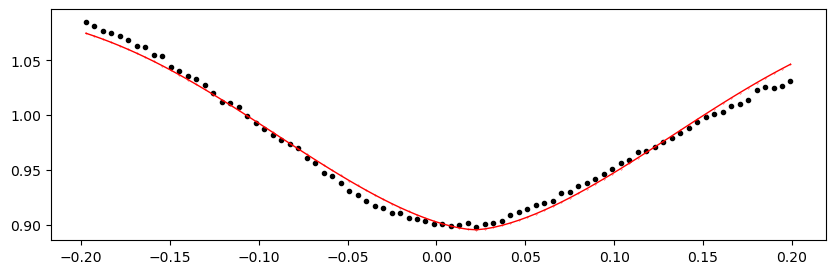

2121.7644323 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.81it/s]


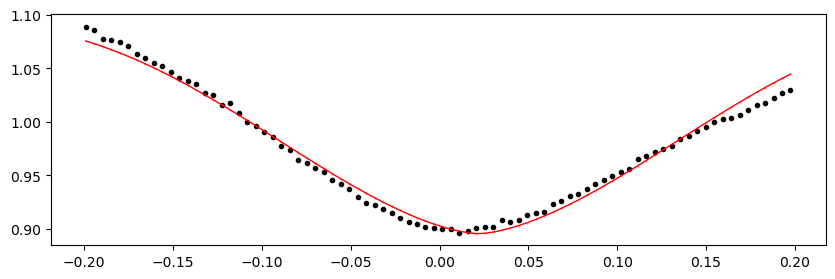

2122.055211 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.99it/s]


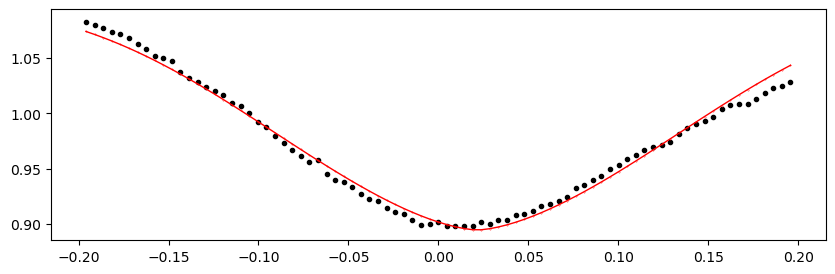

2122.3459897000002 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.04it/s]


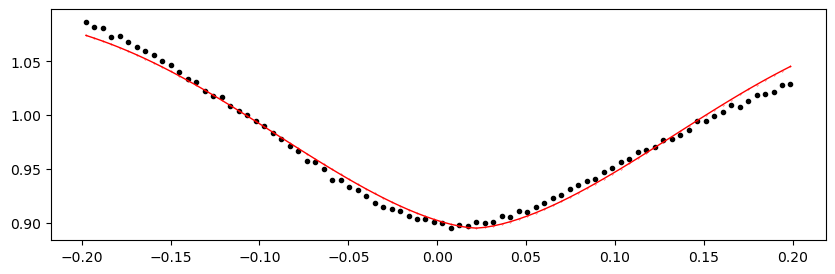

2122.6367684 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.12it/s]


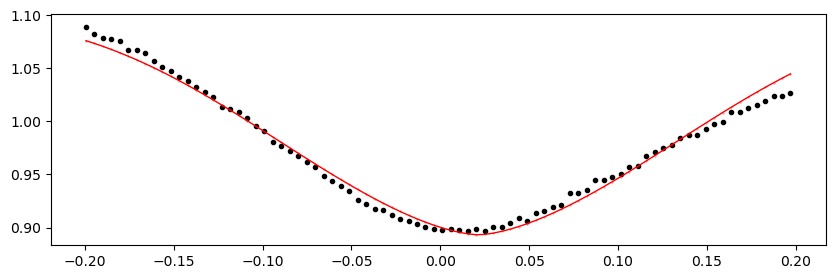

2122.9275471 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.91it/s]


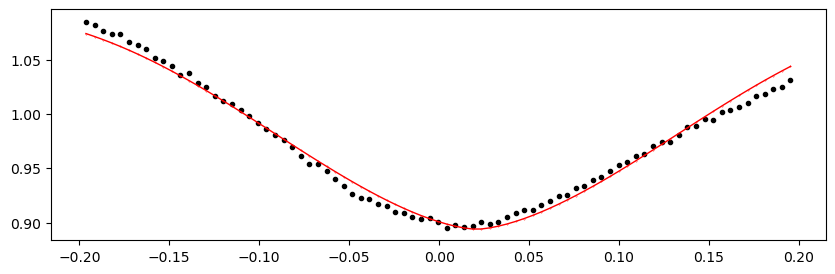

2123.2183258 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.51it/s]


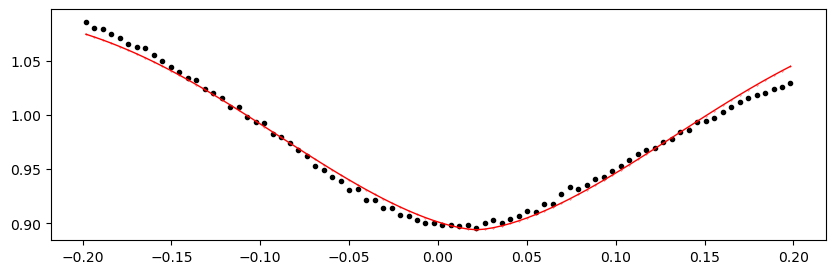

2123.5091045 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.96it/s]


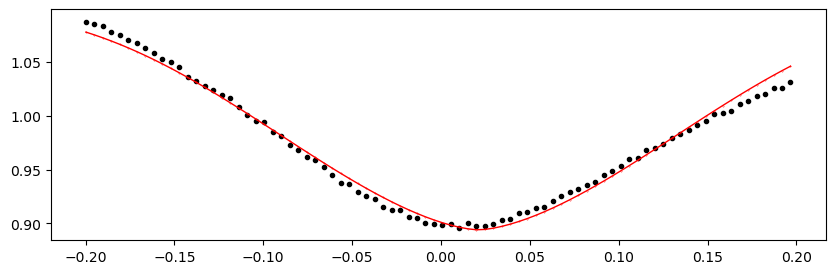

2123.7998832000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.77it/s]


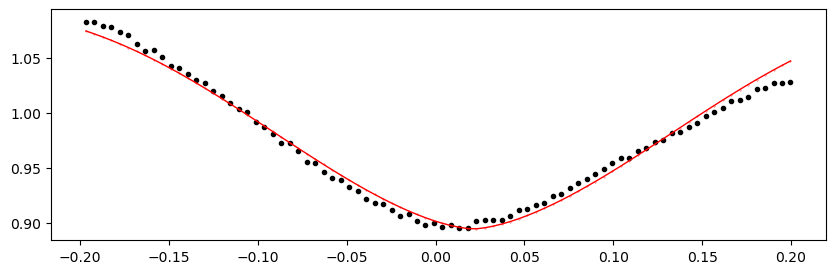

2124.0906619 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.75it/s]


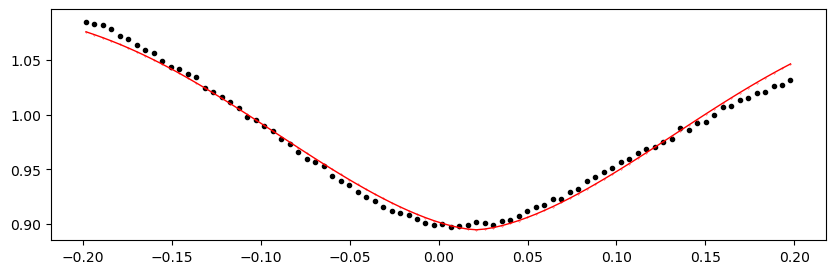

2124.3814406 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.03it/s]


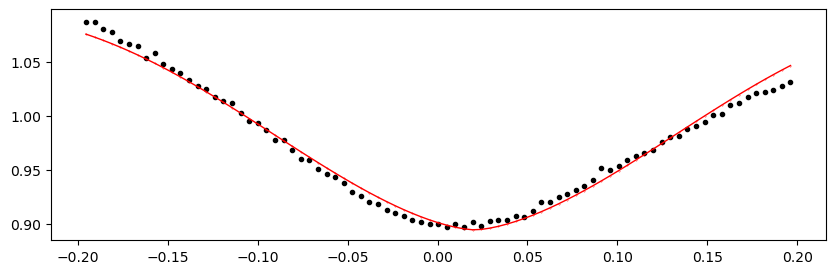

2124.6722193 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.51it/s]


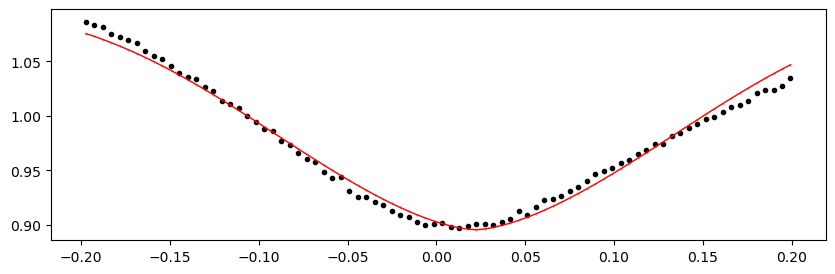

2124.962998 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.45it/s]


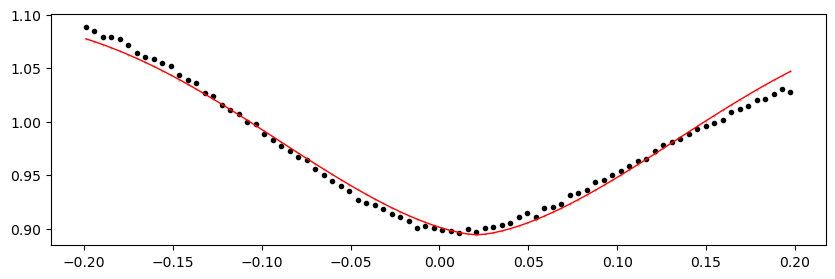

2125.2537767 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.93it/s]


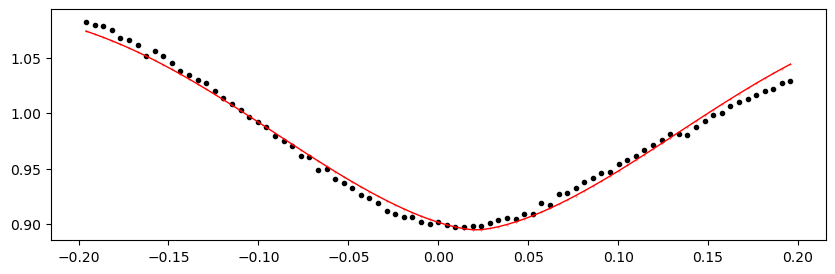

2125.5445554 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.14it/s]


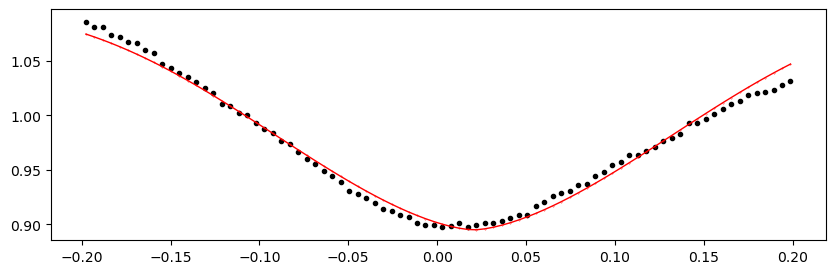

2125.8353341 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.27it/s]


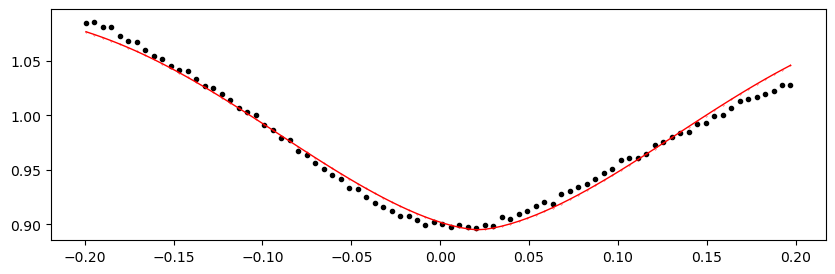

2126.1261128 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.52it/s]


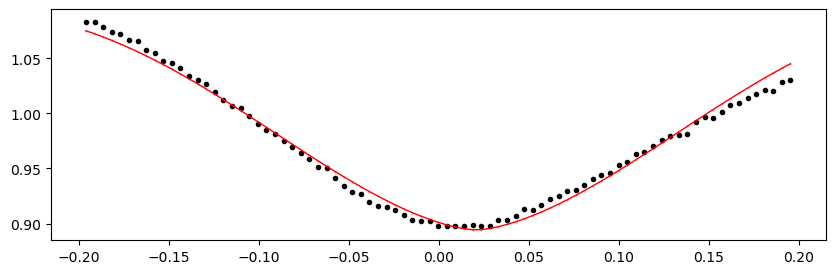

2130.1970146000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.42it/s]


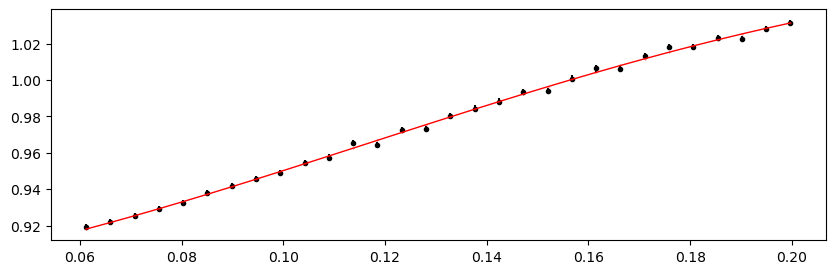

2130.4877933 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.60it/s]


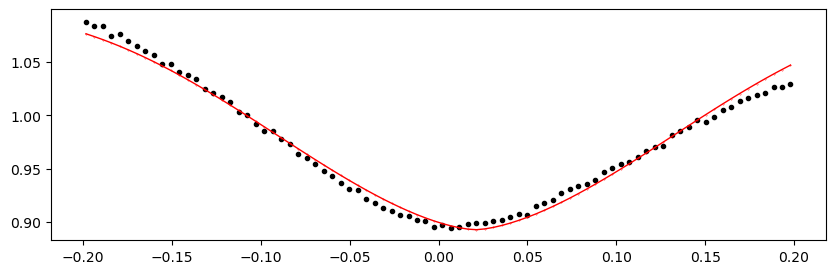

2130.778572 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.24it/s]


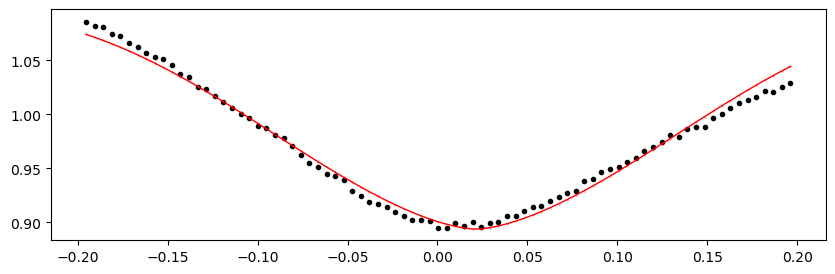

2131.0693507 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.27it/s]


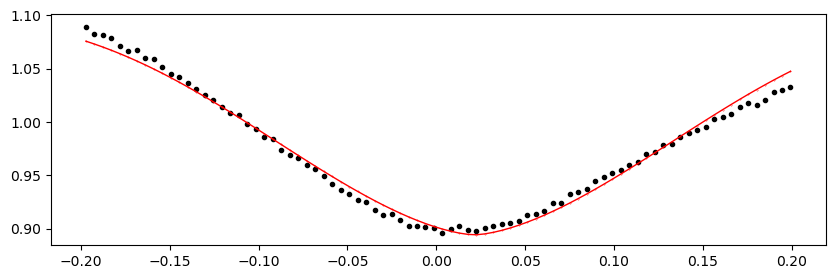

2131.3601294 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.47it/s]


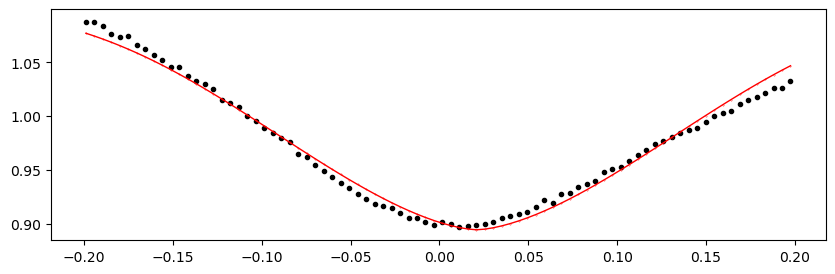

2131.6509081 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.41it/s]


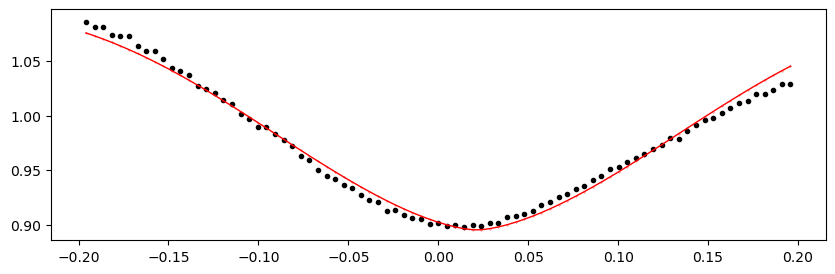

2131.9416868 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.18it/s]


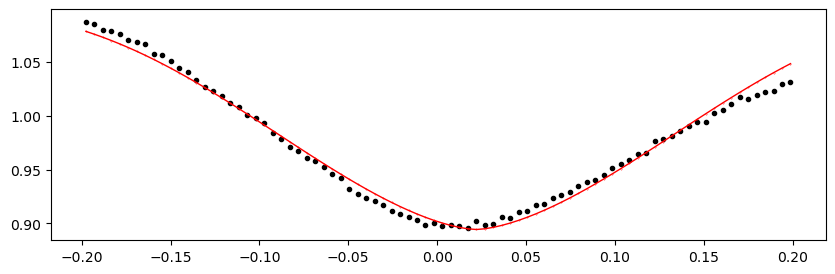

2132.2324655 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.56it/s]


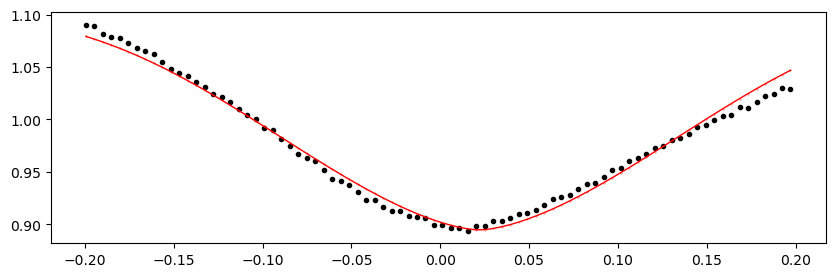

2132.5232442 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.37it/s]


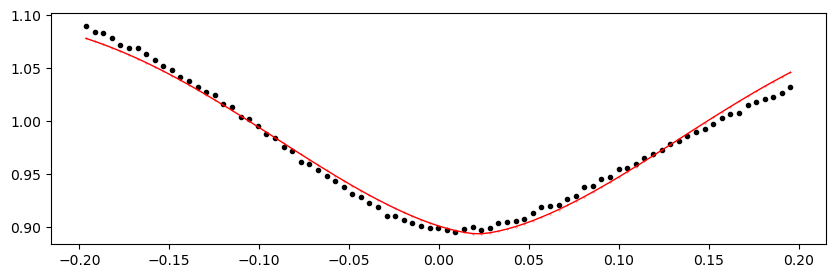

2132.8140229 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.20it/s]


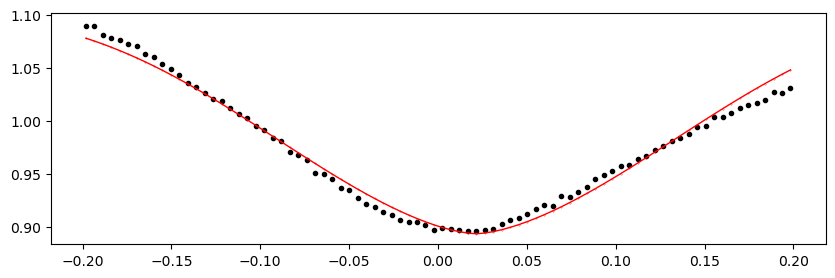

2133.1048016 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.05it/s]


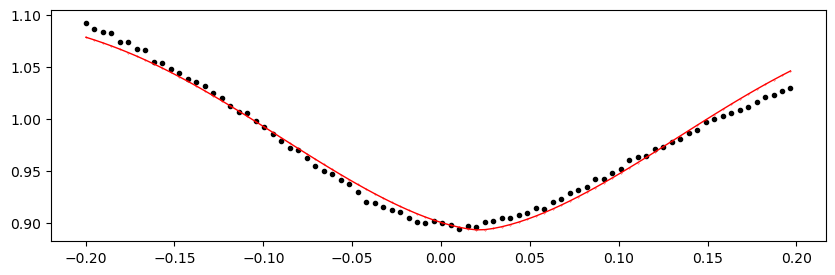

2133.3955803 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.49it/s]


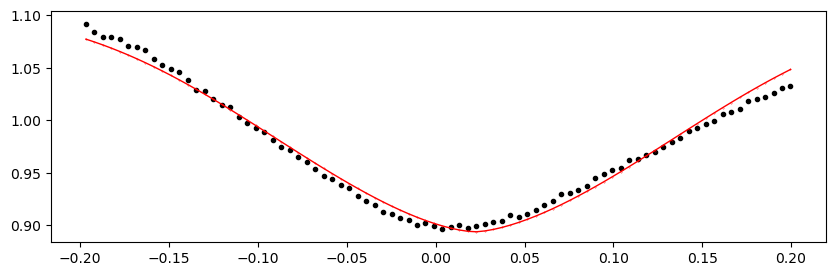

2133.6863590000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.49it/s]


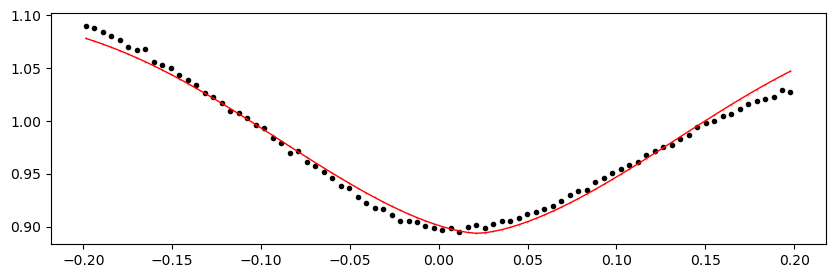

2133.9771377 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.93it/s]


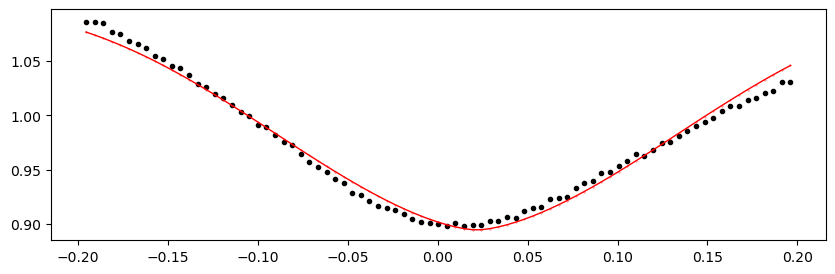

2134.2679164 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.42it/s]


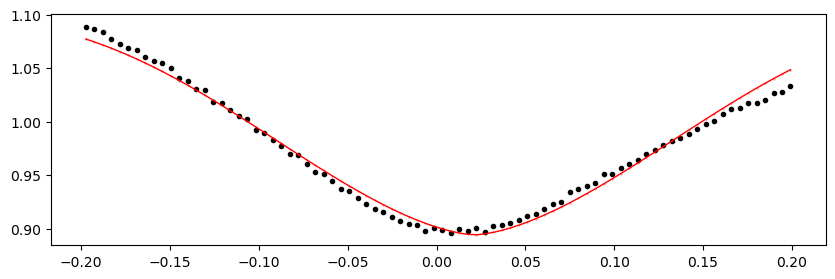

2134.5586951 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.72it/s]


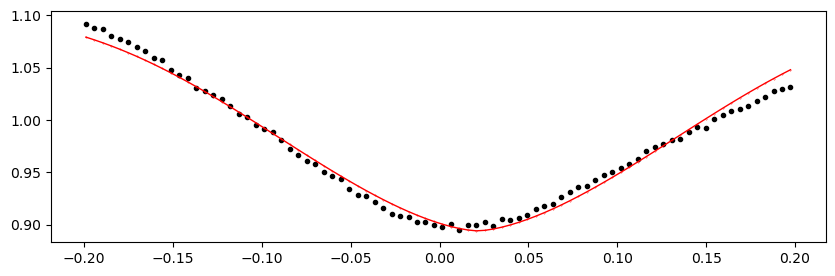

2134.8494738 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.12it/s]


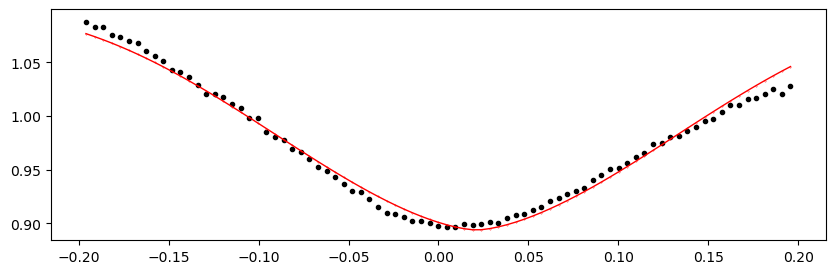

2135.1402525000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.30it/s]


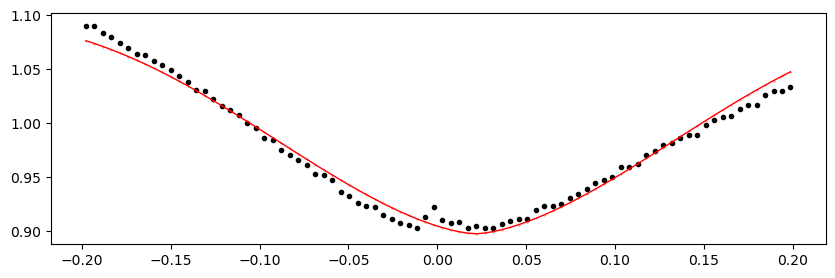

2135.4310312 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.44it/s]


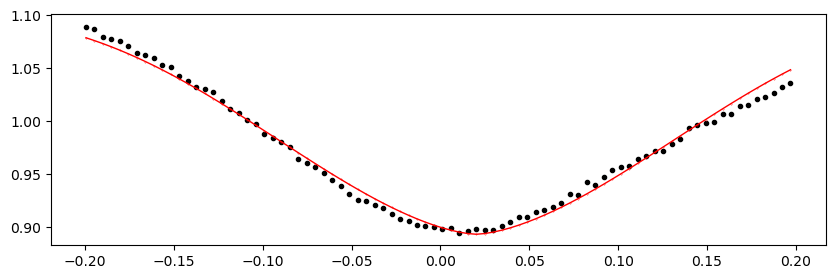

2135.7218099 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.77it/s]


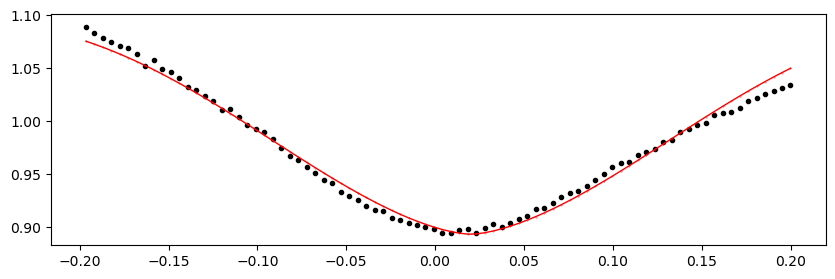

2136.0125886 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.07it/s]


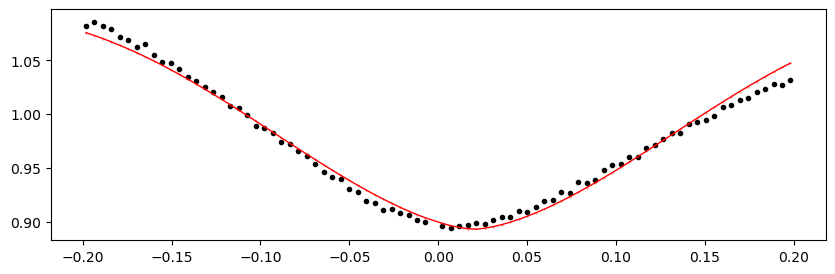

2136.3033673 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.57it/s]


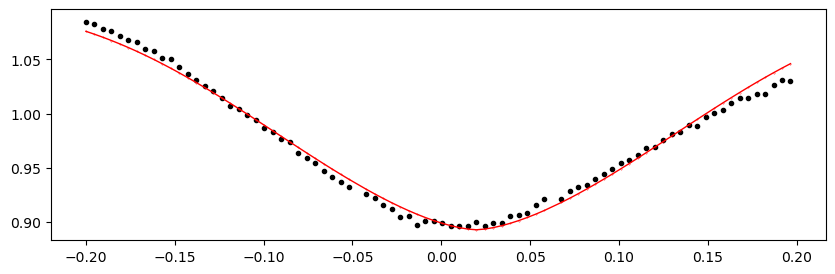

2136.594146 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.25it/s]


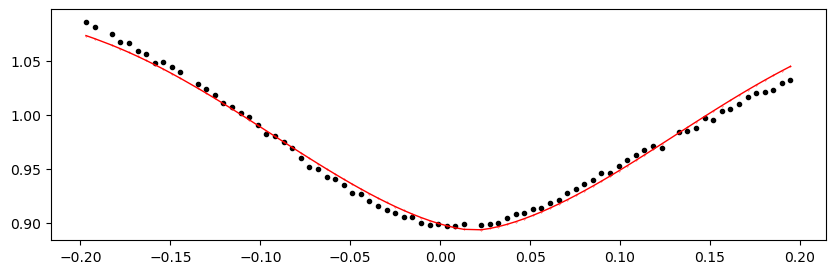

2136.8849247 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.27it/s]


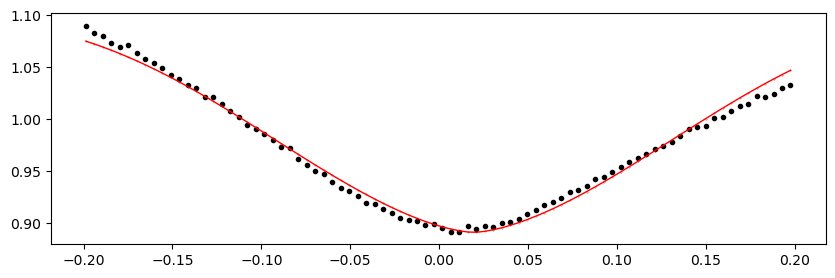

2137.1757034 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.28it/s]


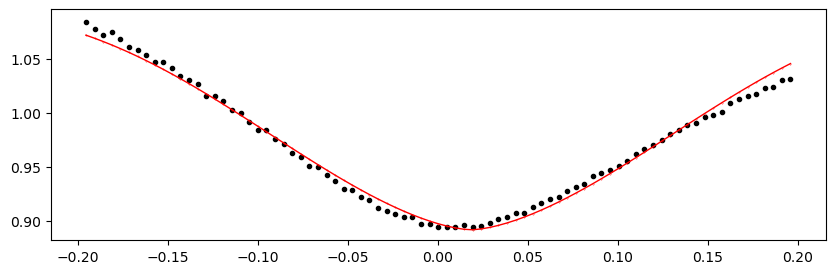

2137.4664821 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.65it/s]


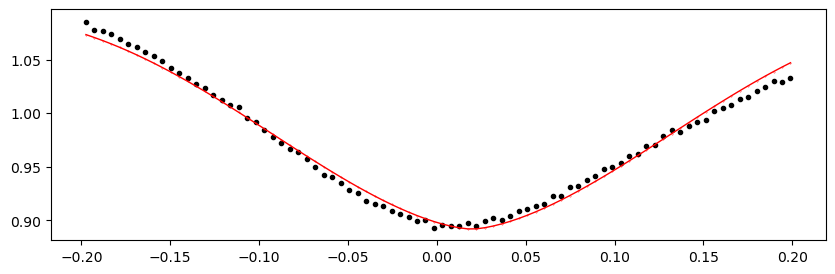

2137.7572608 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.95it/s]


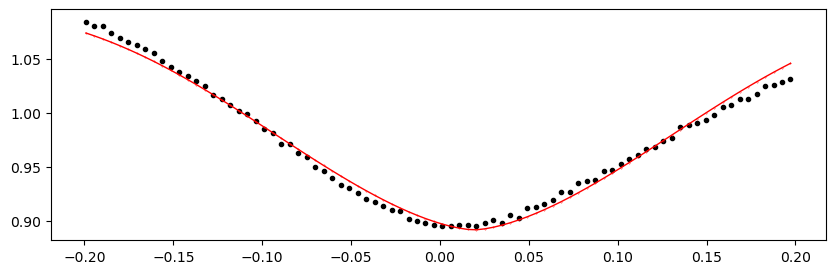

2138.0480395 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.14it/s]


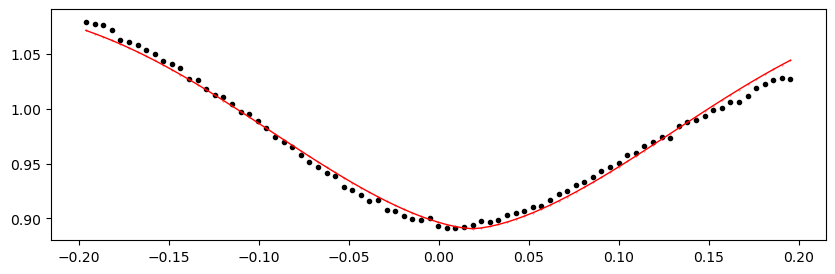

2138.3388182 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.13it/s]


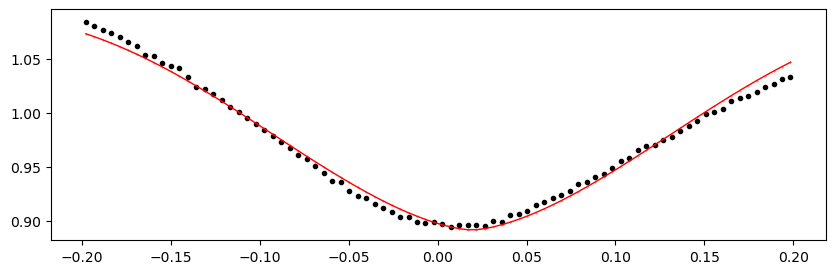

2138.6295969000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.63it/s]


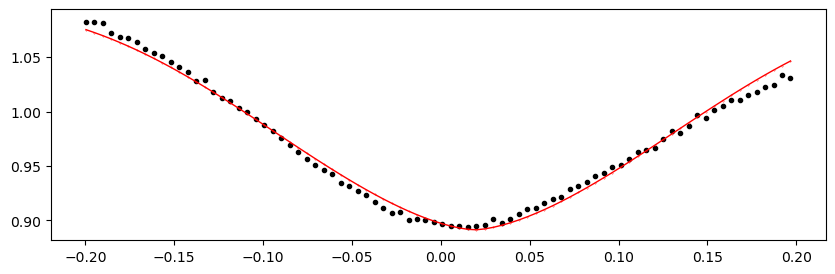

2138.9203756 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.89it/s]


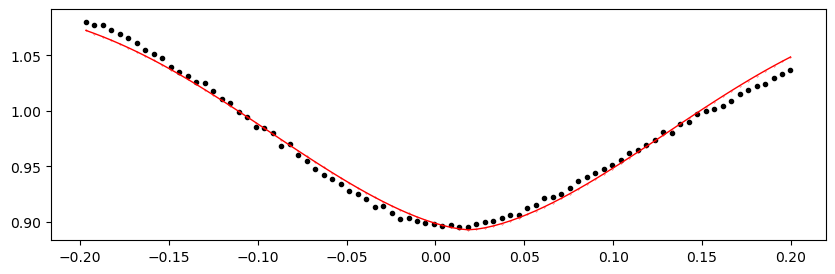

2139.2111543 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.15it/s]


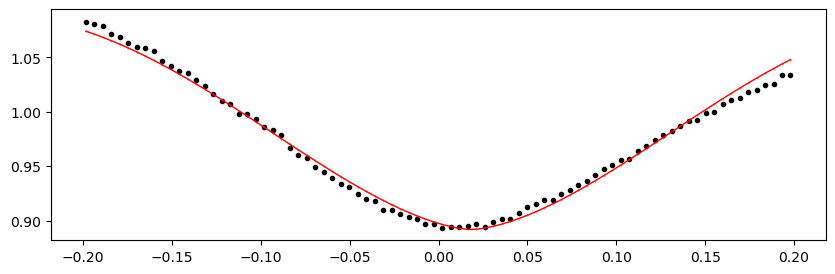

2139.501933 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.63it/s]


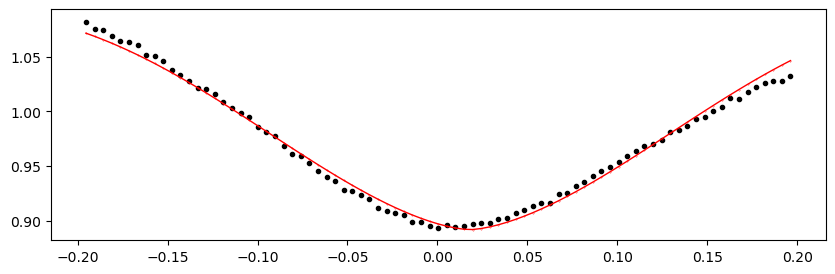

2139.7927117 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.41it/s]


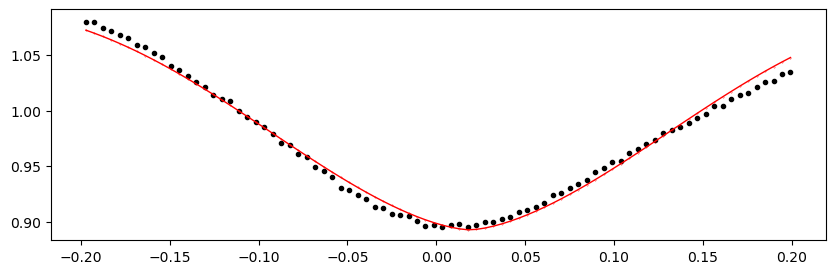

2140.0834904000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.77it/s]


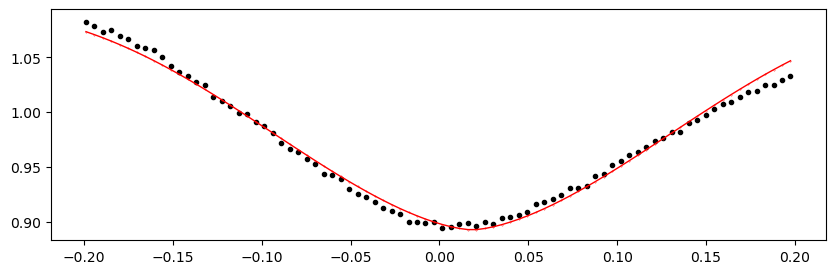

2140.3742691 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.55it/s]


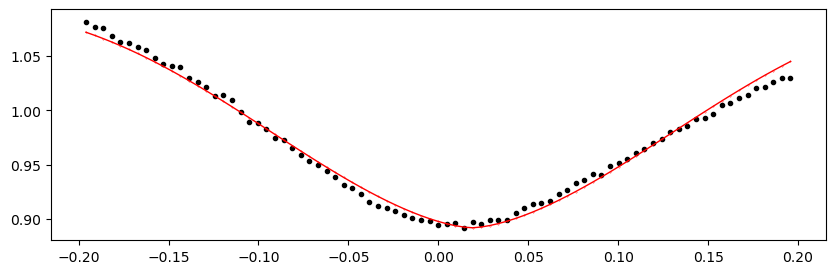

2140.6650478 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.34it/s]


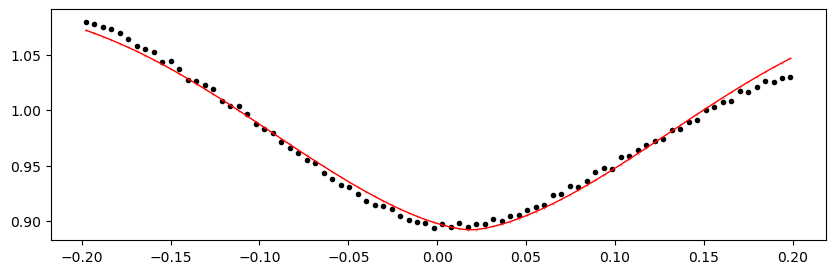

2140.9558265 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.52it/s]


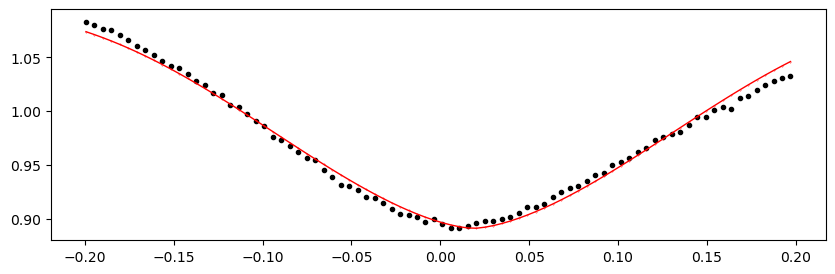

2141.2466052 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.13it/s]


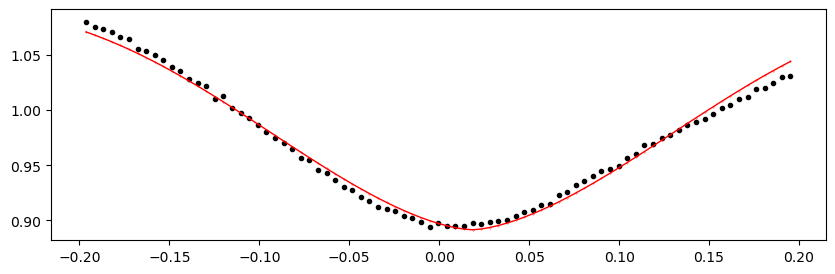

2141.5373839 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.13it/s]


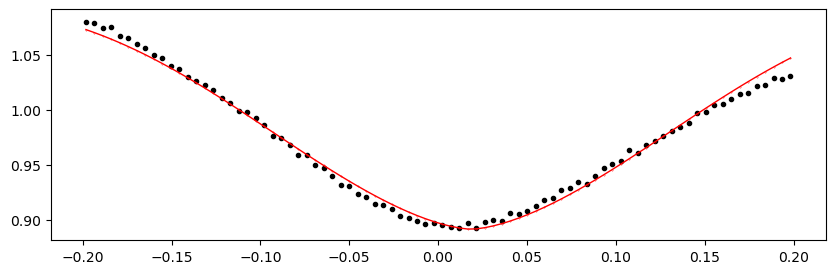

2141.8281626 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.80it/s]


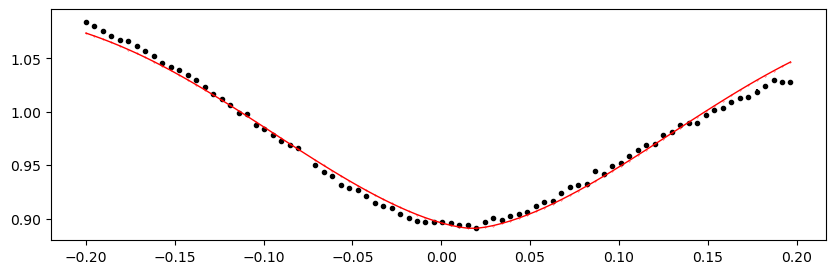

2447.727355 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.00it/s]


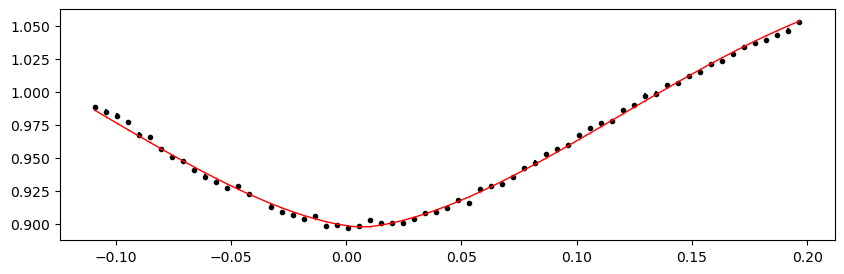

2448.0181337000004 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.70it/s]


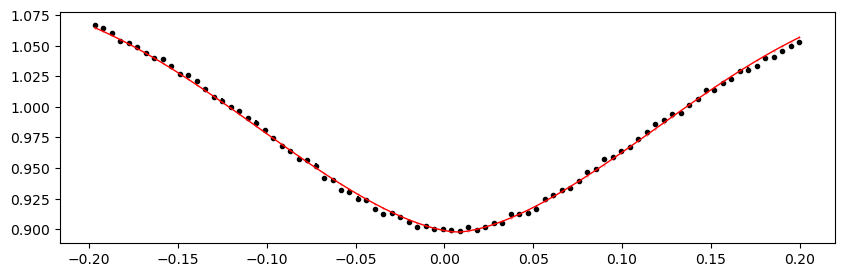

2448.3089124 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.10it/s]


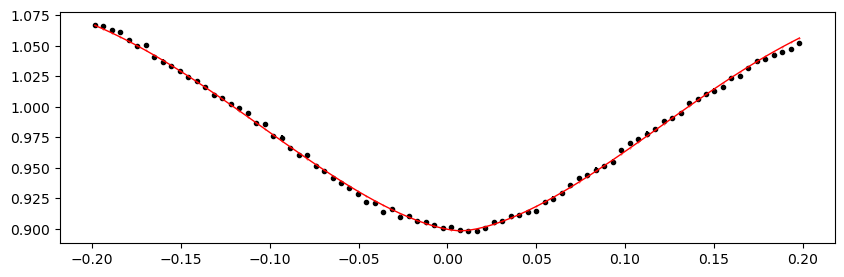

2448.5996911 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.82it/s]


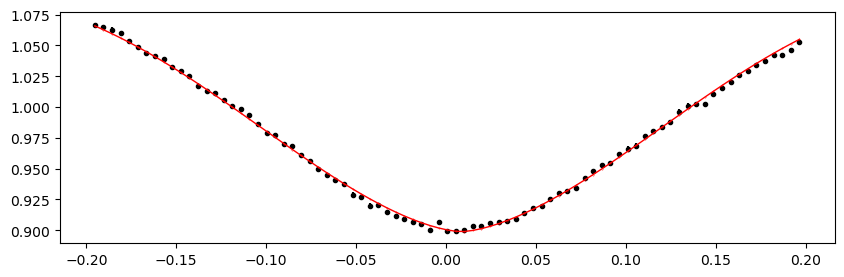

2448.8904698 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.73it/s]


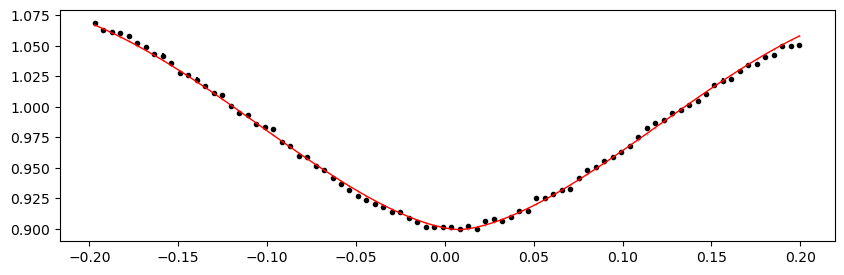

2449.1812485 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.73it/s]


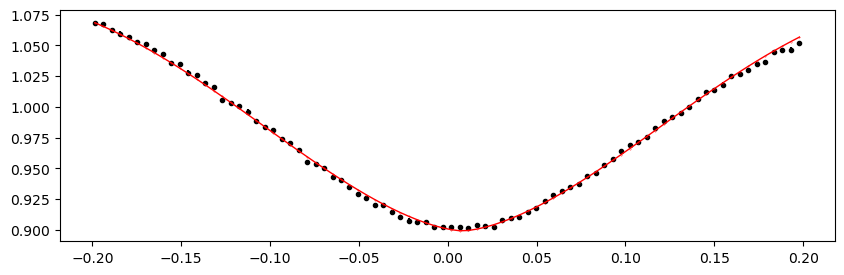

2449.4720272 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.83it/s]


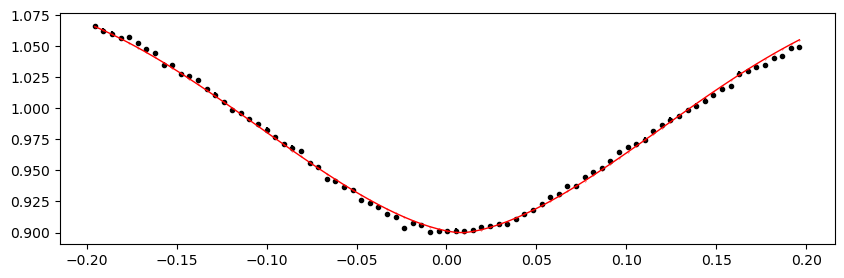

2449.7628059 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.42it/s]


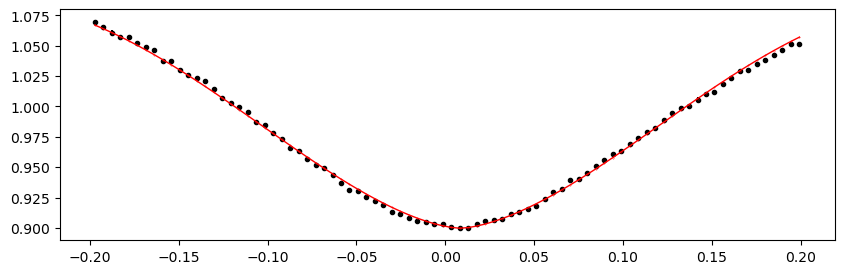

2450.0535846000002 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.50it/s]


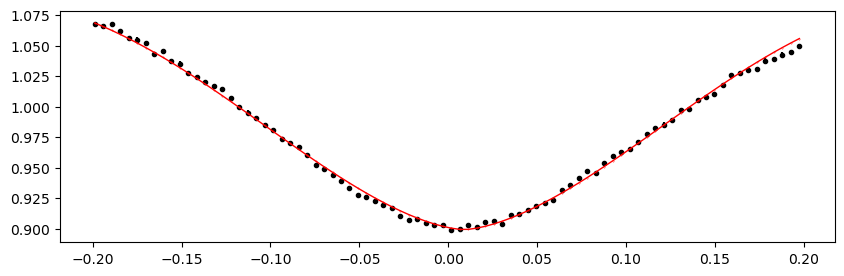

2450.3443632999997 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.01it/s]


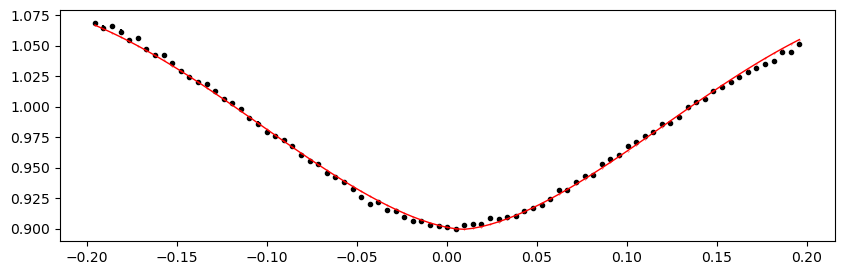

2450.635142 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.30it/s]


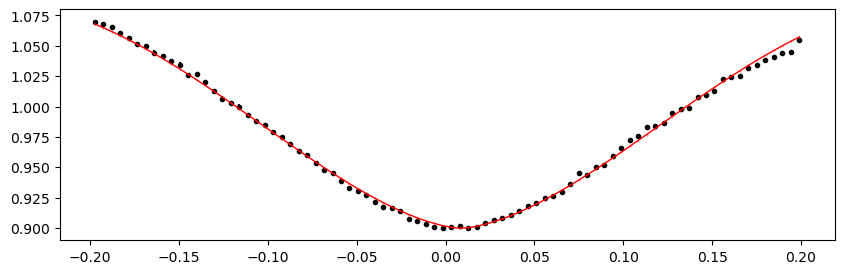

2450.9259207 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.78it/s]


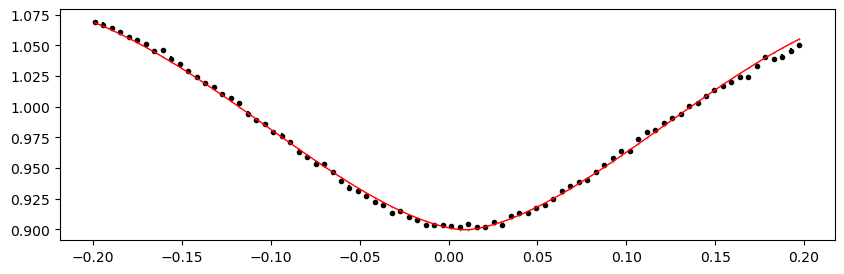

2451.2166994 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.44it/s]


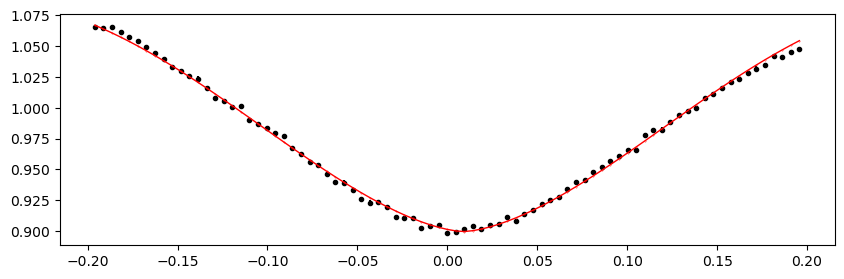

2451.5074781000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.61it/s]


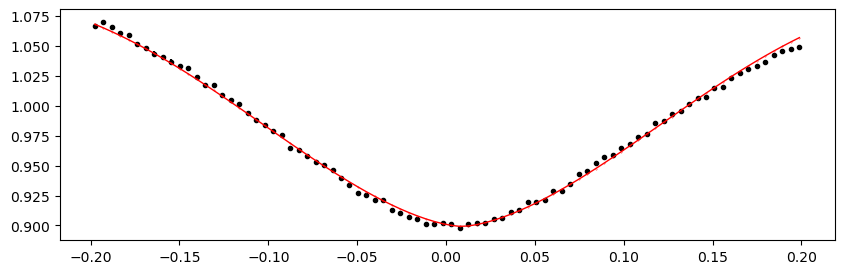

2451.7982567999998 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.65it/s]


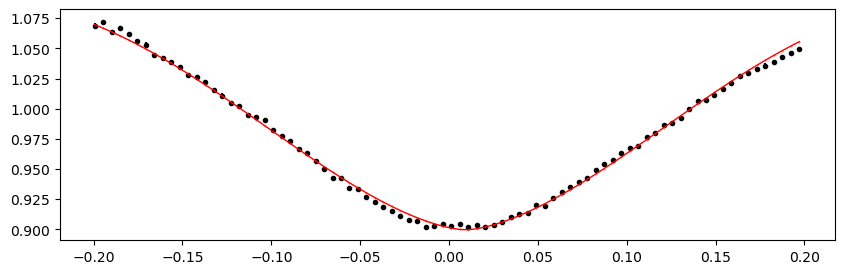

2452.0890355 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.42it/s]


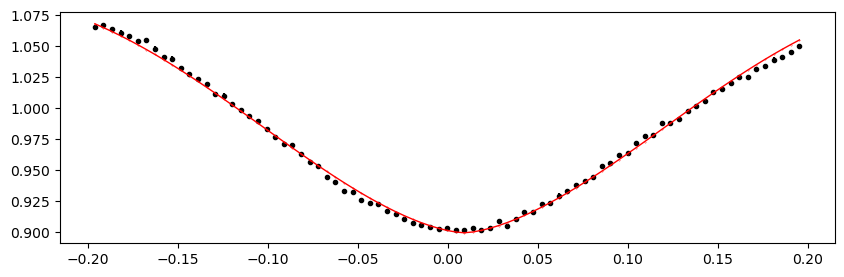

2452.3798142 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.33it/s]


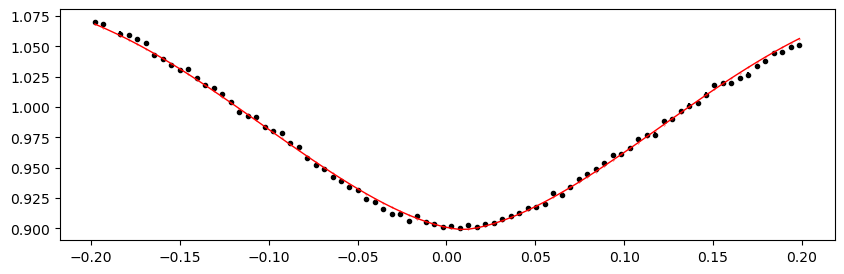

2452.6705929 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.91it/s]


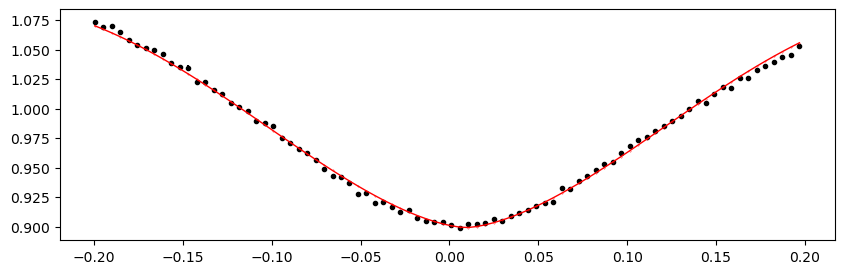

2452.9613716000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.48it/s]


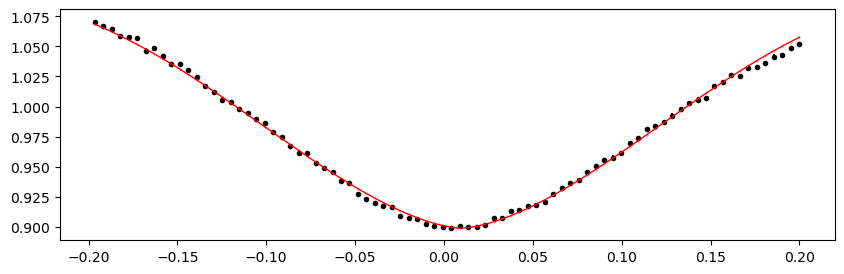

2453.2521503 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.63it/s]


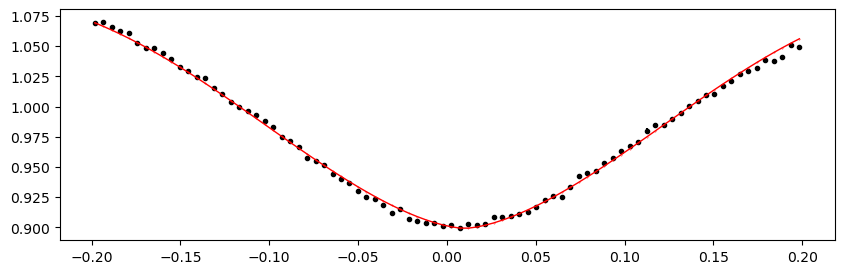

2453.542929 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.24it/s]


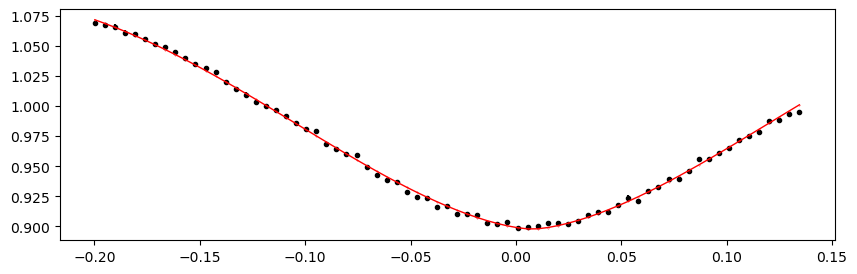

2461.3939539000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.72it/s]


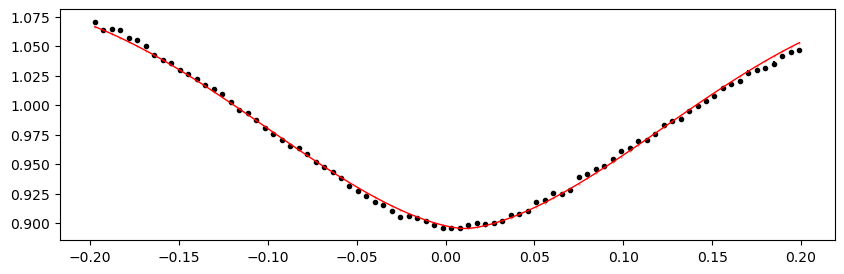

2461.6847325999997 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.90it/s]


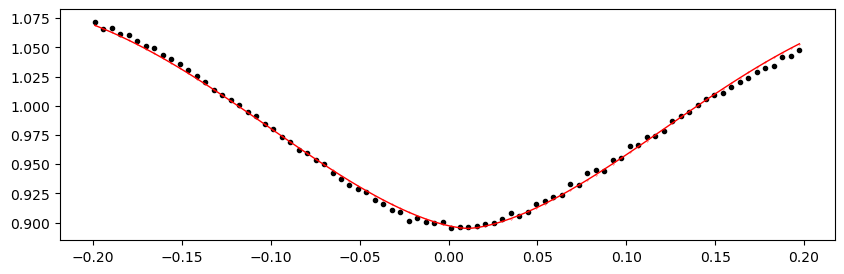

2461.9755113 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.73it/s]


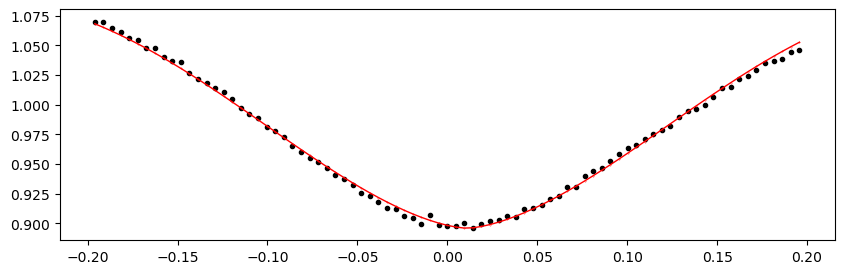

2462.26629 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.83it/s]


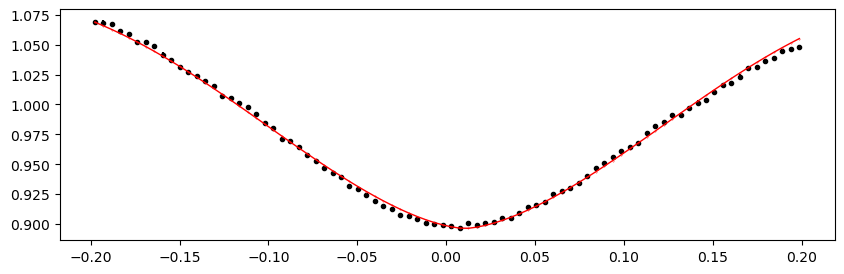

2462.5570687 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.46it/s]


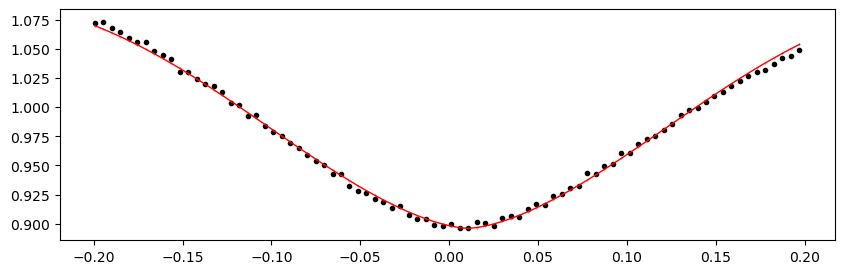

2462.8478474000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.32it/s]


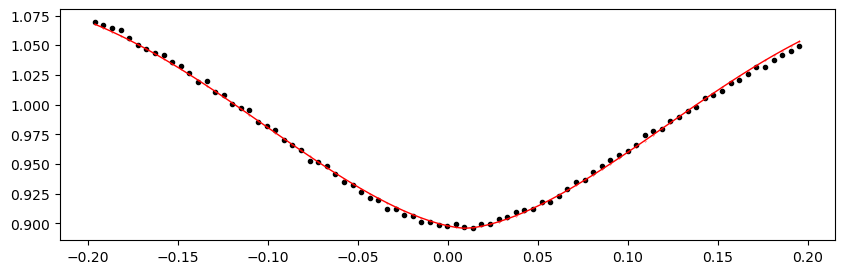

2463.1386261 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.91it/s]


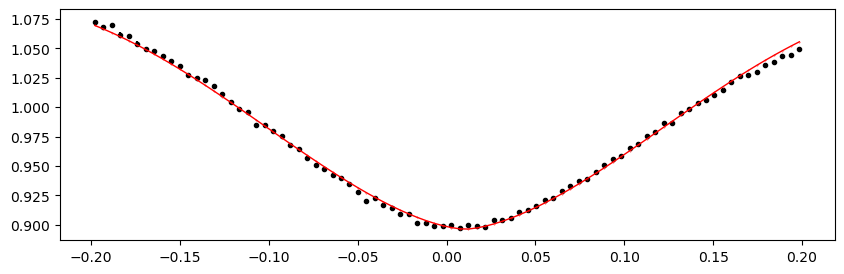

2463.4294048 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.55it/s]


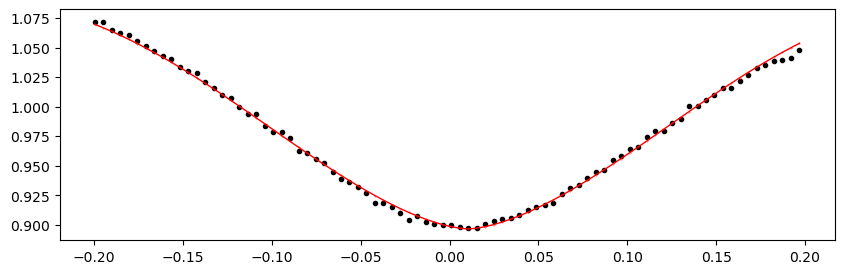

2463.7201835 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.25it/s]


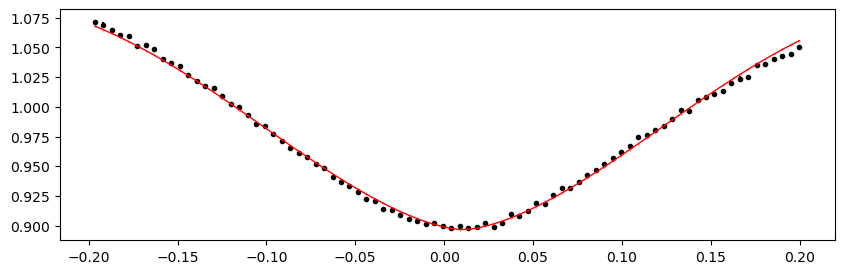

2464.0109622 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.43it/s]


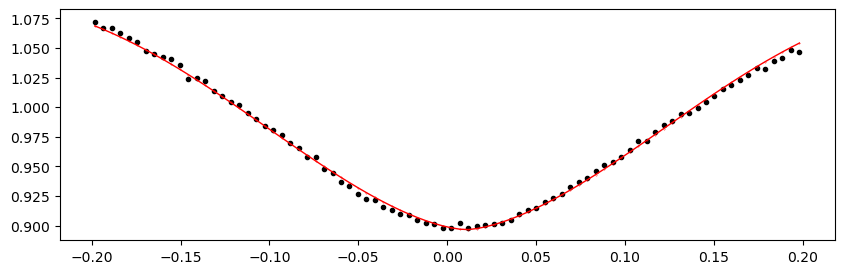

2464.3017409000004 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.87it/s]


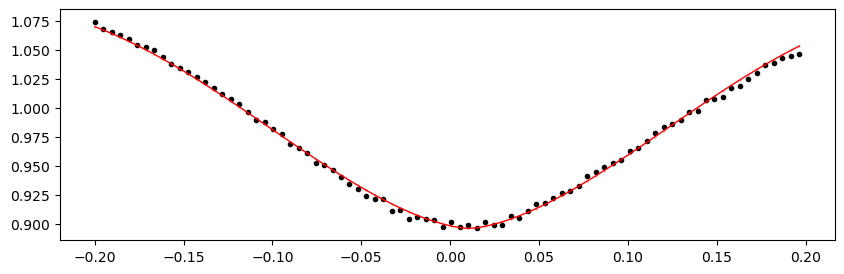

2464.5925196 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.41it/s]


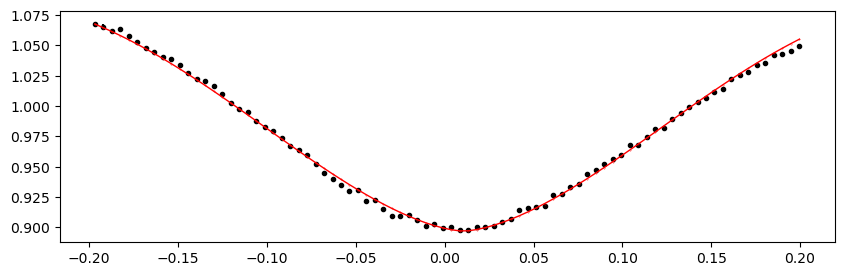

2464.8832983 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.09it/s]


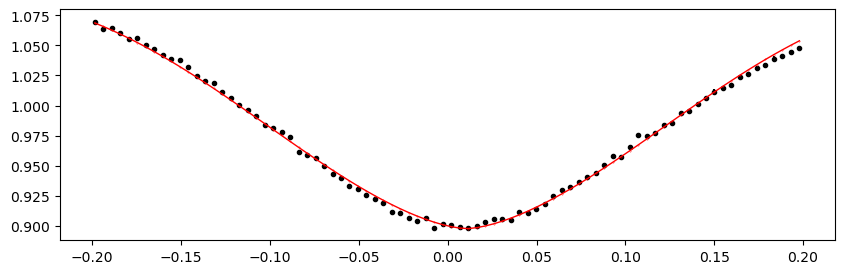

2465.174077 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.27it/s]


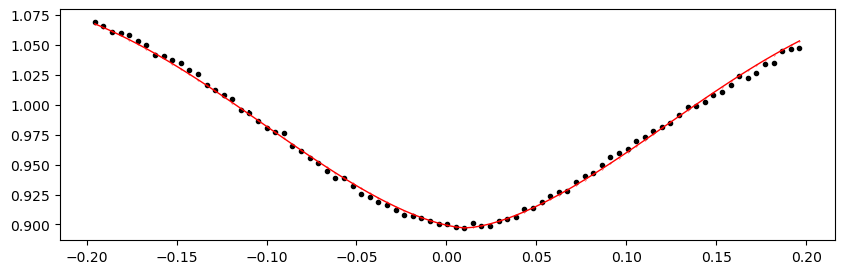

2465.4648557 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.08it/s]


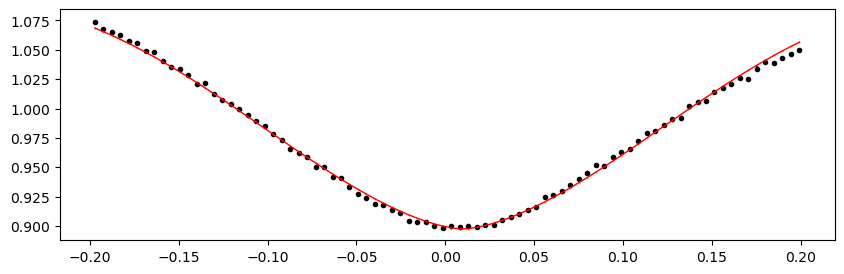

2465.7556344 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.70it/s]


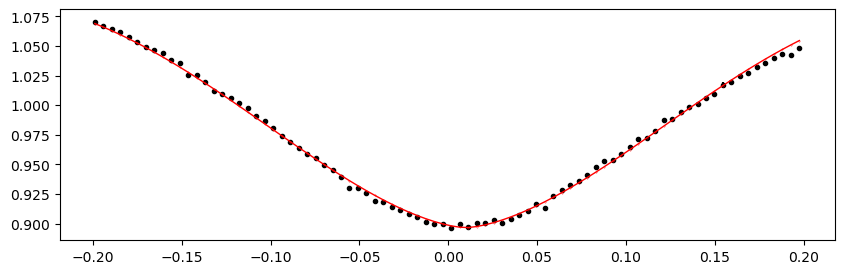

2466.0464131 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.15it/s]


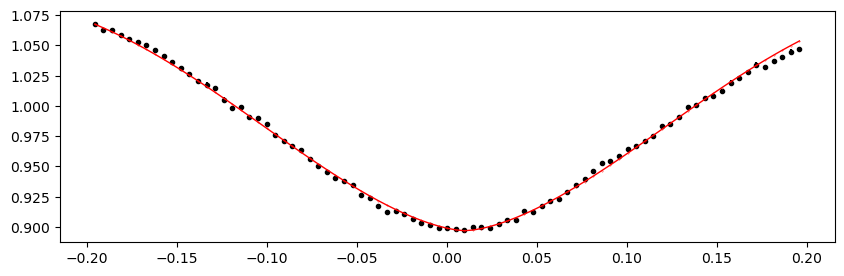

2466.3371918000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.36it/s]


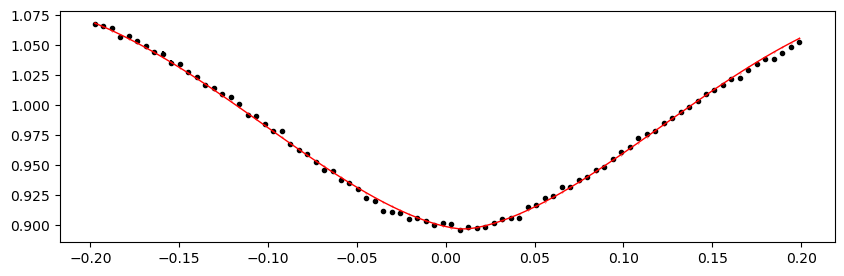

2466.6279704999997 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.80it/s]


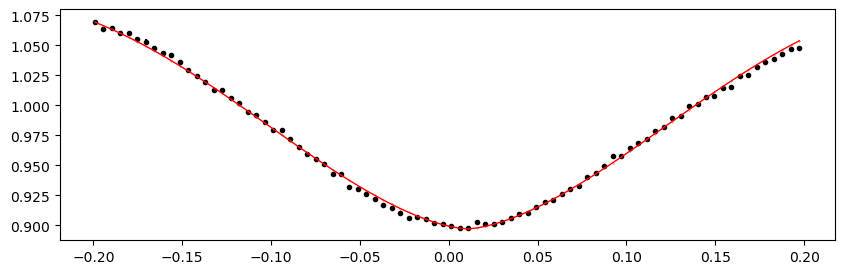

2466.9187492 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.00it/s]


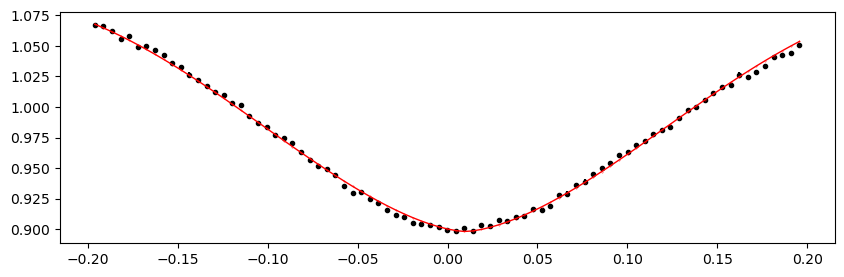

2467.2095279 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.00it/s]


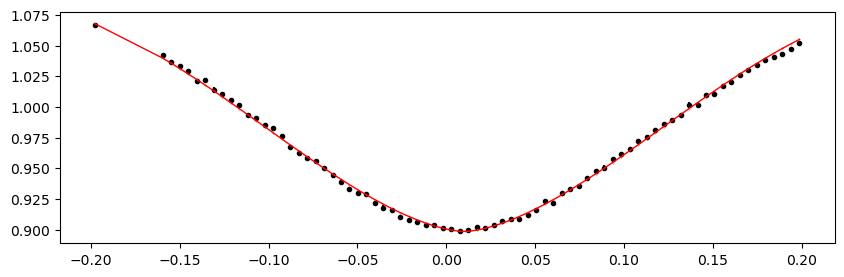

2467.5003066 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.76it/s]


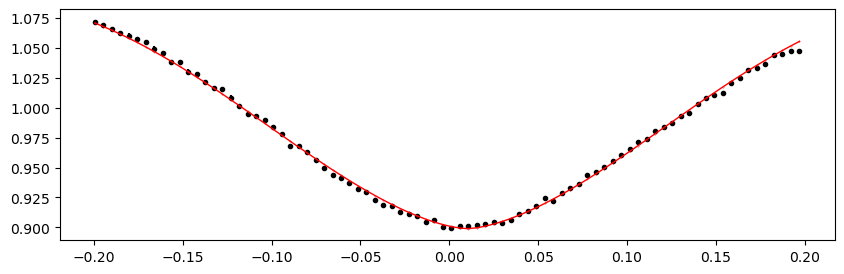

2467.7910853000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.18it/s]


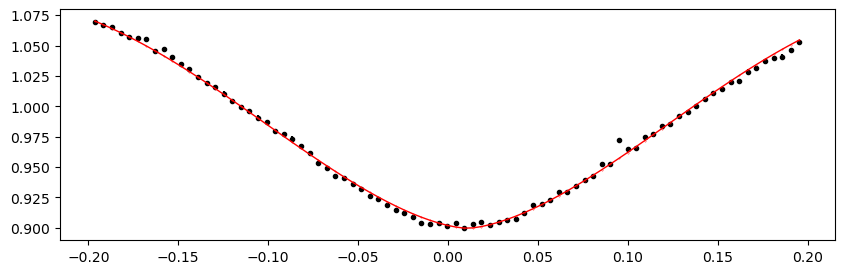

2468.0818639999998 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.01it/s]


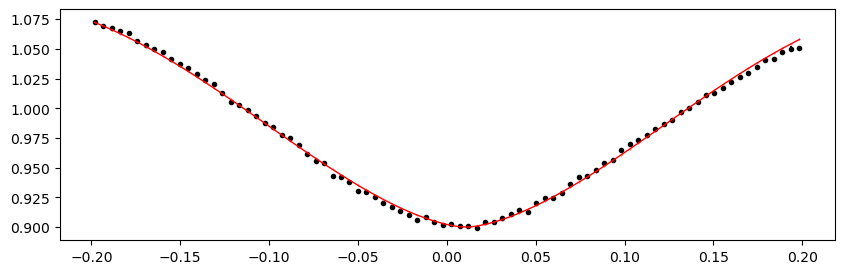

2468.3726427 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.10it/s]


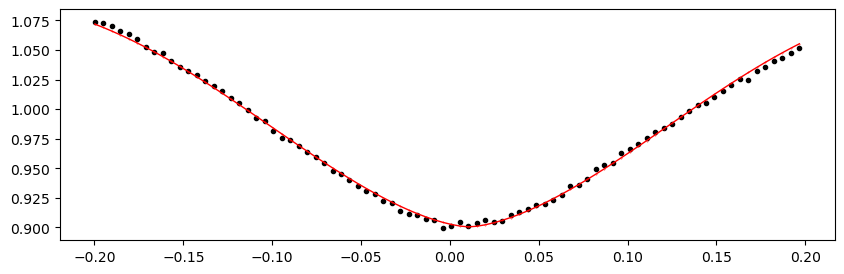

2468.6634214 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.24it/s]


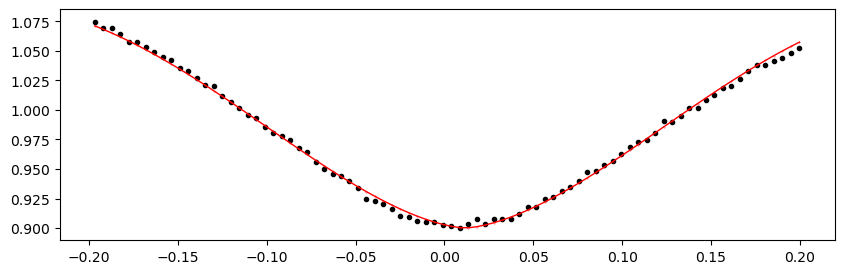

2468.9542001 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.07it/s]


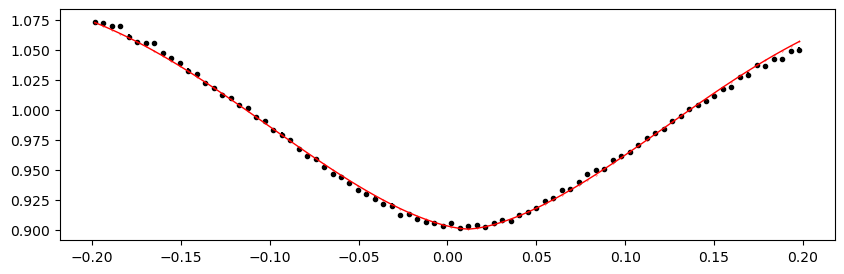

2469.2449788000004 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.65it/s]


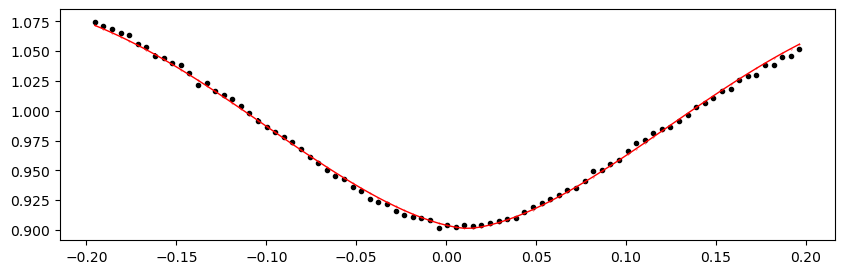

2469.5357575 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.71it/s]


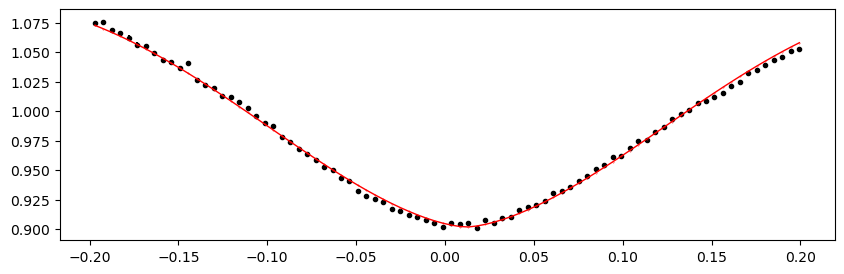

2469.8265362 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.60it/s]


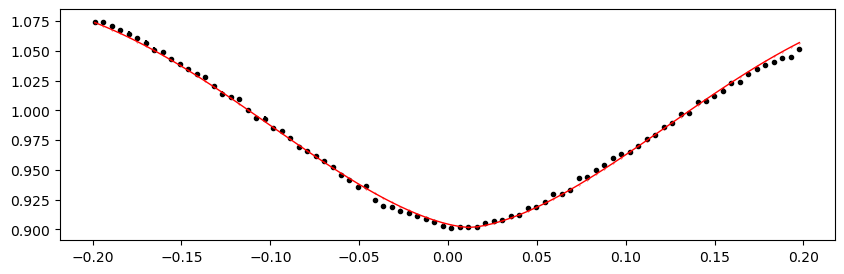

2470.1173149 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.53it/s]


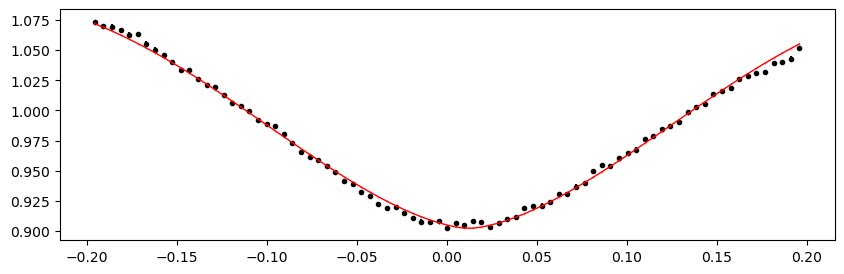

2470.4080936 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.20it/s]


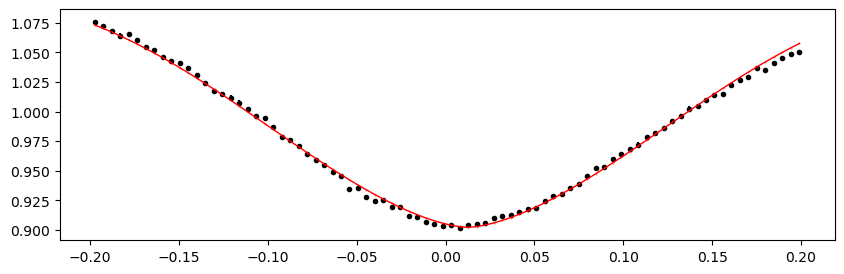

2474.4789954 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.34it/s]


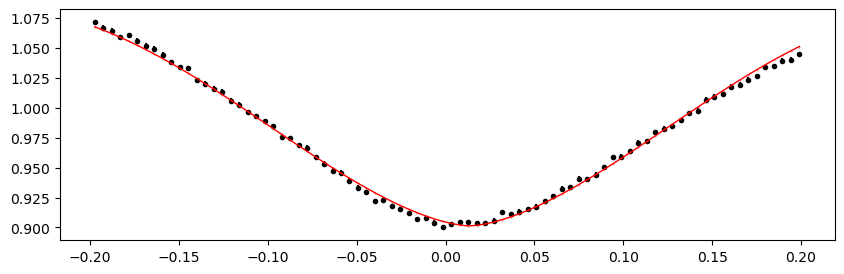

2474.7697741 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.09it/s]


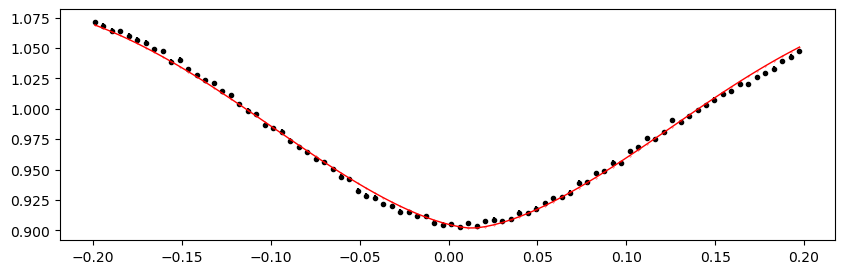

2475.0605528 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.48it/s]


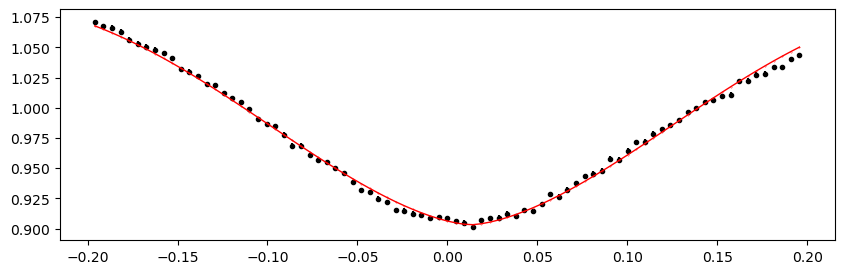

2475.3513315 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.68it/s]


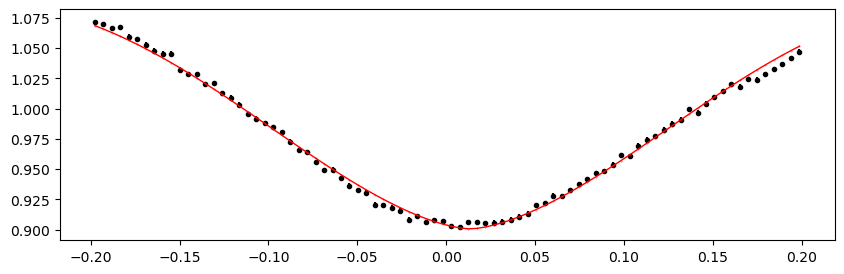

2475.6421102000004 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.27it/s]


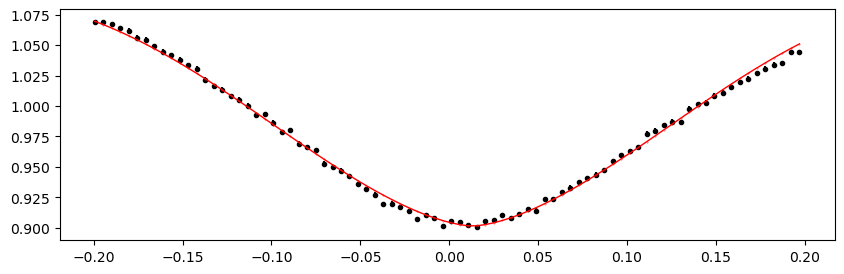

2475.9328889 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.90it/s]


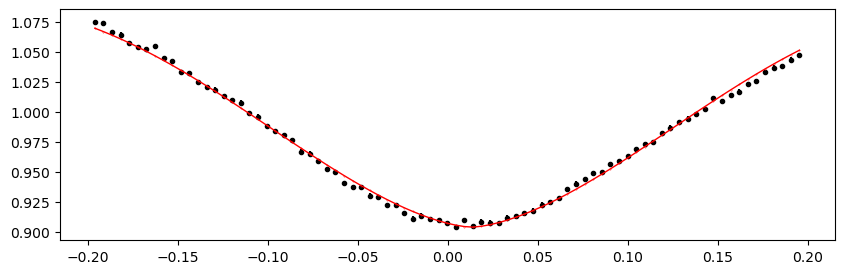

2476.2236676 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.20it/s]


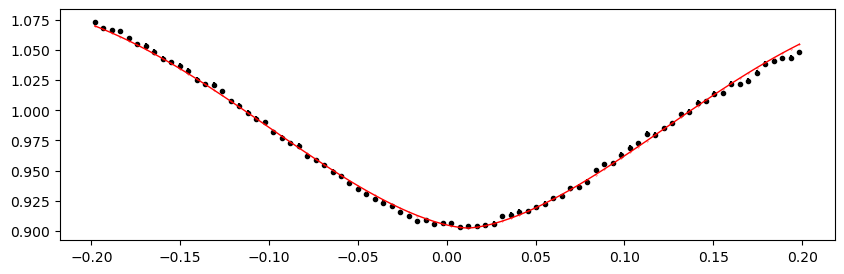

2476.5144463 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.73it/s]


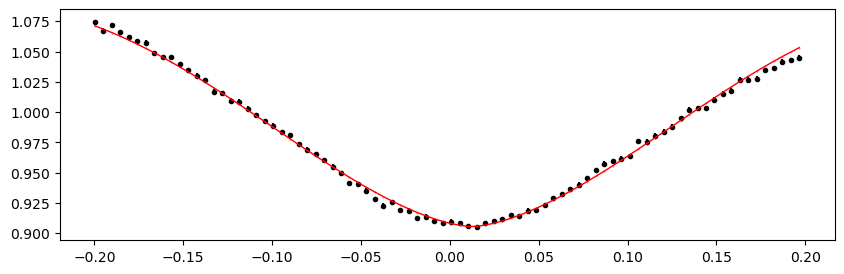

2476.805225 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.30it/s]


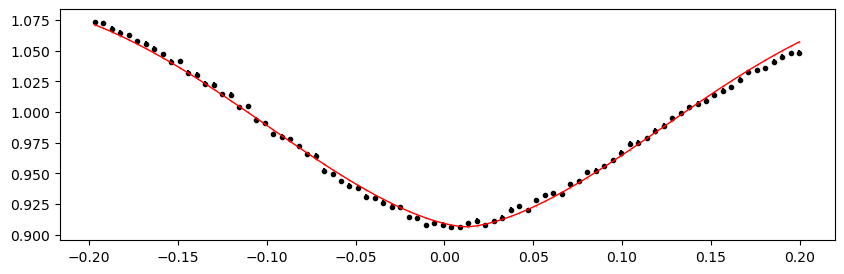

2477.0960037 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.06it/s]


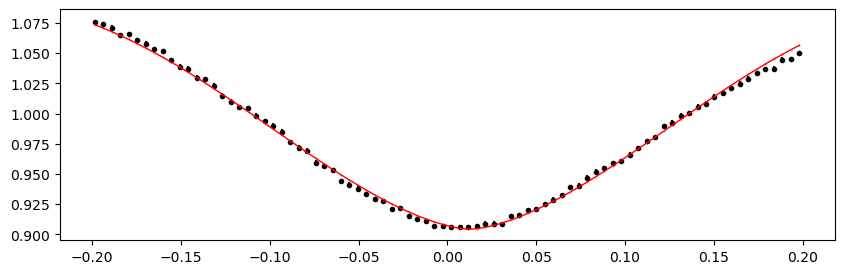

2477.3867824 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.93it/s]


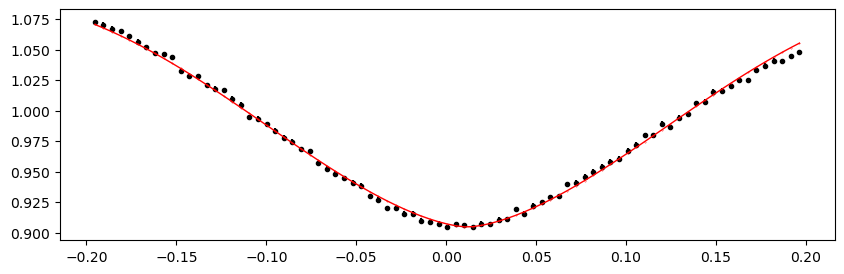

2477.6775611000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.17it/s]


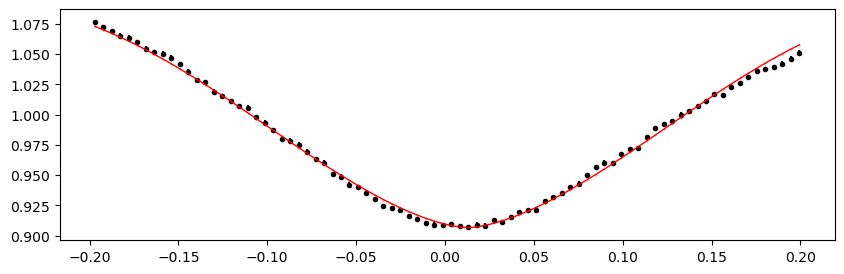

2477.9683397999997 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.42it/s]


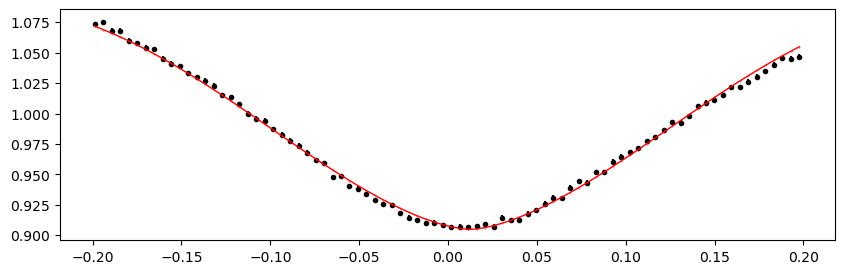

2478.2591185 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.16it/s]


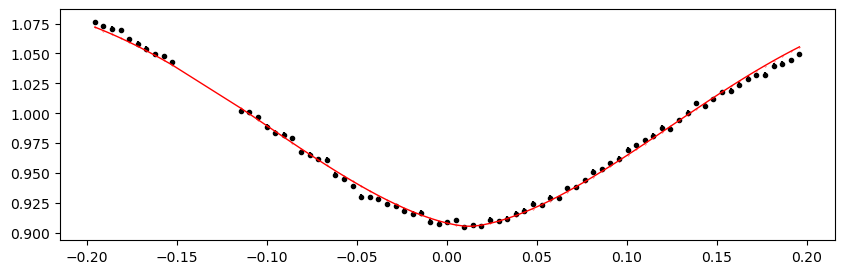

2478.5498972 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.37it/s]


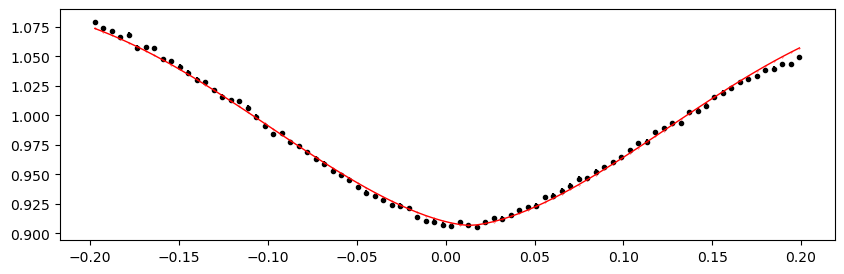

2478.8406759 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.53it/s]


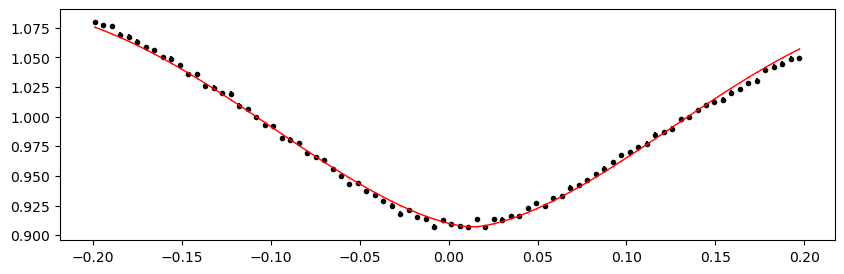

2479.1314546000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.18it/s]


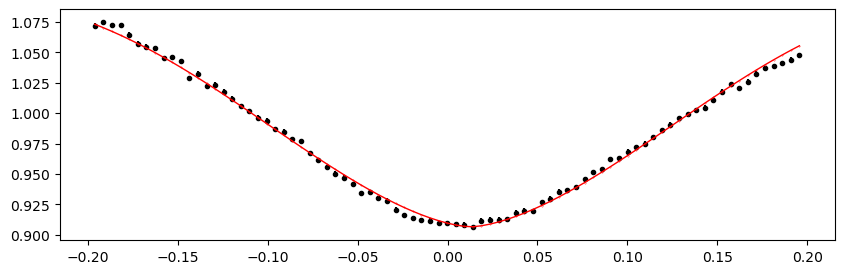

2479.4222333 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.07it/s]


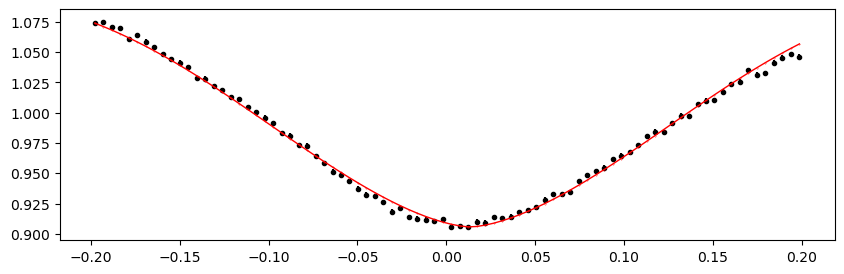

2479.713012 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.50it/s]


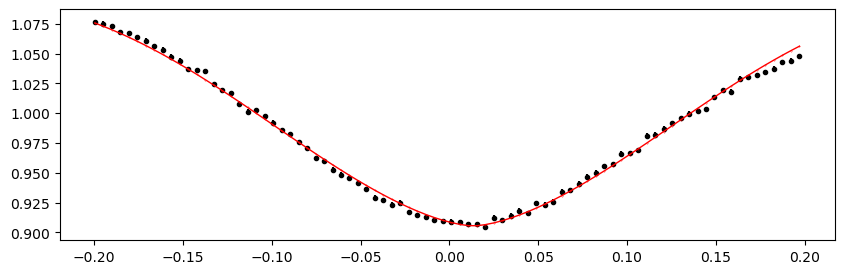

2480.0037907 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.79it/s]


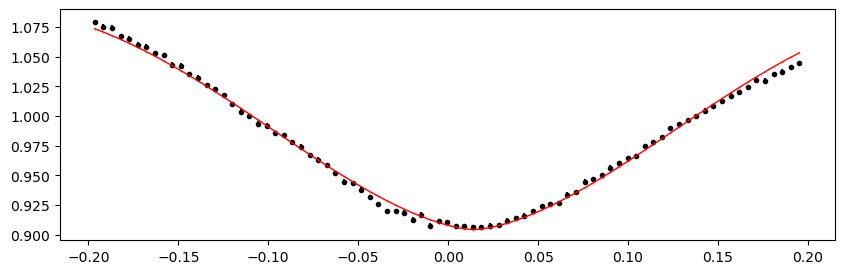

2480.2945694 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.63it/s]


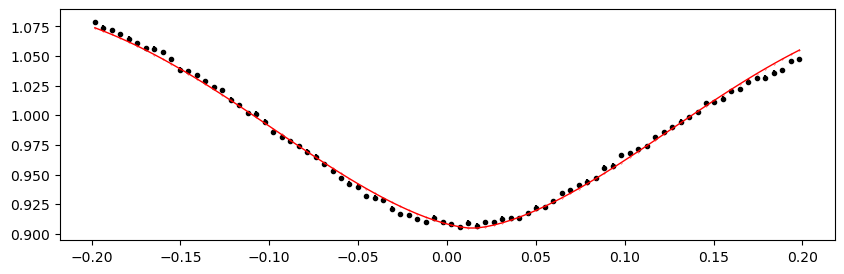

2480.5853481000004 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.07it/s]


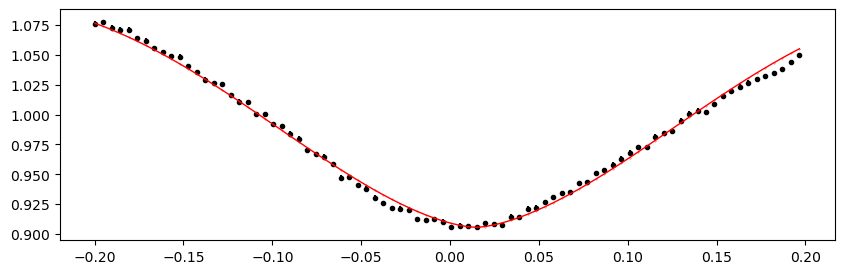

2480.8761268 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.40it/s]


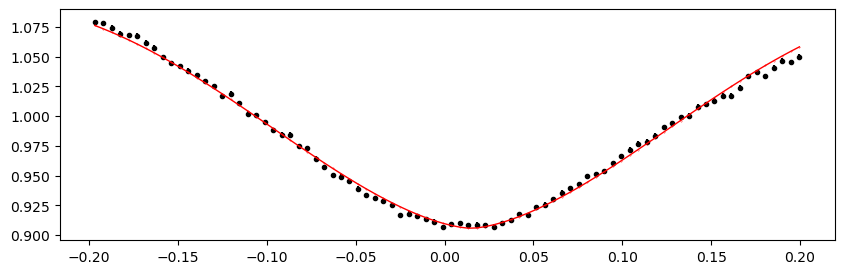

2481.1669055 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.18it/s]


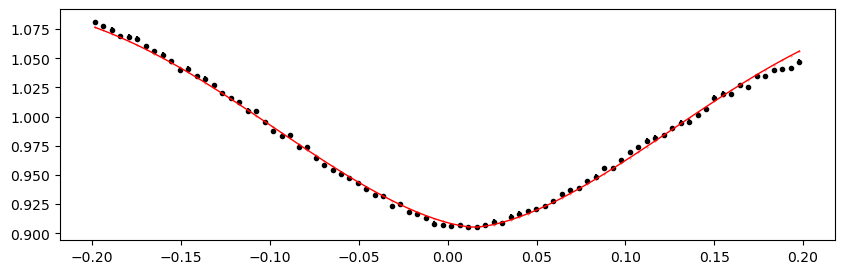

2481.4576842 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.61it/s]


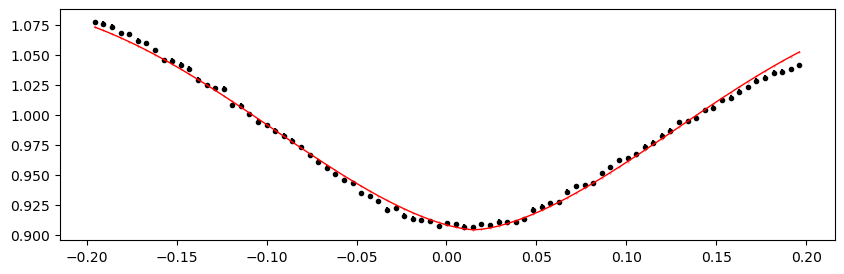

2481.7484629 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.09it/s]


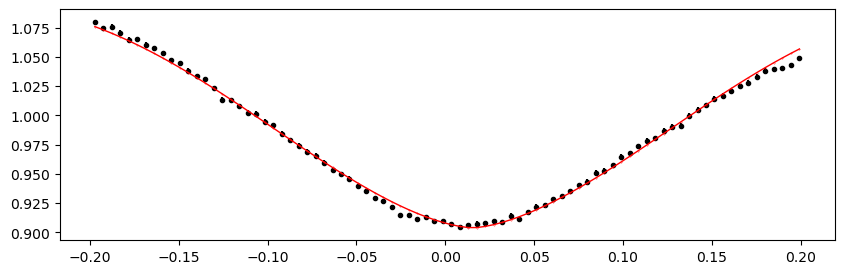

2482.0392416 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.55it/s]


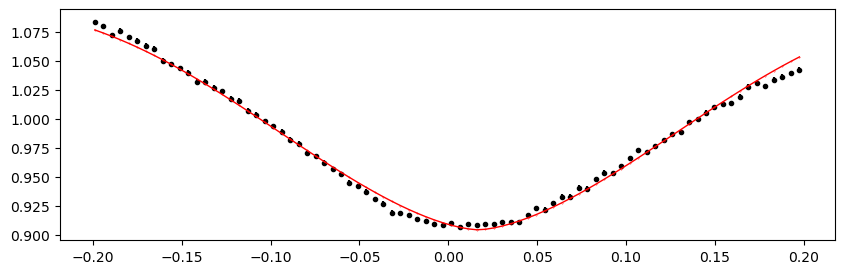

2487.2732582 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.93it/s]


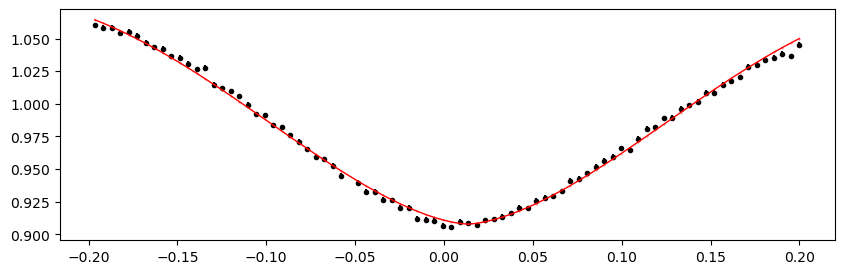

2487.5640369000002 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.87it/s]


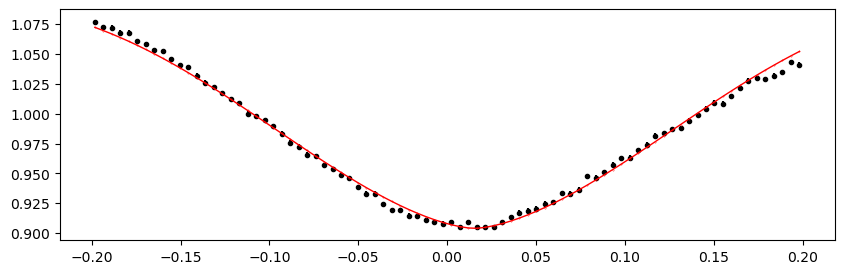

2487.8548155999997 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.64it/s]


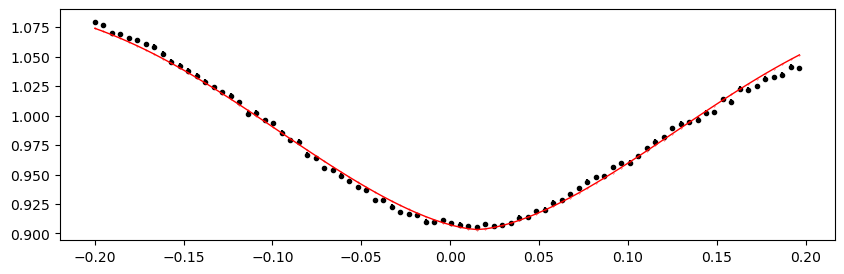

2488.1455943 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.20it/s]


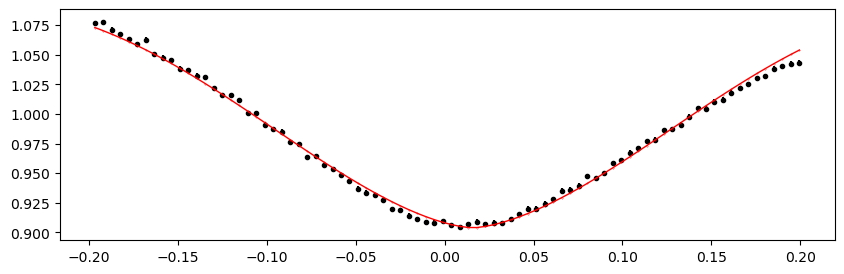

2488.436373 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.39it/s]


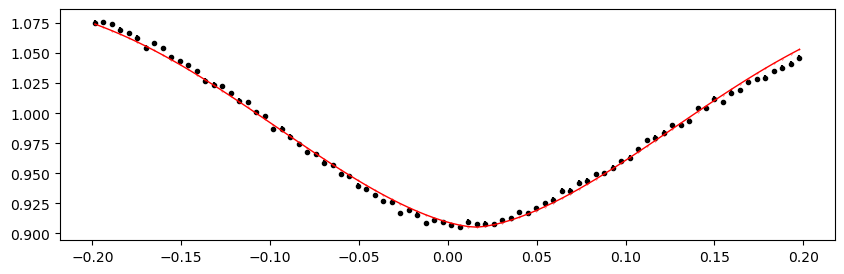

2488.7271517 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.09it/s]


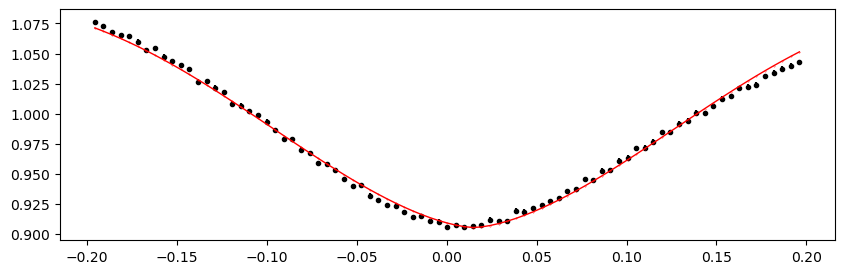

2489.0179304000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.60it/s]


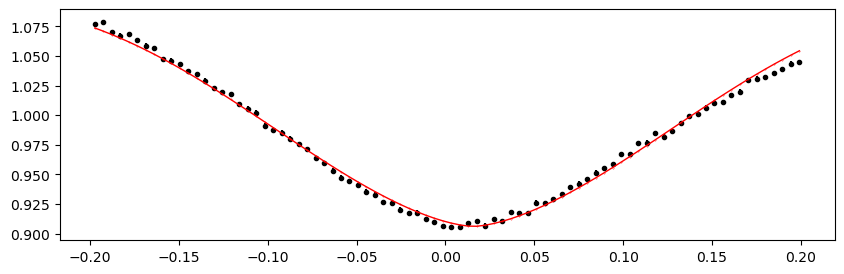

2489.3087090999998 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.92it/s]


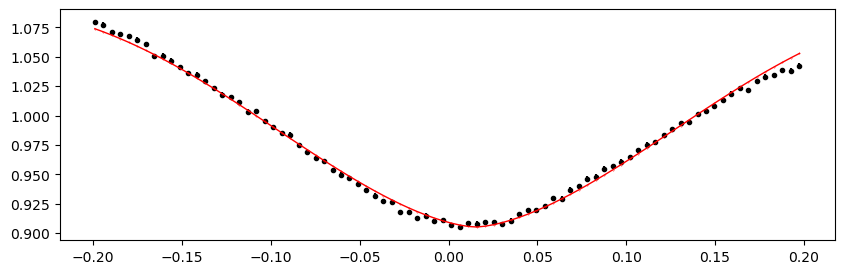

2489.5994878 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.51it/s]


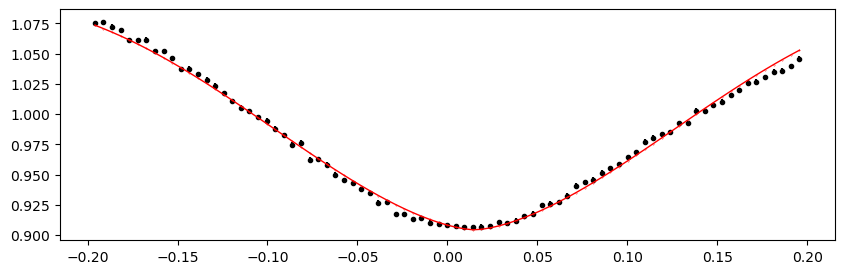

2489.8902665 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.92it/s]


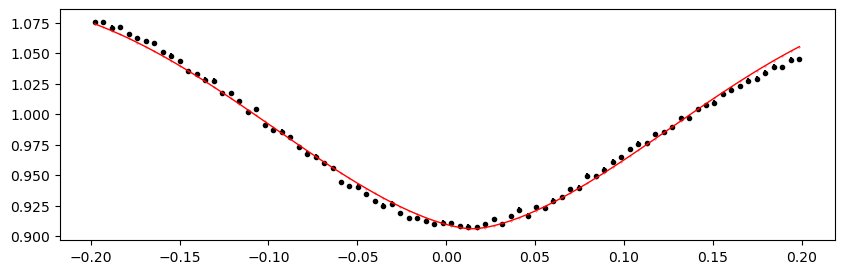

2490.1810452 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.89it/s]


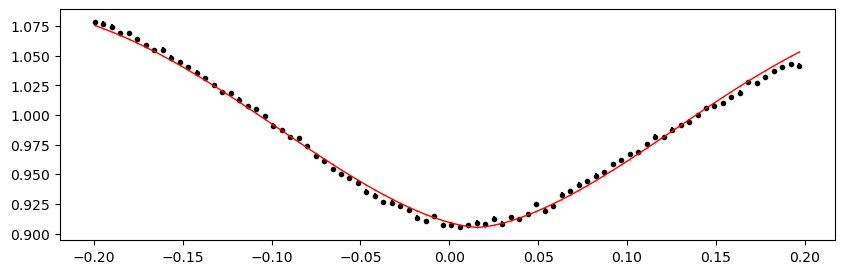

2490.4718239000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.91it/s]


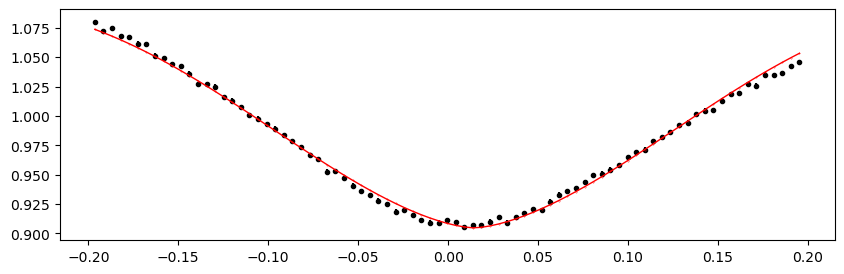

2490.7626026 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.52it/s]


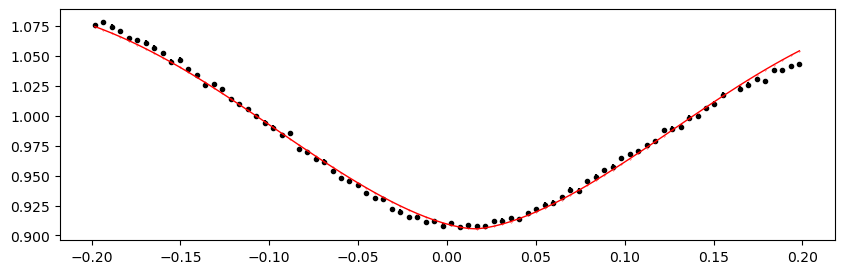

2491.0533813 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.12it/s]


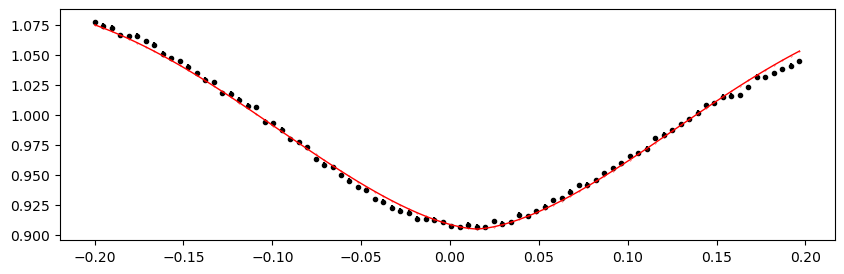

2491.34416 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.62it/s]


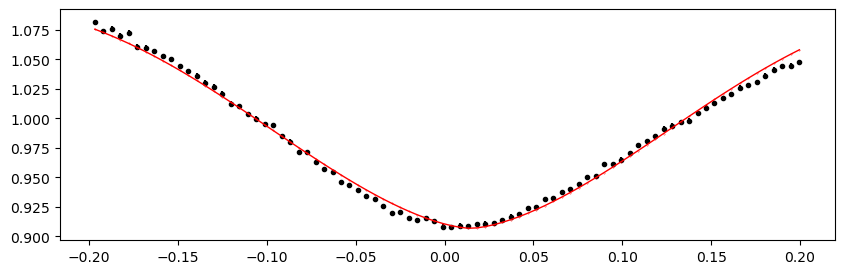

2491.6349387 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.11it/s]


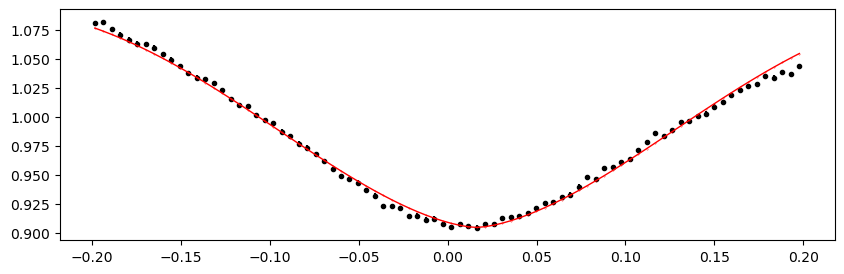

2491.9257174 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.24it/s]


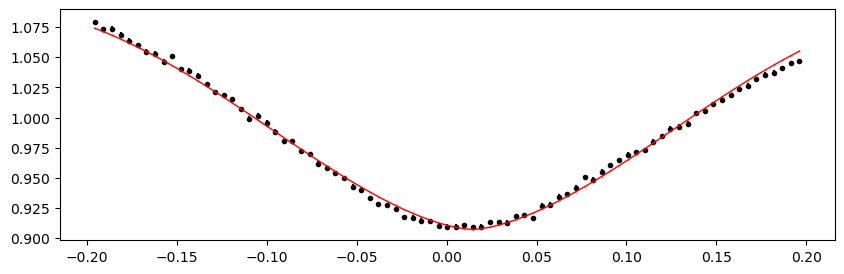

2492.2164961 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.52it/s]


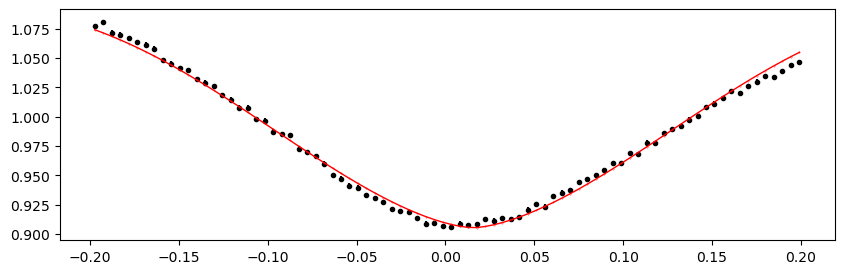

2492.5072748000002 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.89it/s]


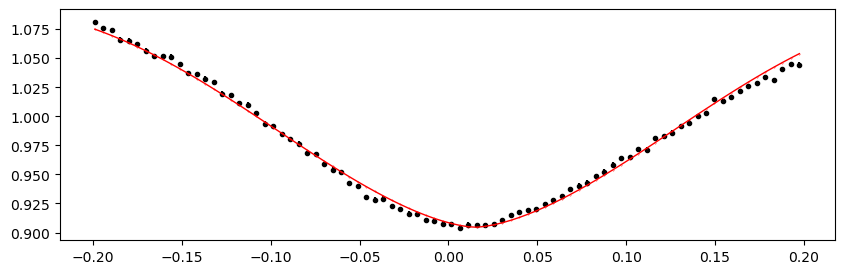

2492.7980535 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.51it/s]


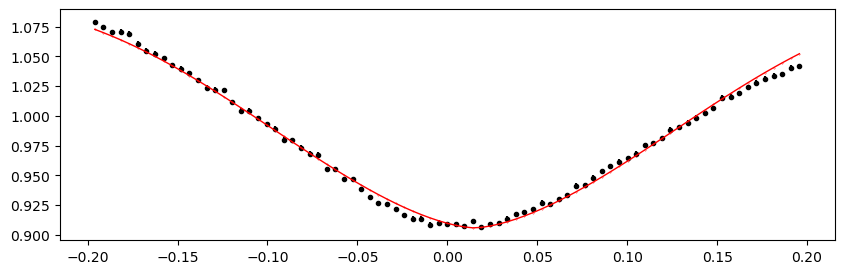

2493.0888322 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.45it/s]


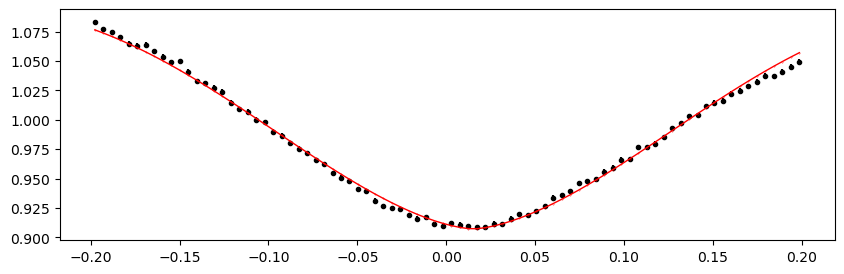

2493.3796109 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.63it/s]


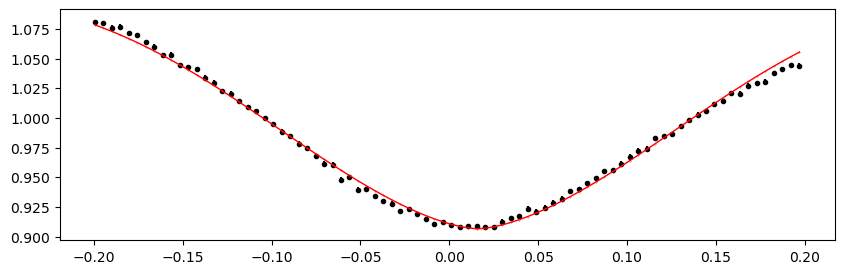

2493.6703896 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.92it/s]


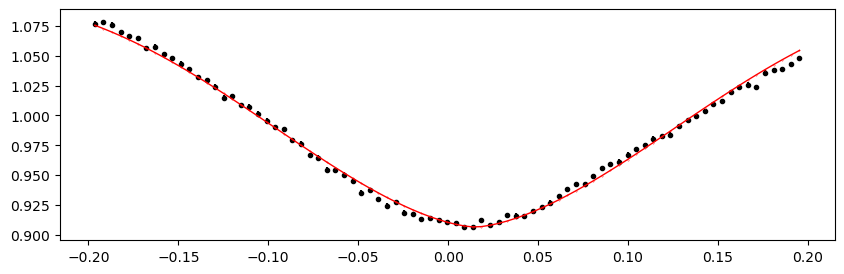

2493.9611683000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.76it/s]


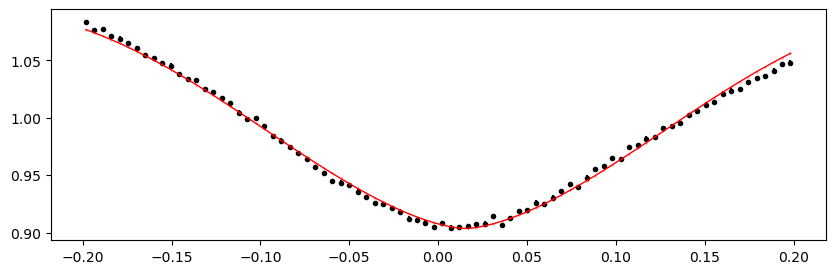

2494.2519469999997 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.30it/s]


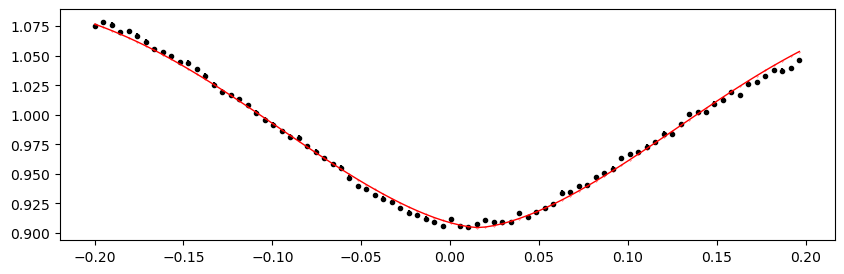

2494.5427257 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.94it/s]


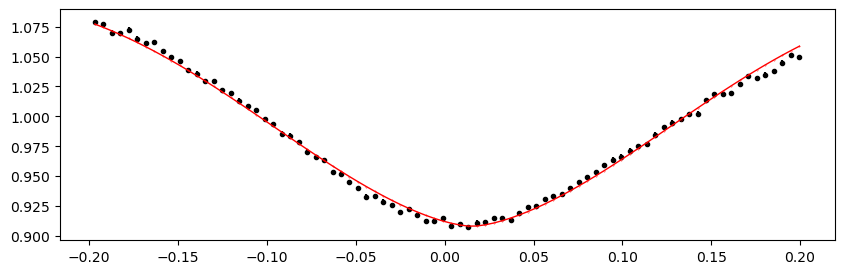

2494.8335044 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.92it/s]


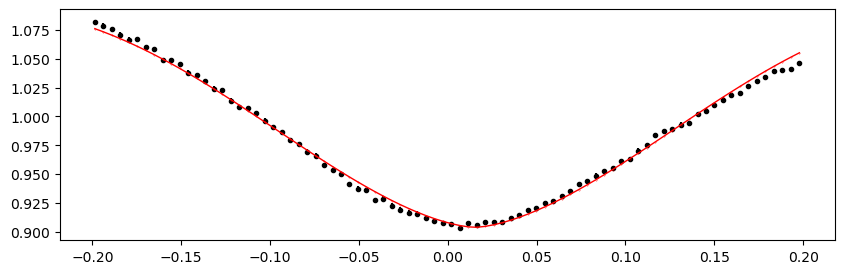

2495.1242831 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.35it/s]


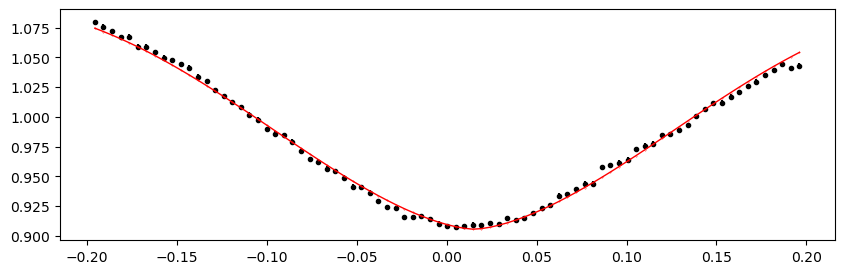

2495.4150618000003 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.08it/s]


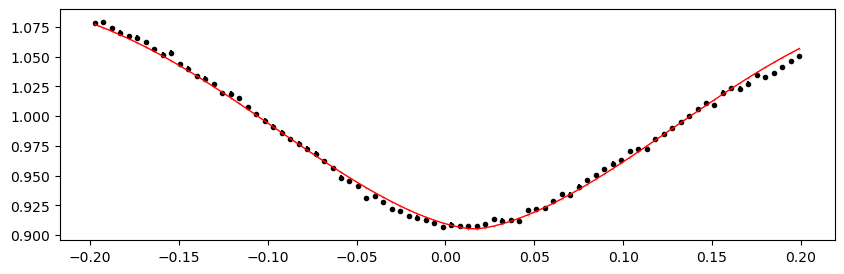

2495.7058405 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.79it/s]


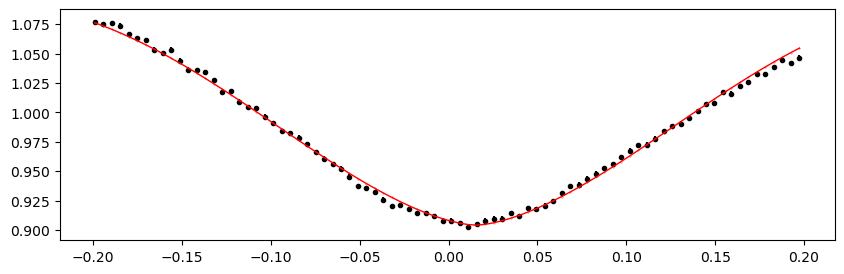

2495.9966192 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.27it/s]


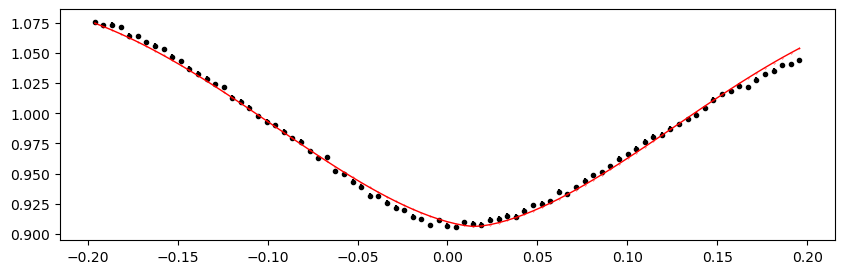

2496.2873979 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.52it/s]


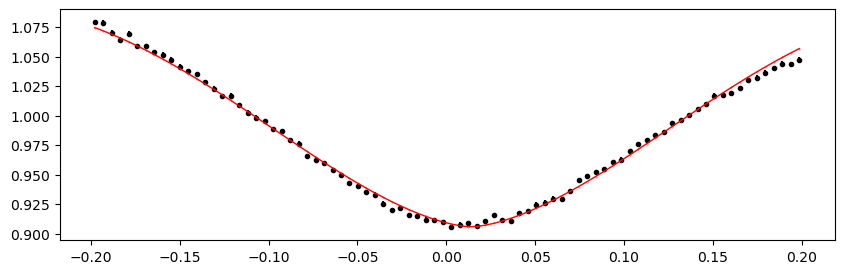

2496.5781766 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.80it/s]


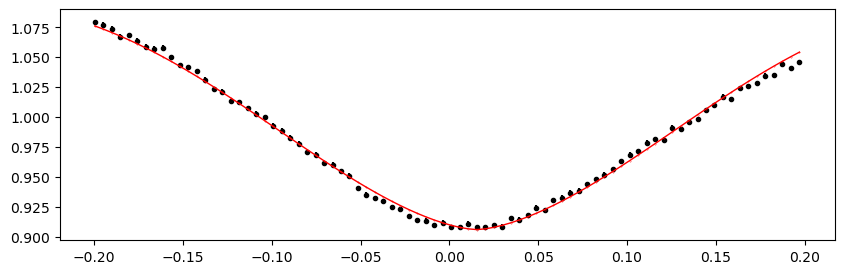

2496.8689553000004 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.45it/s]


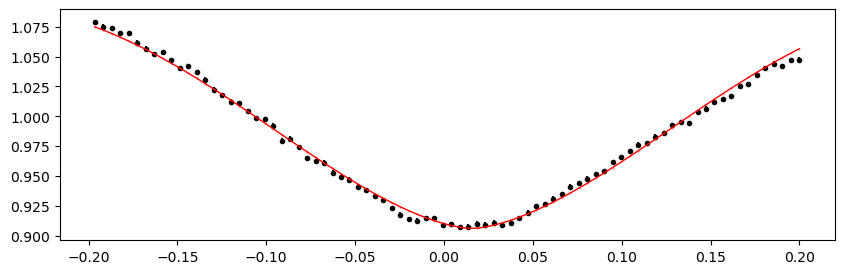

2497.159734 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.01it/s]


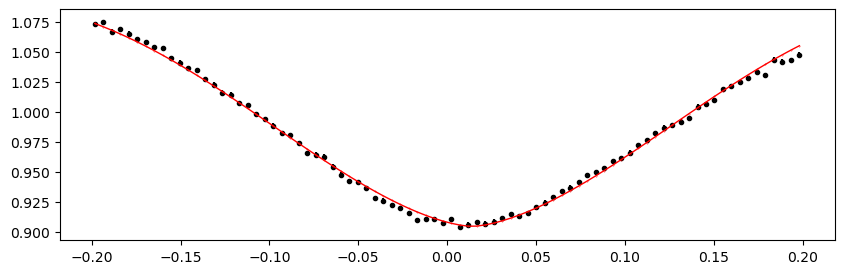

2497.4505127 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.91it/s]


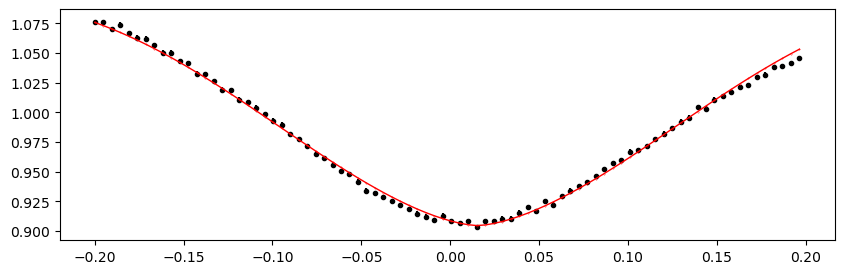

2497.7412914 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.92it/s]


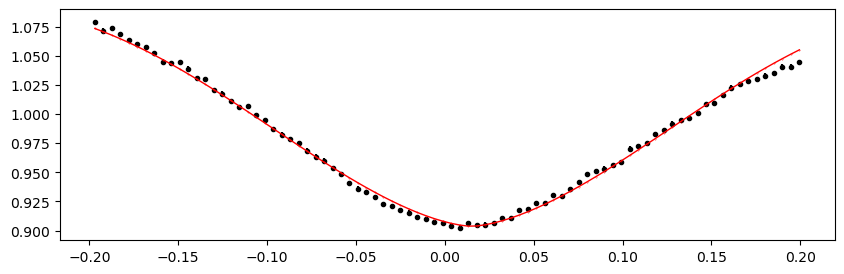

2498.0320701 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.95it/s]


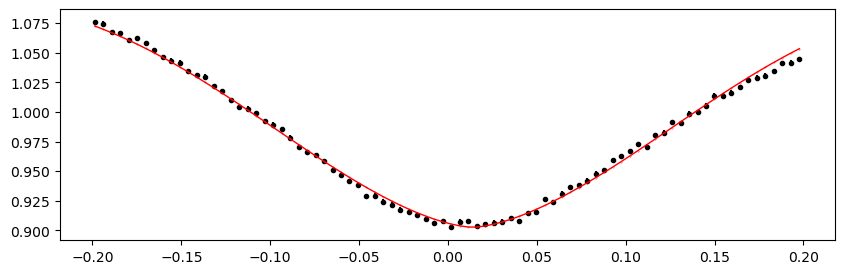

In [76]:
%matplotlib inline

# from importlib import reload
# reload(etv_functions)

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path,
                               min_number_data=5,  # accomodate TESS-SPOC 30min cadence in sector 3
                              )
!$NOTIFY_CMD "Individual primary eclipses fit done"

# ---

%matplotlib inline

if t0_secondary is not None:
    print("Fitting individual secondary eclipses...")
    etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s,
                               min_number_data=5,  # accomodate TESS-SPOC 30min cadence in sector 3
                                  )
    !$NOTIFY_CMD "Individual secondary eclipses fit done"
else:
    print("No secondary eclipses defined. No-Op.")


Fitting individual secondary eclipses...
Creating new manifest file
1386.0943213 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.74it/s]


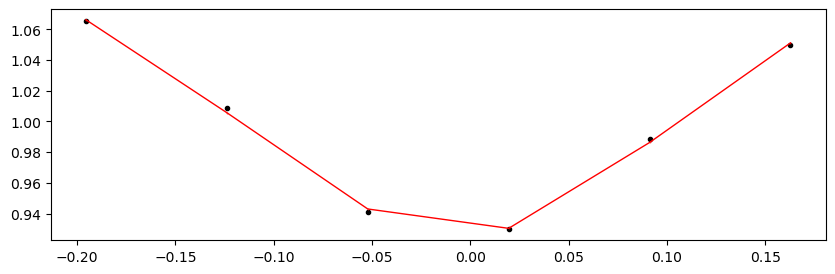

1386.3851 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.64it/s]


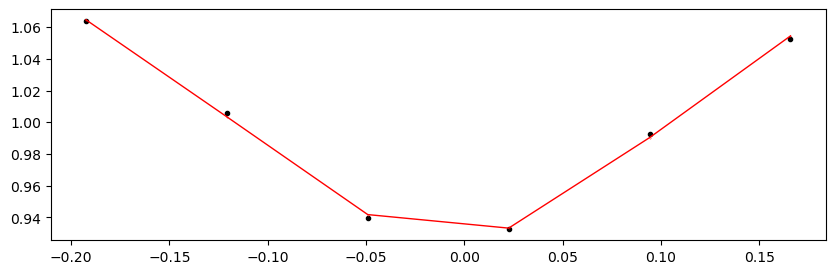

1386.6758787 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.08it/s]


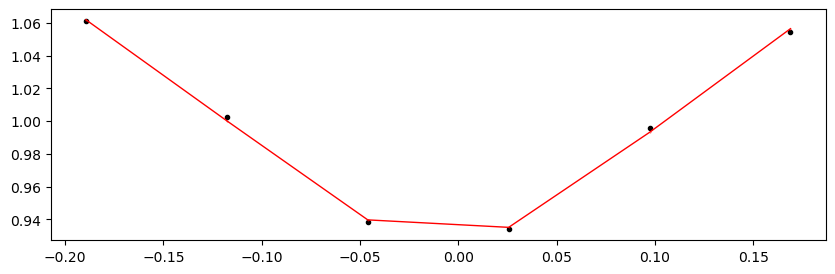

1386.9666574 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 416.69it/s]


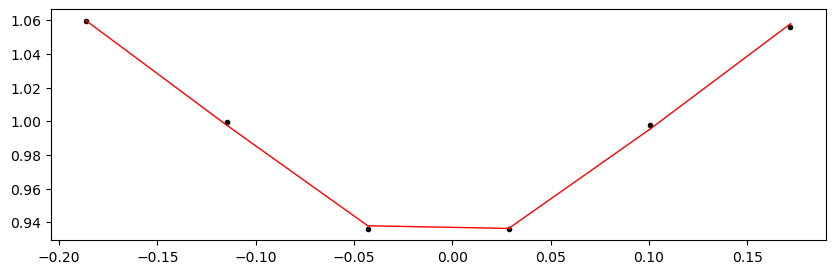

1387.2574361 1.0983218462122912 -0.1930138026884863 -0.25995837018406465


  6%|███▎                                                     | 587/10000 [00:01<00:22, 422.47it/s]Traceback (most recent call last):
  File "C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\emcee\ensemble.py", line 624, in __call__
    return self.f(x, *self.args, **self.kwargs)
  File "C:\dev\_juypter\PH_TESS_LightCurveViewer\eb_with_diff_sb_period\etv\etv_functions.py", line 535, in log_probability_fitting
    lnp = lp + log_likelihood_fitting(theta, x, y, yerr, mean_d, mean_Tau)
  File "C:\dev\_juypter\PH_TESS_LightCurveViewer\eb_with_diff_sb_period\etv\etv_functions.py", line 526, in log_likelihood_fitting
    return -0.5 * np.sum((y - model) ** 2 / (yerr**2))
  File "C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\numpy\core\fromnumeric.py", line 2172, in _sum_dispatcher
    def _sum_dispatcher(a, axis=None, dtype=None, out=None, keepdims=None,
KeyboardInterrupt
  6%|███▌                                                     | 624/10000 [00:

emcee: Exception while calling your likelihood function:
  params: [ 1.10439204 -0.18130487 -0.00582075]
  args: (array([-0.1832462 , -0.11159948, -0.03995277,  0.03169394,  0.10334066,
        0.17498736]), array([1.0586005 , 0.99637794, 0.9340105 , 0.9382181 , 1.0015799 ,
       1.057869  ], dtype=float32), array([0.00046204, 0.00045336, 0.00044466, 0.00044522, 0.00045422,
       0.00046187], dtype=float32), 0.12630208898697917, 0.7929011775071911)
  kwargs: {}
  exception:


KeyboardInterrupt: 

## ETV O-C plot

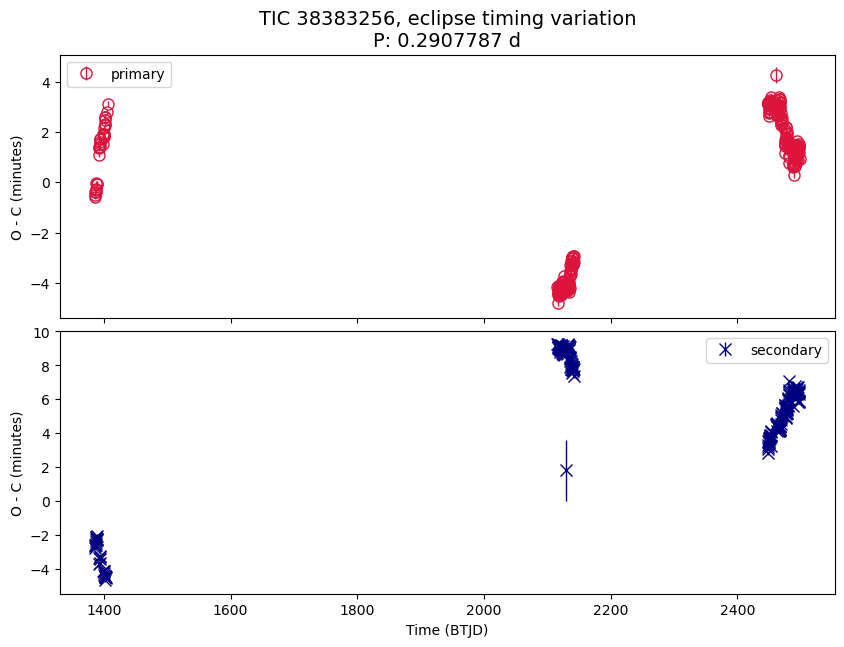

In [15]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'], 
#              lw = 1, color = 'crimson', )
# axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
#              marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'], 
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    # axs[1].plot(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              lw = 1, color = 'navy', )
    # axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'], 
                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
else:
    in_df_secondary = None

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, eclipse timing variation\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
# plt.ylim(-3, 8)
plt.show()

### O-C Plot, Zoom In

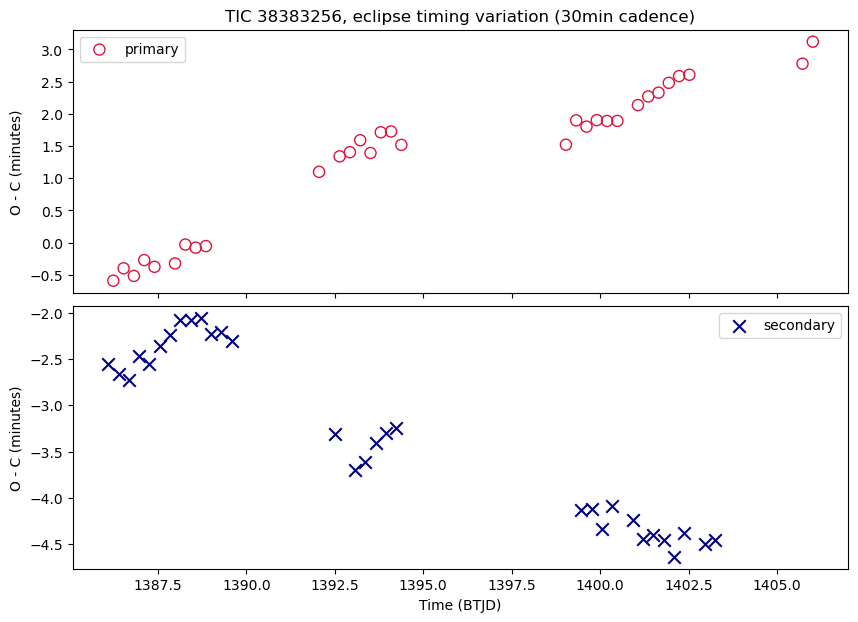

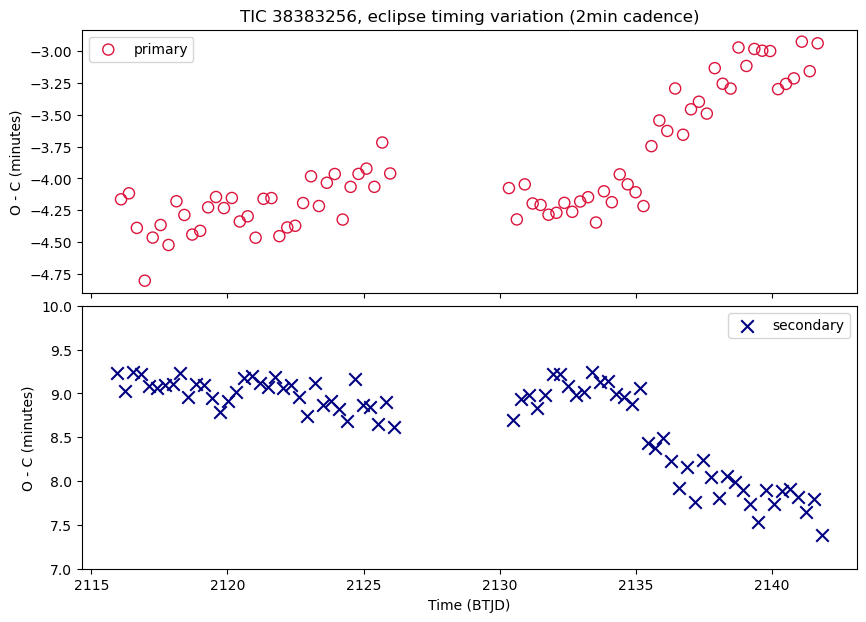

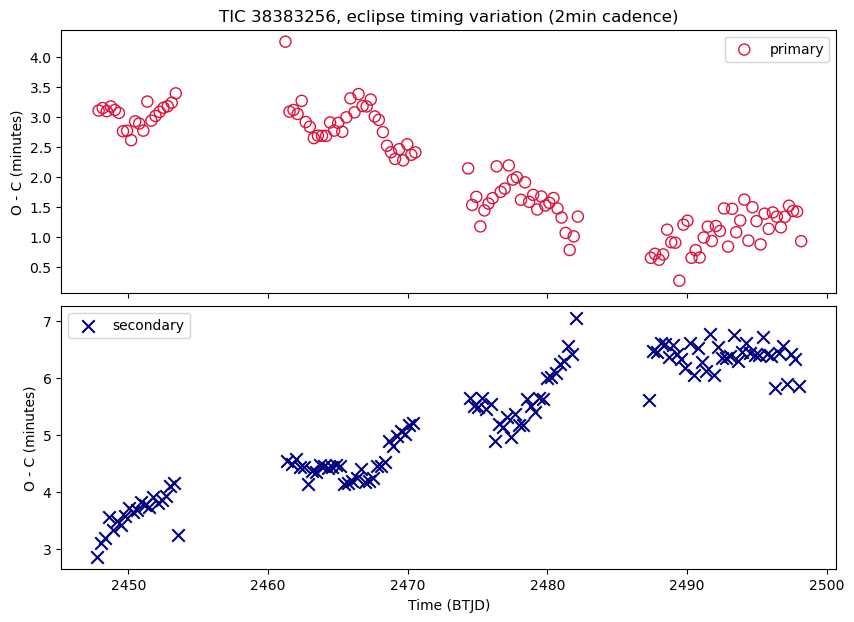

In [22]:
%matplotlib inline
# %matplotlib widget

zoom_ranges = [
    (1300, 1450),
    (2050, 2200),
    (2400, 2600),
]
title_suffix = "eclipse timing variation"

def tweak_axs_list(axs_list):
    # axs_list[0][1].set_ylim(-20, 30);
    # axs_list[1][0].set_ylim(None, 0.5);
    axs_list[1][1].set_ylim(7, 10);

    ax = axs_list[0][0]
    ax.set_title(f"{ax.get_title()} (30min cadence)")
    ax = axs_list[1][0]
    ax.set_title(f"{ax.get_title()} (2min cadence)")
    ax = axs_list[2][0]
    ax.set_title(f"{ax.get_title()} (2min cadence)")
    
    pass


def plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges):
    axs_list = []
    for zoom_start, zoom_end in zoom_ranges:
        num_rows = 2 if t0_secondary is not None else 1
        figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
    
        fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
        if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
            axs = [axs]
        
        df_zoom = in_df_primary[(in_df_primary['epoch'] > zoom_start) & (in_df_primary['epoch'] < zoom_end)]
              
        axs[0].scatter(df_zoom['epoch'], df_zoom['shift_mins'], 
                       marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
        # axs[0].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'], 
        #                 lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")
        
        if in_df_secondary is not None:
            df_zoom = in_df_secondary[(in_df_secondary['epoch'] > zoom_start) & (in_df_secondary['epoch'] < zoom_end)]
        
            axs[1].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
                           marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
            # axs[1].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
            #                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
        
        for ax in axs:
            ax.set_ylabel("O - C (minutes)")
            ax.legend();
        
        axs[-1].set_xlabel("Time (BTJD)")
        axs[0].set_title(f"TIC {ticid}, {title_suffix}", fontsize=14)
        
        plt.subplots_adjust(hspace=0.05)
        axs_list.append(axs)
    return axs_list


axs_list = plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges)
tweak_axs_list(axs_list);

## make a periodogram 

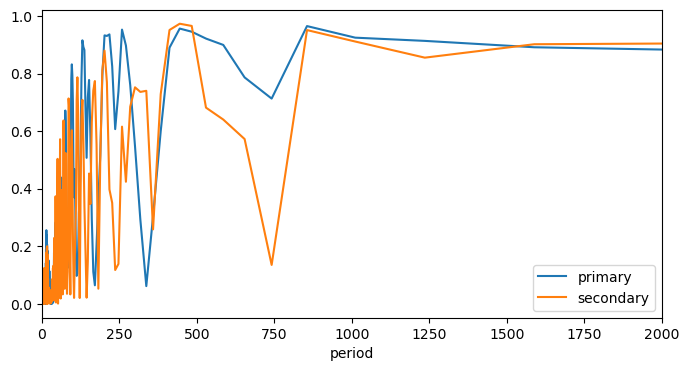

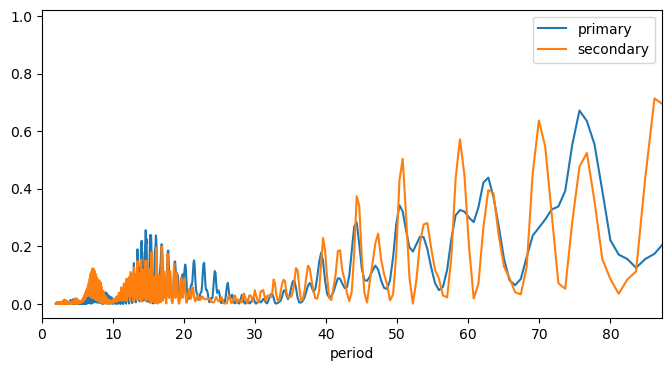

In [19]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()

fig, ax = plt.subplots(figsize=(8, 4))

plt.plot(1/frequency, power, label = 'primary')    

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
    plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")

plt.legend()
plt.xlim(0, 2000)
plt.show()


if True:
    fig, ax = plt.subplots(figsize=(8, 4))
    
    plt.plot(1/frequency, power, label = 'primary')    
    
    if t0_secondary is not None:
        frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
        plt.plot(1/frequency_s, power_s, label = 'secondary')    
    
    plt.xlabel("period")
    
    plt.legend()
    plt.xlim(0, period * 300)
    plt.show()

## O-C plot, folded

- for periodic trend in O-C

In [20]:
def truncate_freq_power_to_period_range(freq, power, period_min, period_max):
    f, p = freq, power
    if period_min is not None:
        f, p = f[f < 1 / period_min], p[f < 1 / period_min]
    if period_max is not None:
        f, p = f[f > 1 / period_max], p[f >  1 / period_max]
    return f, p


def plot_oc_folded(period_min=None, period_max=None, period_min_s=None, period_max_s=None, period=None, period_s=None):

    if period is None:
        _f, _p = truncate_freq_power_to_period_range(frequency, power, period_min, period_max)
        period = 1 / _f[np.argmax(_p)]
    phase_oc = etv_functions.phase_data(in_df_primary.epoch, 0, period)

    fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y * 1.1), sharex=False)
    if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
        axs = [axs]
    
    axs[0].scatter(phase_oc, in_df_primary.shift_mins, marker = 'o', s=12**2, c=in_df_primary.epoch);
    axs[0].errorbar(phase_oc, in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
                    lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'None', label="primary")
    axs[0].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period:.4f} d", fontsize=14)

    if in_df_secondary is not None:
        if period_s is None:
            _f, _p = truncate_freq_power_to_period_range(frequency_s, power_s, period_min_s, period_max_s)
            period_s= 1 / _f[np.argmax(_p)]
        phase_oc_s = etv_functions.phase_data(in_df_secondary.epoch, 0, period_s)
        axs[1].scatter(phase_oc_s, in_df_secondary.shift_mins, marker = 'o',  s=12**2, c=in_df_secondary.epoch);
        axs[1].errorbar(phase_oc_s, in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color='None', ecolor='navy', markeredgecolor = 'None', label="secondary" );
        axs[1].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period_s:.4f} d", fontsize=14)

    for ax in axs:
        ax.set_ylabel("O - C (minutes)")
        ax.set_xlabel("Phase (Normalized)")
        ax.legend();
    plt.subplots_adjust(hspace=0.4)
    return axs

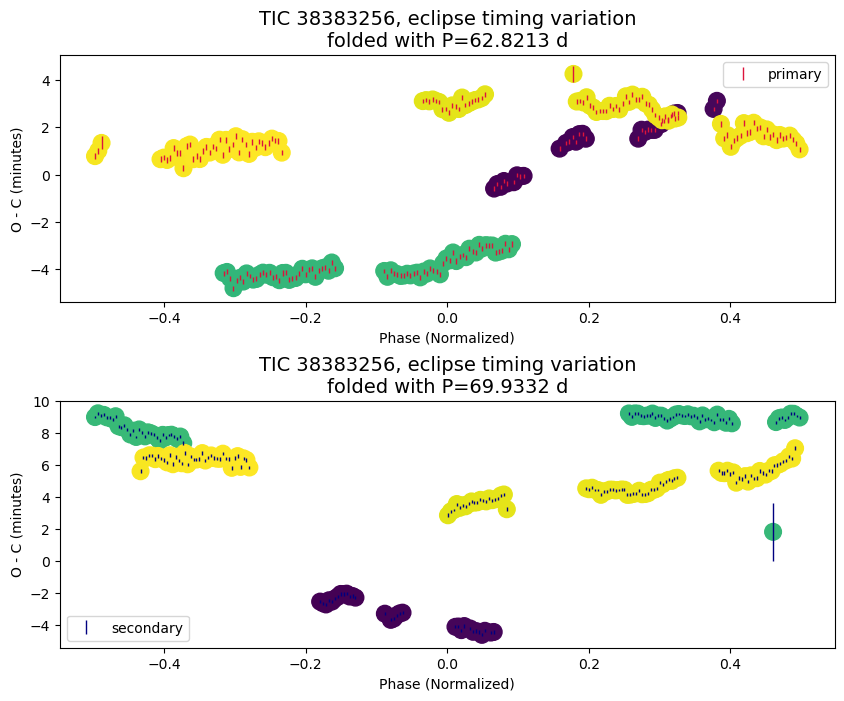

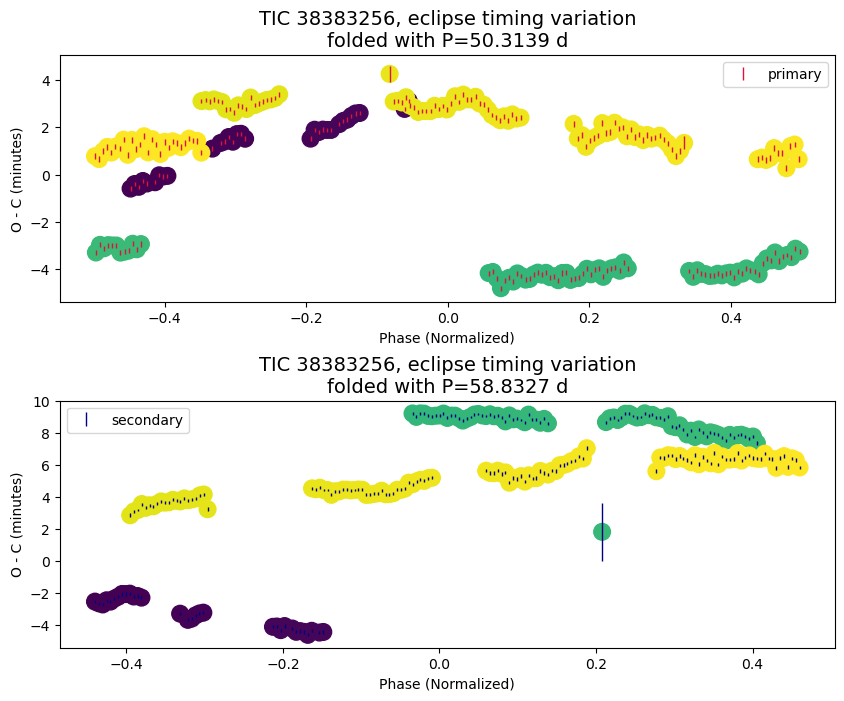

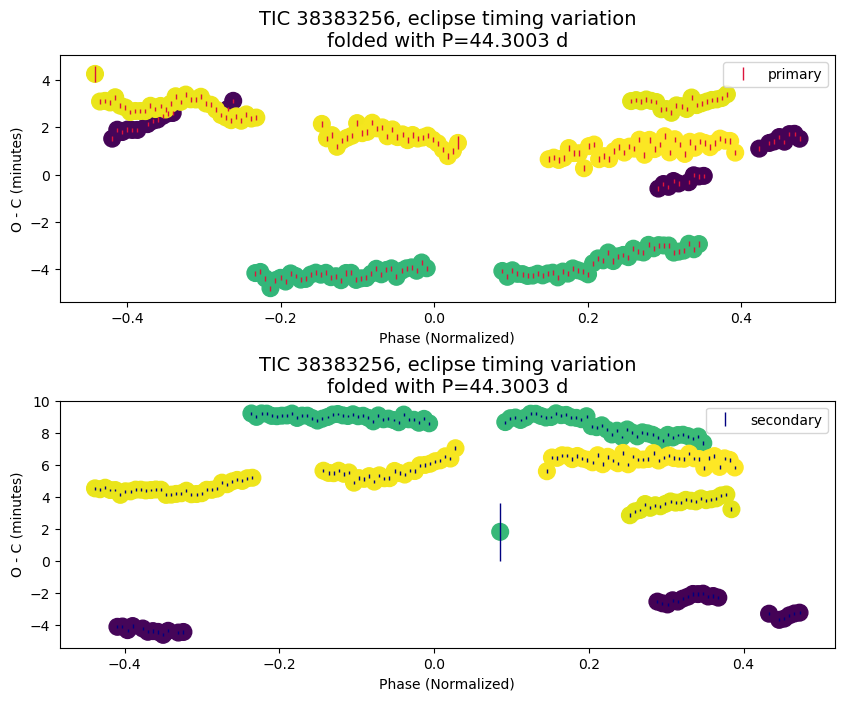

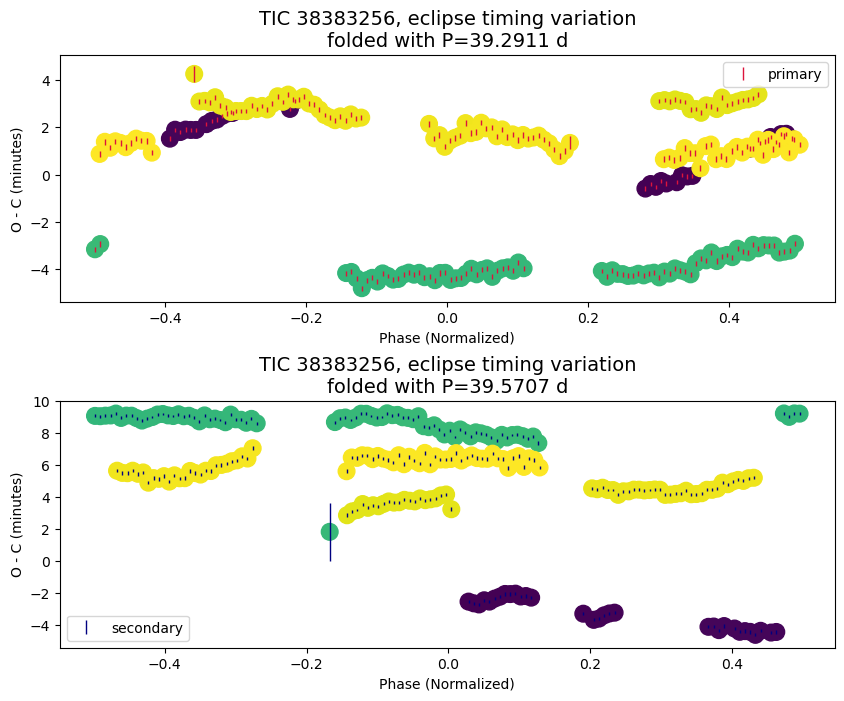

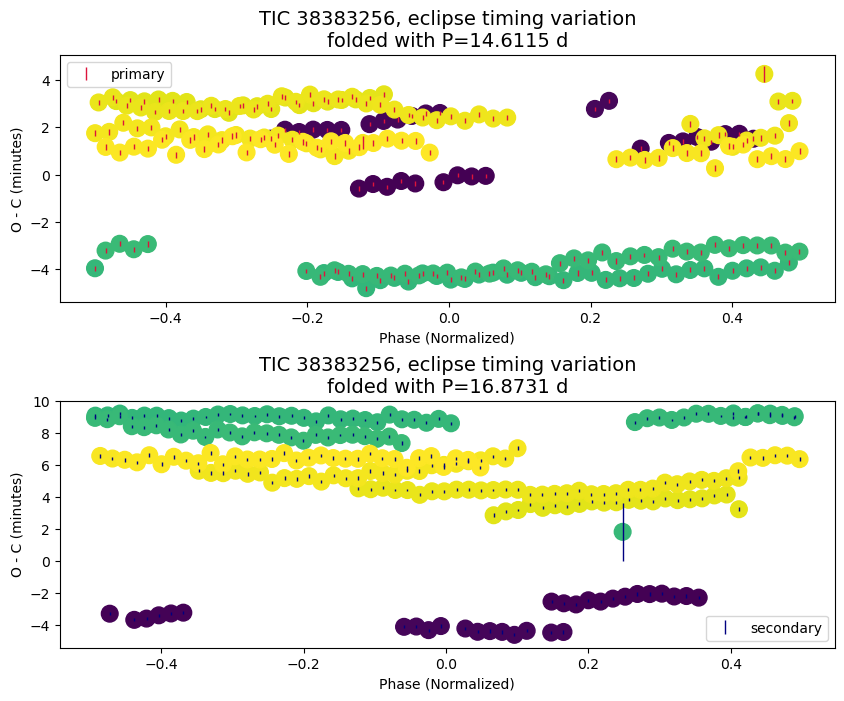

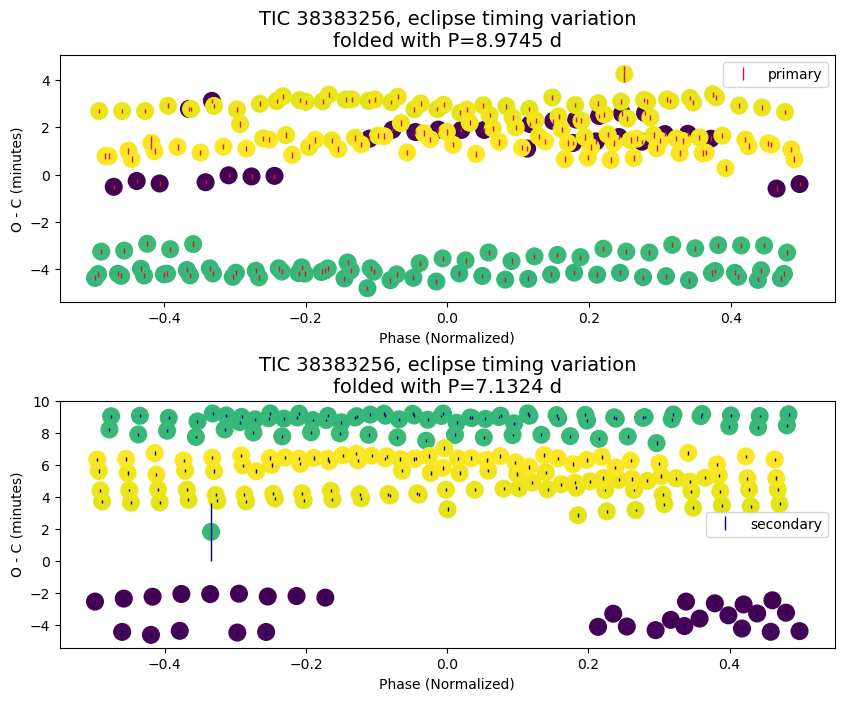

In [29]:
%matplotlib inline
# %matplotlib widget

if True:  # plot O-C periodic trend by folding with a period (from LS Periodogram by default)
    def tweak_axs(axs):
        pass

    axs = plot_oc_folded(
        period_min=None, period_max=70,
        period_min_s=None, period_max_s=70
    )
    tweak_axs(axs)

    axs = plot_oc_folded(
        period_min=None, period_max=60,
        period_min_s=None, period_max_s=60
    )
    tweak_axs(axs)

    axs = plot_oc_folded(
        period_min=None, period_max=50,
        period_min_s=None, period_max_s=50
    )
    tweak_axs(axs)

    axs = plot_oc_folded(
        period_min=30, period_max=40,
        period_min_s=30, period_max_s=40
    )
    tweak_axs(axs)

    axs = plot_oc_folded(
        period_min=None, period_max=30,
        period_min_s=None, period_max_s=30
    )
    tweak_axs(axs)

    axs = plot_oc_folded(
        period_min=None, period_max=10,
        period_min_s=None, period_max_s=10
    )
    tweak_axs(axs)

## Results Summary

In [85]:
# FILL-IN the ETV results / comments
has_etv = "Y?"
comments = "Possible long-term (1000+ d) non-linear-like change with amplitude ~6min in primary. The trend of primary is opposite of the one of secondary. Sector 70 QLP data is omitted for expediency (depth is different). Gaia DR3 Var classifies it as a DSCT like."

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,38383256
has_etv,Y?
comments,The trend of primary is opposite of the one of secondary. Sector 70 QLP data is omitted for expediency (depth is different). Gaia DR3 Var classifies it as a DSCT like.
period,0.290779
depth_pct_p,18.28
depth_pct_s,19.3
epoch_p,1386.2376
epoch_s,1386.094321
num_sectors,4
time_span,1112.92



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
38383256,Y?,The trend of primary is opposite of the one of secondary. Sector 70 QLP data is omitted for expediency (depth is different). Gaia DR3 Var classifies it as a DSCT like.,0.2907787,18.28,19.3,1386.2376,1386.0943213,4,1112.92,1385.97,2498.89

